A notebook for processing images acquired with the OROCHI simulator to reflectance, with coalignment by stereo geometric calibration.

Experiments performed on 28/04/2023

- Reflectance Calibration
- Geometric Calibration
- Dark Calibration Target
- Sample 1
- Sample 2
- Sample 3
- Sample 4
- Sample 5

In [72]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Overview

The steps of processing are:
1. Calibration Preparation:
    - Load, average and bias correct Calibration Target images
    - Correct for exposure
    - Load reference reflectance for each channel
    - Scale images to give reflectance calibration coefficient for each pixel
    - Optional: mask for Calibration Target
    - Save reflectance calibration images
3. Geometric Calibration
    - Load, average and bias correct Geometric images
    - Balance images (TBD)
    - Extract camera geometric calibration coefficients (TBD)    
2. Sample Reflectance Calibration and Coalignment
    - Load, average and bias correct Sample images
    - Correct for exposure
    - Apply calibration coefficient frames
    - Optional: mask for Calibration Target area and Sample area.
    - Save reflectance images
    - Apply geometric coalignment
    - Save coaligned images over Region of Interest


# Setup

In [73]:
import orochi_sim_proc as osp

# Calibration Preparation
For each channel:
- Load, average and bias correct Calibration Target images
- Correct for exposure
- Load reference reflectance for each channel
- Scale images to give reflectance calibration coefficient for each pixel
- Optional: mask for Calibration Target
- Save reflectance calibration images

Loading Calibration Target for: 0 (650 nm)
Loading Calibration Target for: 1 (475 nm)
Loading Calibration Target for: 3 (400 nm)
Loading Calibration Target for: 4 (725 nm)
Loading Calibration Target for: 5 (850 nm)
Loading Calibration Target for: 6 (550 nm)
Loading Calibration Target for: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Finding Reflectance Correction for: 0 (650 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:338: RuntimeWarning: divide by zero encountered in divide
  self.img_stk = self.reference_reflectance / self.img_stk
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:339: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.reference_reflectance / self.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:340: RuntimeWarning: divide by zero encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:340: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave


Finding Reflectance Correction for: 1 (475 nm)
Finding Reflectance Correction for: 3 (400 nm)
Finding Reflectance Correction for: 4 (725 nm)
Finding Reflectance Correction for: 5 (850 nm)
Finding Reflectance Correction for: 6 (550 nm)
Finding Reflectance Correction for: 7 (950 nm)


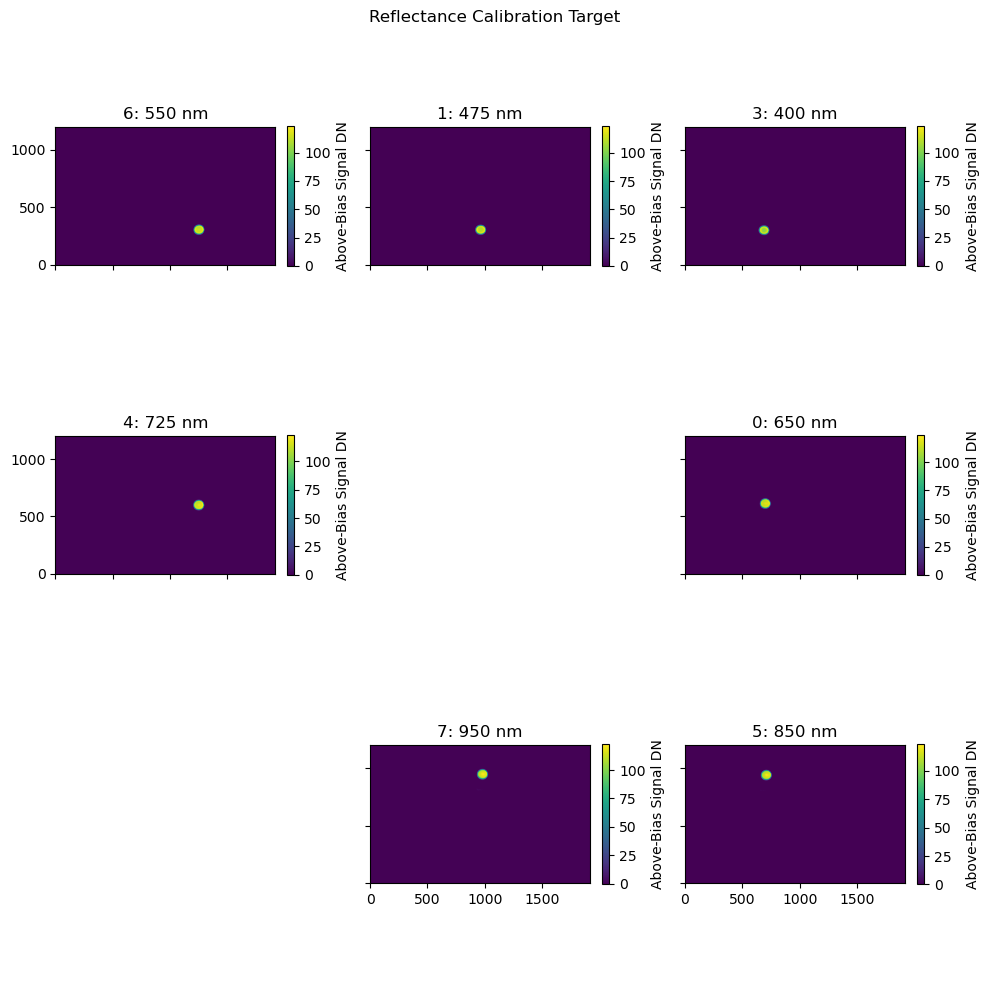

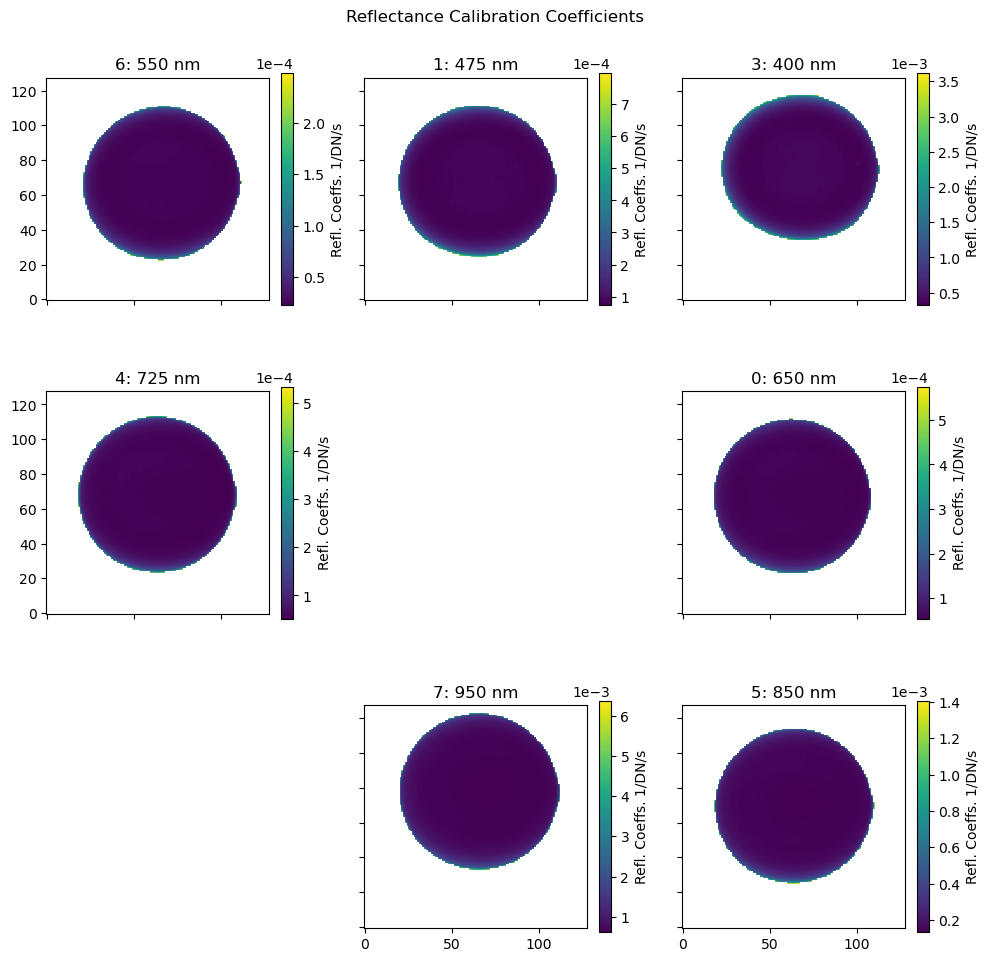

In [4]:
cali_imgs = osp.load_reflectance_calibration('reflectance_calibration')
cali_coeffs = osp.calibrate_reflectance(cali_imgs)


# Homography Calibration

Here we attempt to co-align images by finding the homography matrix between images of the calibration target cap writing.

- Load, average and bias correct geometric images
- choose destination/base image
- for each channel, find homography matrix mapping from channel/source to base
- apply image transformation for each channel.

Load the images of the geometric calibration target, and calibrate the homography matrices.

Loading Geometric Target for: 0 (650.0 nm)
Loading Geometric Target for: 1 (475.0 nm)
Loading Geometric Target for: 3 (400.0 nm)
Loading Geometric Target for: 4 (725.0 nm)
Loading Geometric Target for: 5 (850.0 nm)
Loading Geometric Target for: 6 (550.0 nm)
Loading Geometric Target for: 7 (950.0 nm)
Calibrating Homography for: 0 (650.0 nm)
...372 source points found
...372 destination points found
...297 matches found
Calibrating Homography for: 1 (475.0 nm)
...365 source points found


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: divide by zero encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


...372 destination points found
...292 matches found
Calibrating Homography for: 3 (400.0 nm)
...353 source points found
...372 destination points found
...282 matches found
Calibrating Homography for: 4 (725.0 nm)
...353 source points found
...372 destination points found
...282 matches found
Calibrating Homography for: 5 (850.0 nm)
...341 source points found
...372 destination points found
...272 matches found
Calibrating Homography for: 6 (550.0 nm)
...368 source points found
...372 destination points found
...294 matches found
Calibrating Homography for: 7 (950.0 nm)
...350 source points found
...372 destination points found
...280 matches found


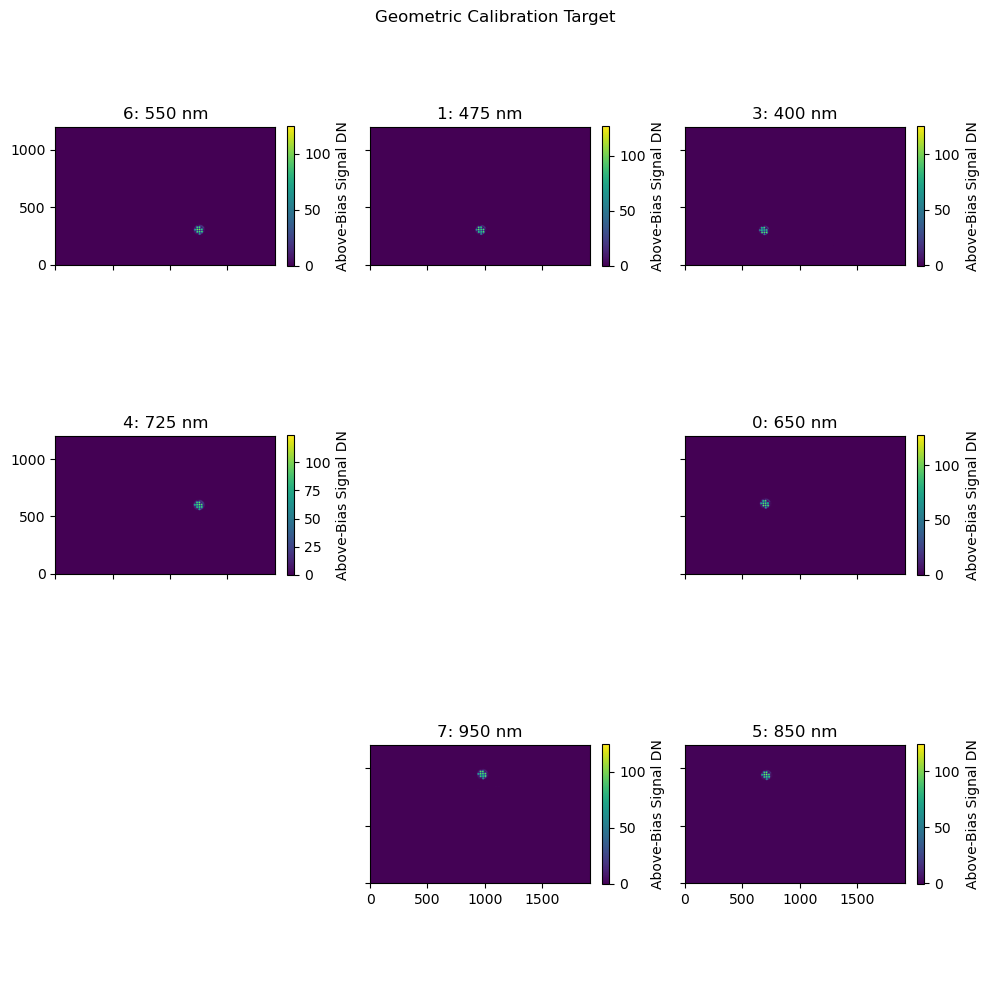

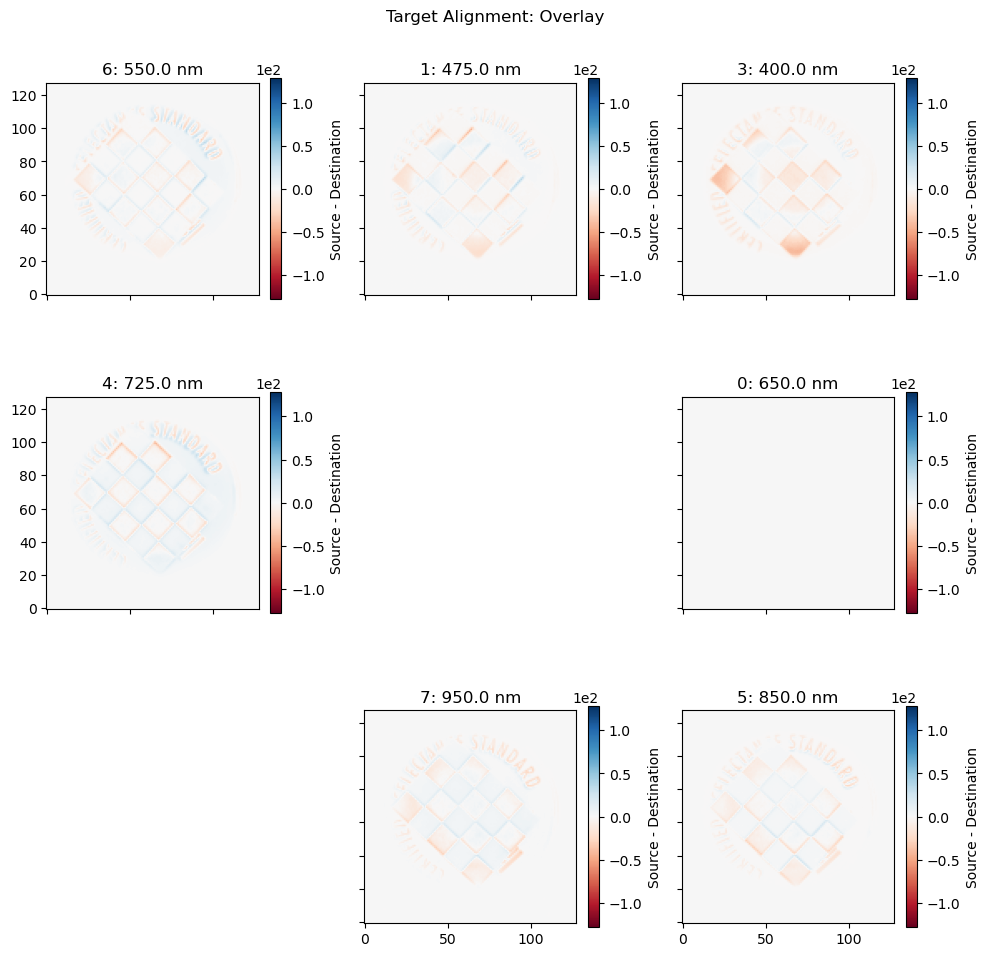

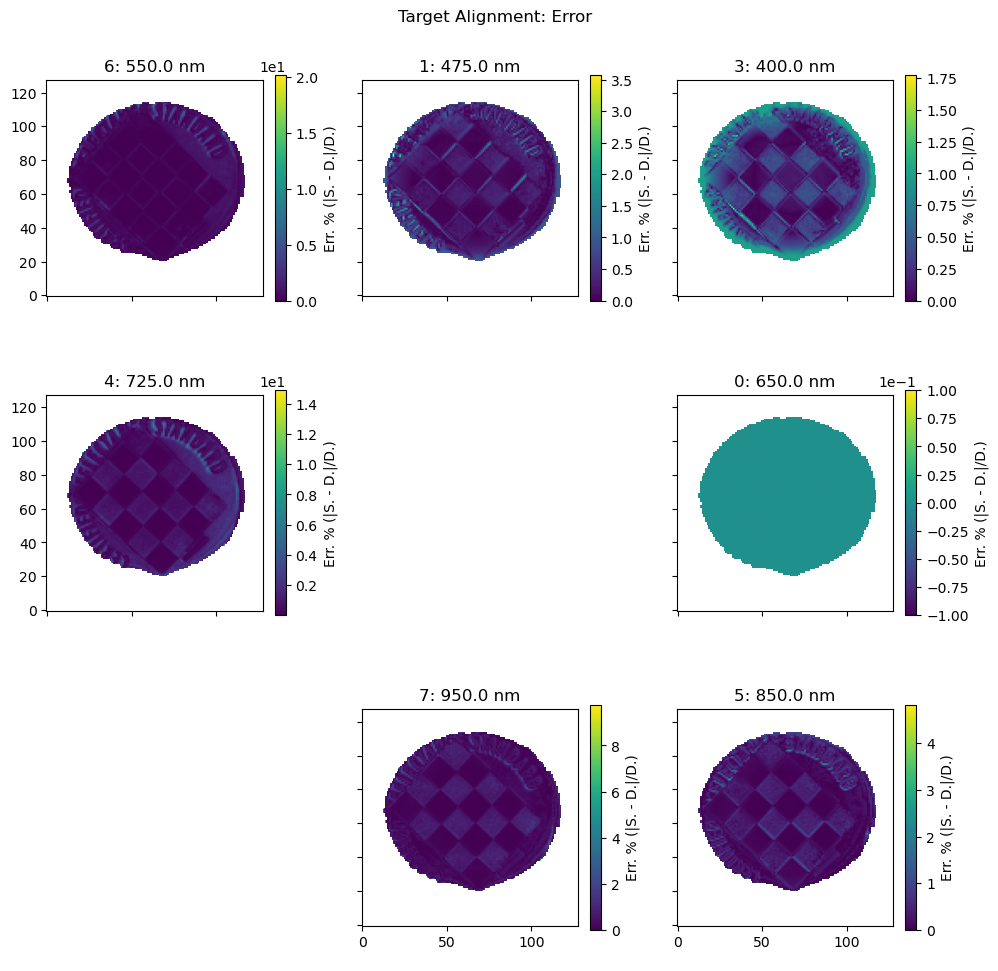

In [5]:
geocs = osp.load_geometric_calibration('geometric_calibration')
coals = osp.calibrate_homography(geocs)

# Sample Reflectance Calibration and Coalignment
- Load, average and bias correct Sample images
- Correct for exposure
- Apply calibration coefficient frames
- Optional: mask for Calibration Target area and Sample area.
- Save reflectance images

## Checking against the dark calibration target

- expect to be near 0.1, but not exactly 0.1

Loading dark_reflectance_calibration: 0 (650 nm)
Loading dark_reflectance_calibration: 1 (475 nm)
Loading dark_reflectance_calibration: 3 (400 nm)
Loading dark_reflectance_calibration: 4 (725 nm)
Loading dark_reflectance_calibration: 5 (850 nm)
Loading dark_reflectance_calibration: 6 (550 nm)
Loading dark_reflectance_calibration: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\dark_reflectance_calibration\0_650
Mean image written to ..\data\dark_reflectance_calibration\0_650\650_mean_rfl.tif
Error image written to ..\data\dark_reflectance_calibration\0_650\650_error_rfl.tif
..\data\dark_reflectance_calibration\1_475
Mean image written to ..\data\dark_reflectance_calibration\1_475\475_mean_rfl.tif
Error image written to ..\data\dark_reflectance_calibration\1_475\475_error_rfl.tif
..\data\dark_reflectance_calibration\3_400
Mean image written to ..\data\dark_reflectance_calibration\3_400\400_mean_rfl.tif
Error image written to ..\data\dark_reflectance_calibration\3_400\400_error_rfl.tif
..\data\dark_reflectance_calibration\4_725
Mean image written to ..\data\dark_reflectance_calibration\4_725\725_mean_rfl.tif
Error image written to ..\data\dark_reflectance_calibration\4_725\725_error_rfl.tif
..\data\dark_reflectance_calibration\5_850
Mean image written to ..\data\dark_reflectance_calibration\5_850\850_mean_rfl.tif
Error image written to ..\data\dark_ref

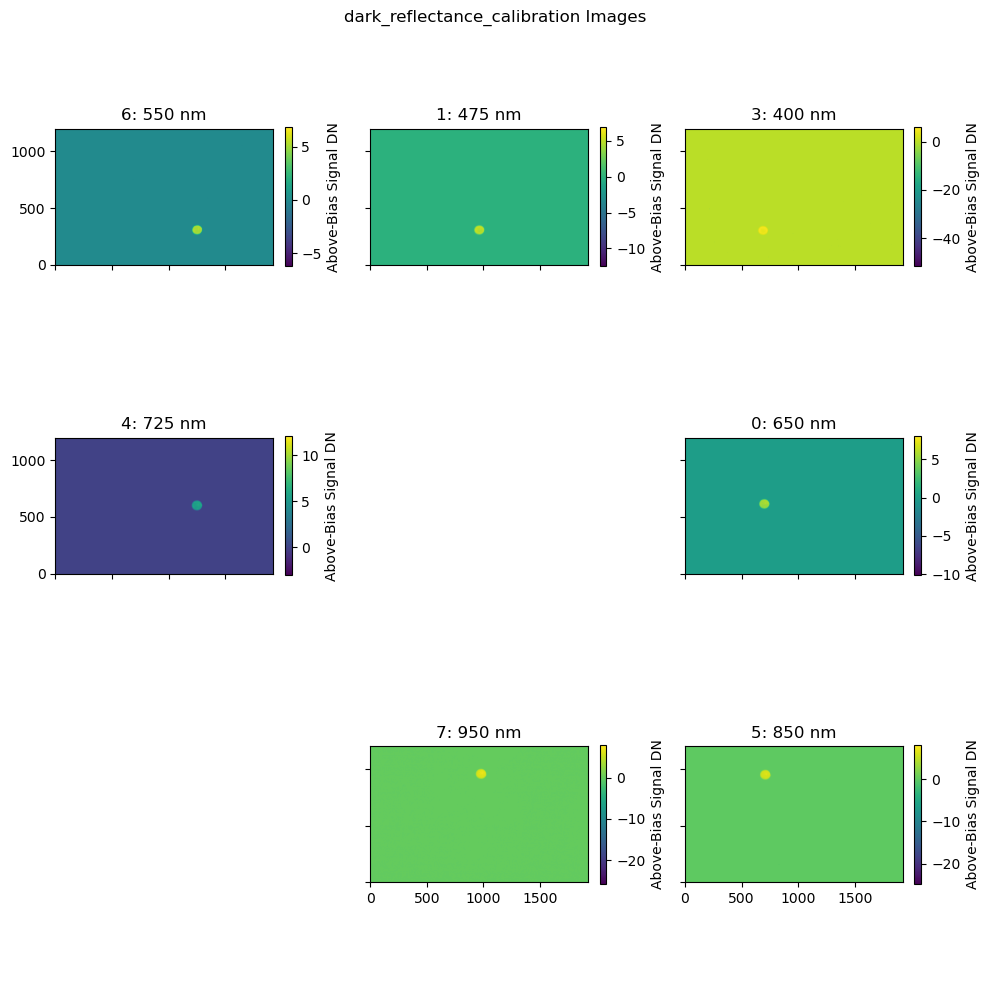

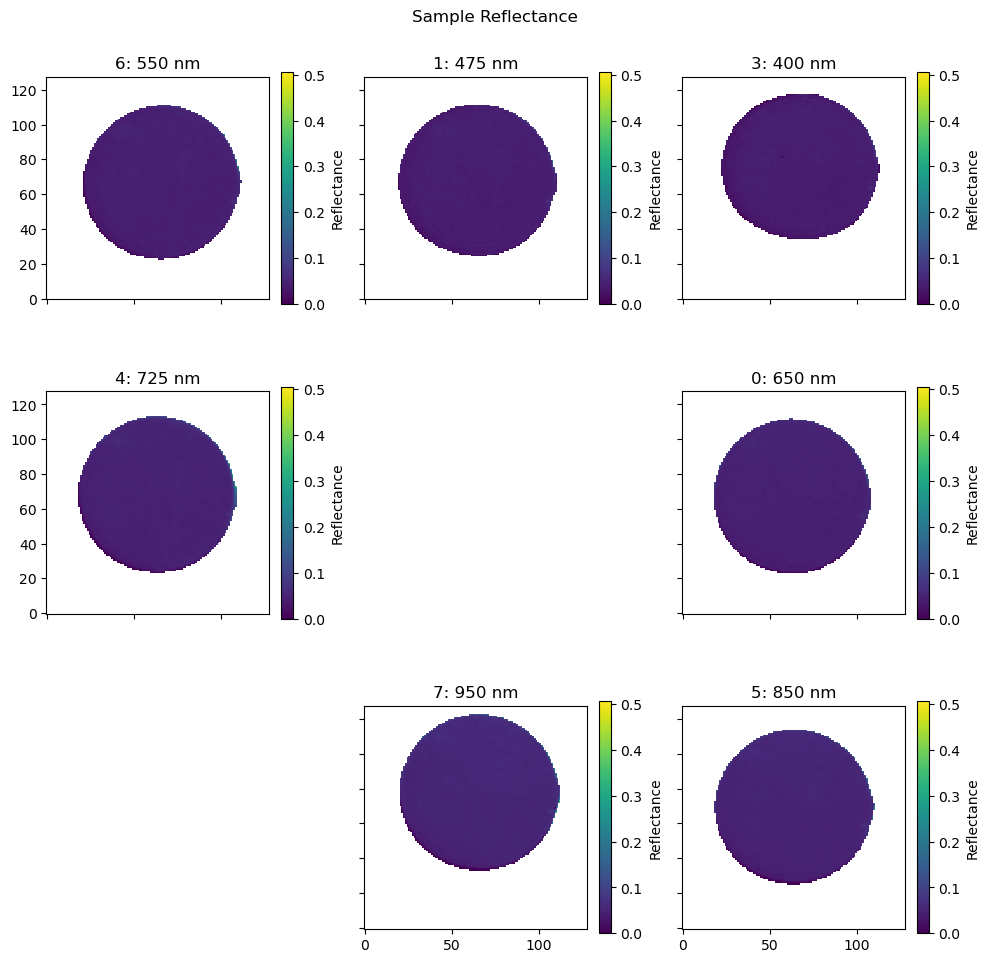

In [6]:
smpl_imgs = osp.load_sample('dark_reflectance_calibration')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


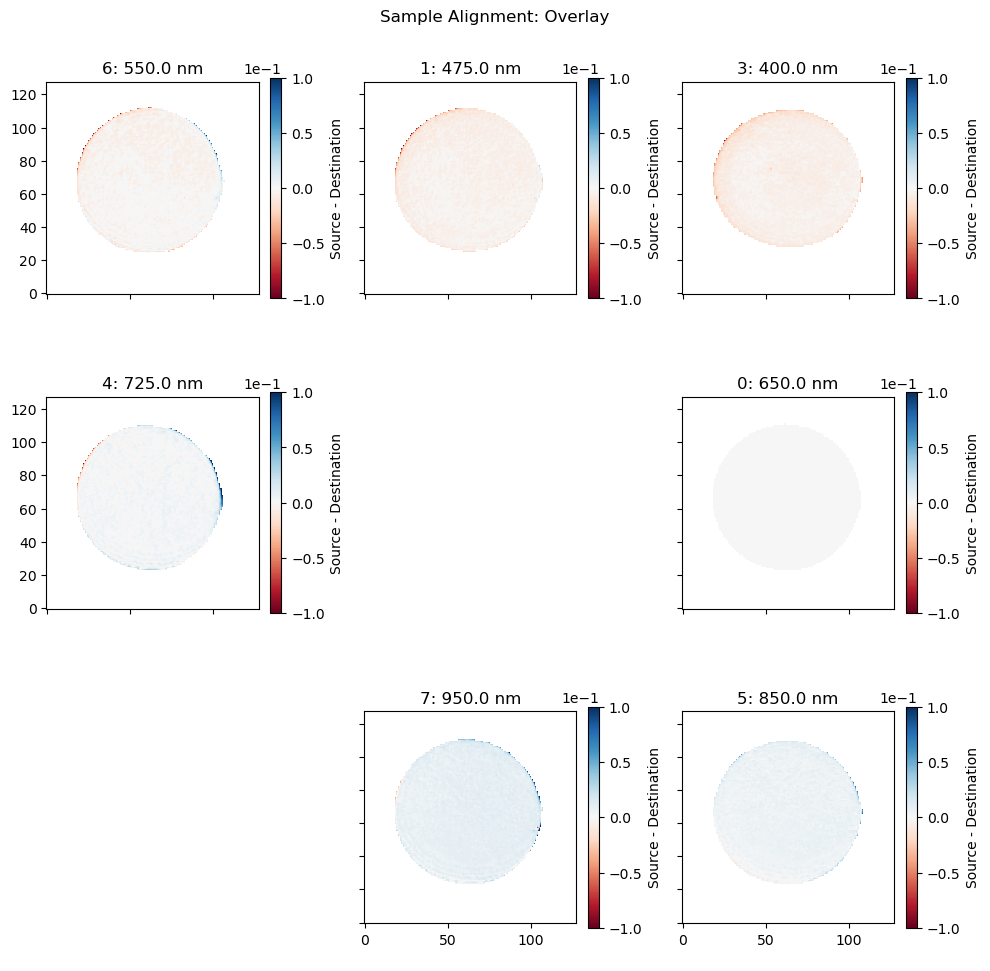

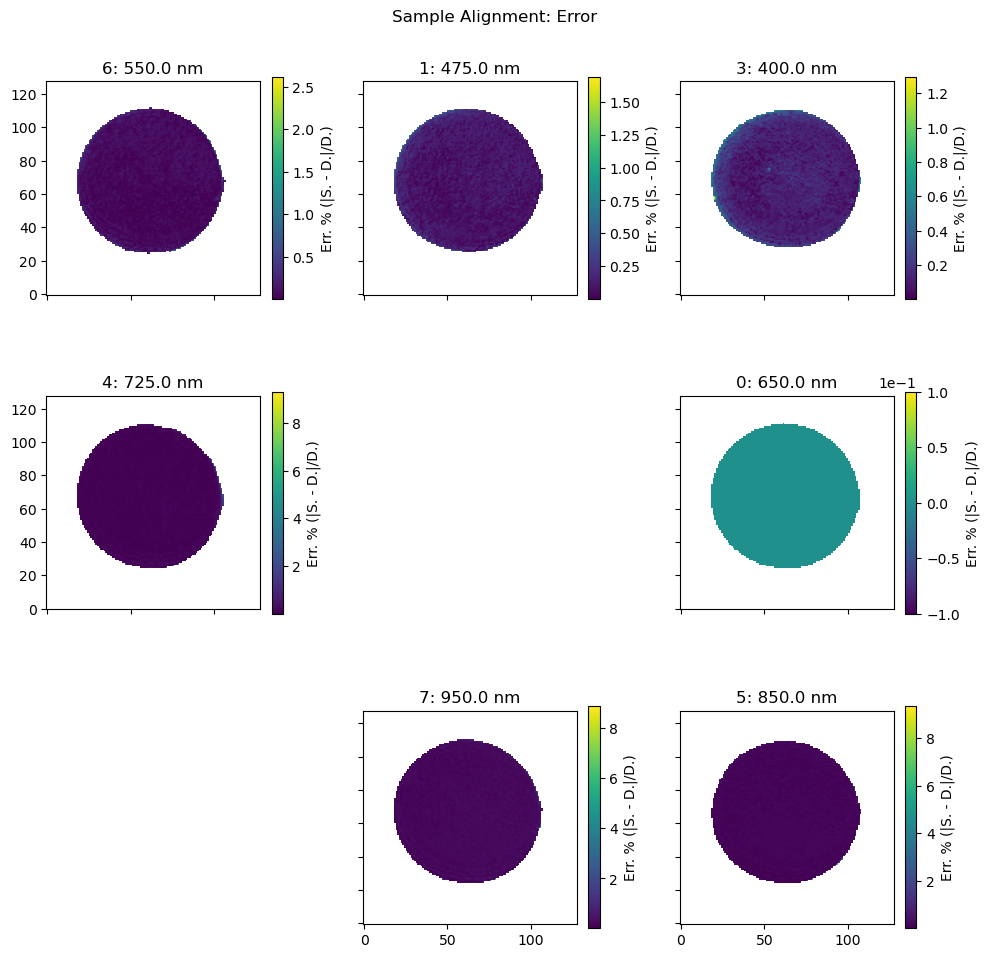

In [7]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

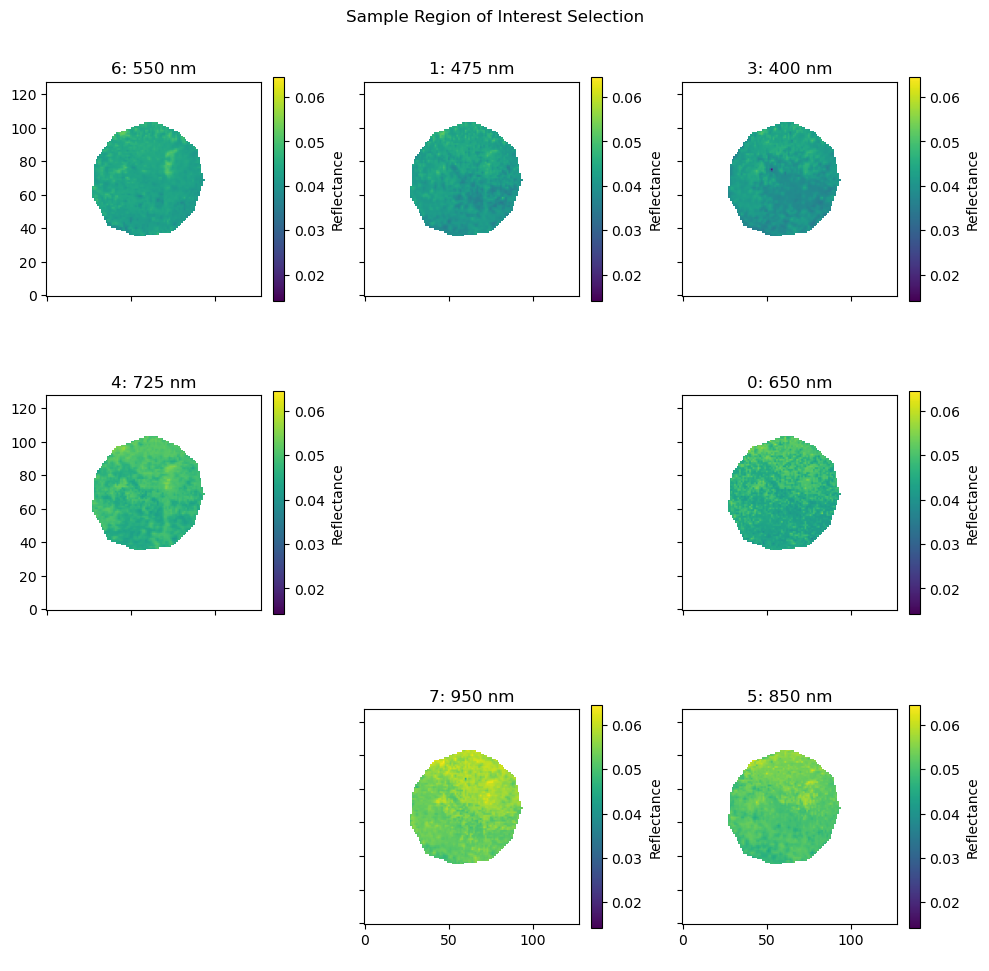

In [8]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

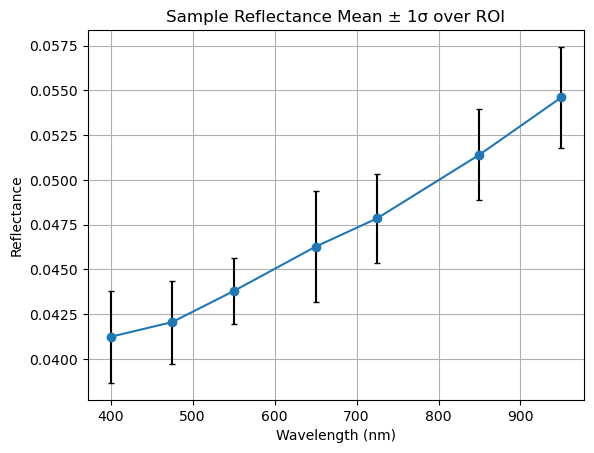

In [9]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


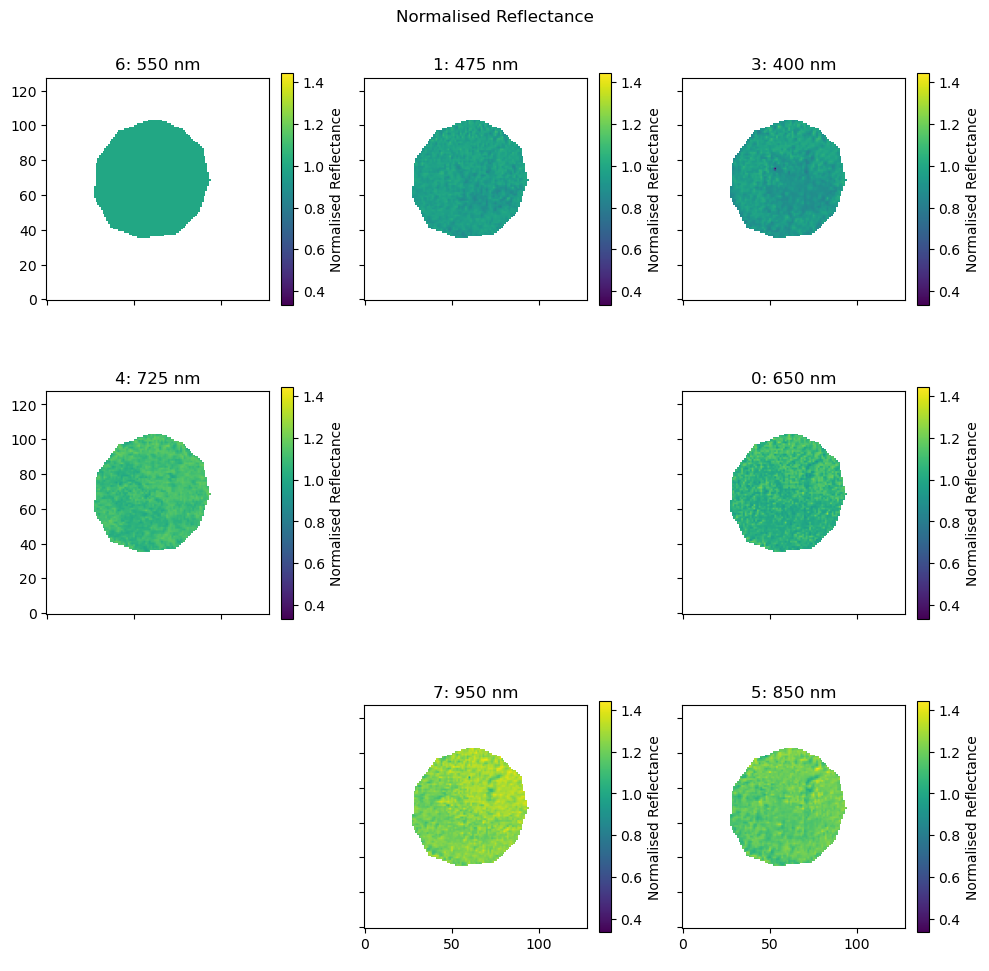

In [10]:
norm_refl = osp.normalise_reflectance(aligned_refl)

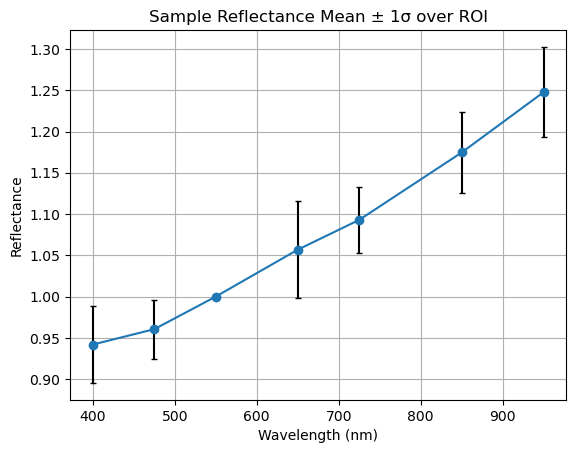

In [11]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

# Right and Left Samples

# Sample 1

## Left

### Reflectance Calibration

Loading sample_1_r: 0 (650 nm)
Loading sample_1_r: 1 (475 nm)
Loading sample_1_r: 3 (400 nm)
Loading sample_1_r: 4 (725 nm)
Loading sample_1_r: 5 (850 nm)
Loading sample_1_r: 6 (550 nm)
Loading sample_1_r: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\sample_1_r\0_650
Mean image written to ..\data\sample_1_r\0_650\650_mean_rfl.tif
Error image written to ..\data\sample_1_r\0_650\650_error_rfl.tif
..\data\sample_1_r\1_475
Mean image written to ..\data\sample_1_r\1_475\475_mean_rfl.tif
Error image written to ..\data\sample_1_r\1_475\475_error_rfl.tif
..\data\sample_1_r\3_400
Mean image written to ..\data\sample_1_r\3_400\400_mean_rfl.tif
Error image written to ..\data\sample_1_r\3_400\400_error_rfl.tif
..\data\sample_1_r\4_725
Mean image written to ..\data\sample_1_r\4_725\725_mean_rfl.tif
Error image written to ..\data\sample_1_r\4_725\725_error_rfl.tif
..\data\sample_1_r\5_850
Mean image written to ..\data\sample_1_r\5_850\850_mean_rfl.tif
Error image written to ..\data\sample_1_r\5_850\850_error_rfl.tif
..\data\sample_1_r\6_550
Mean image written to ..\data\sample_1_r\6_550\550_mean_rfl.tif
Error image written to ..\data\sample_1_r\6_550\550_error_rfl.tif
..\data\sample_1_r\7_950
Mean image written to ..\data\sample_1_r\7_95

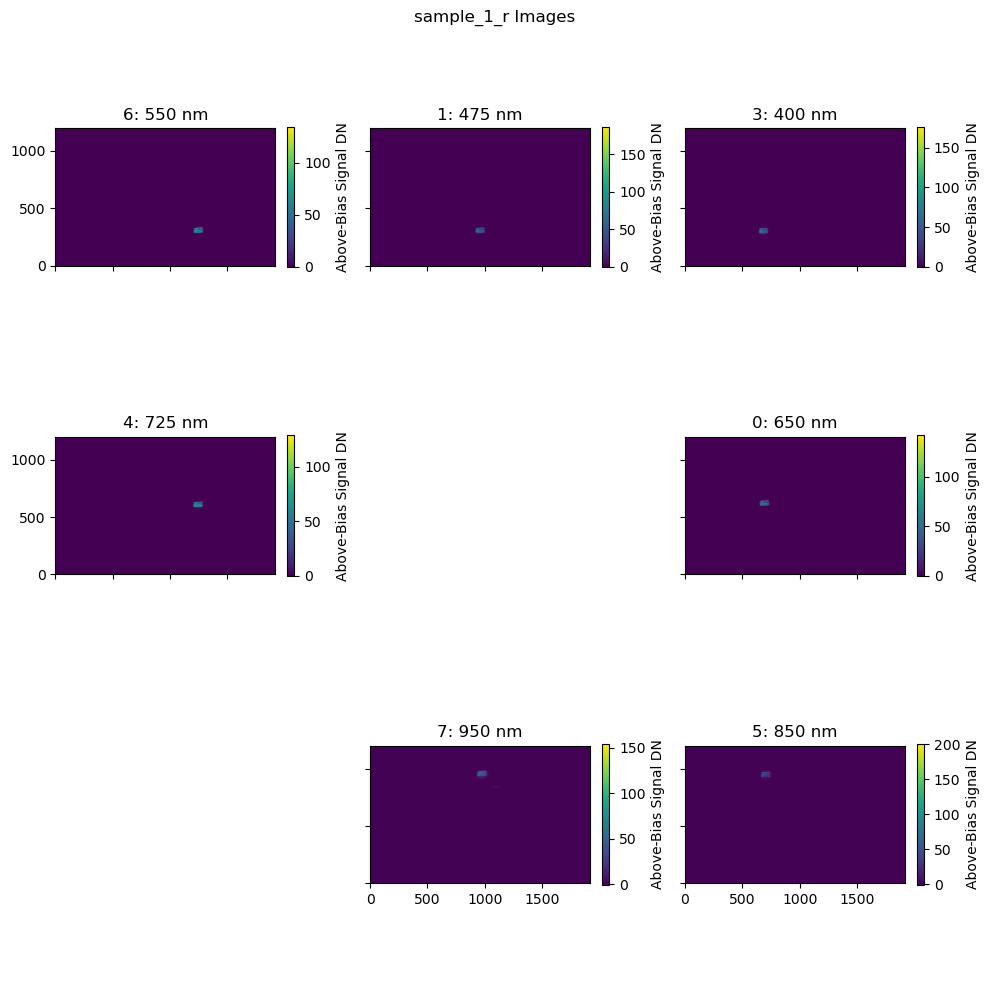

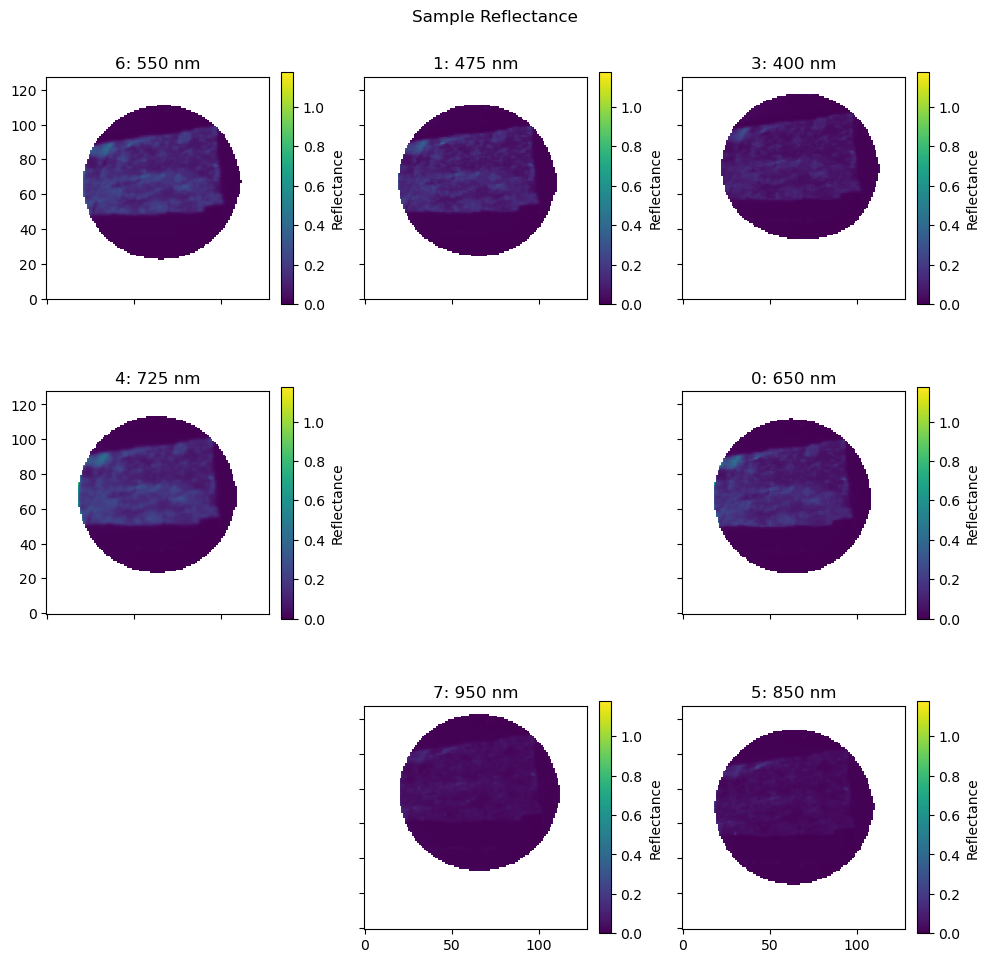

In [12]:
smpl_imgs = osp.load_sample('sample_1_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: divide by zero encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


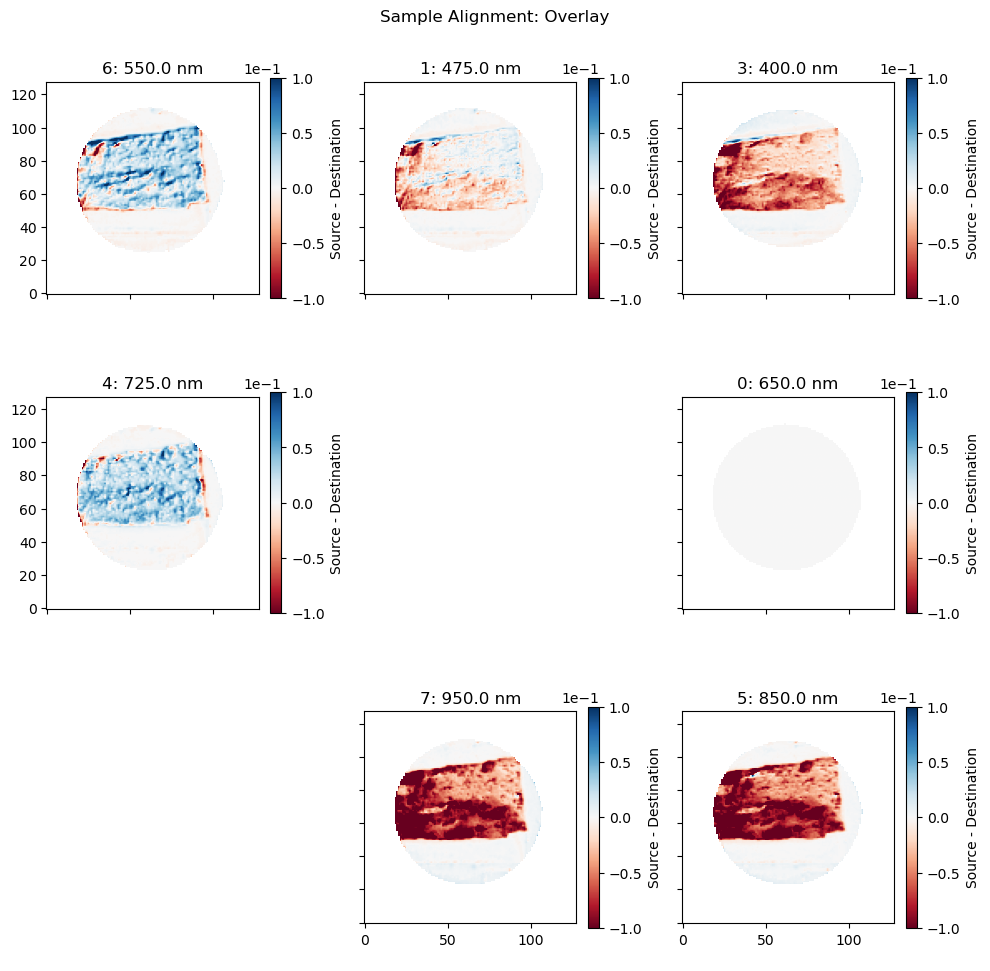

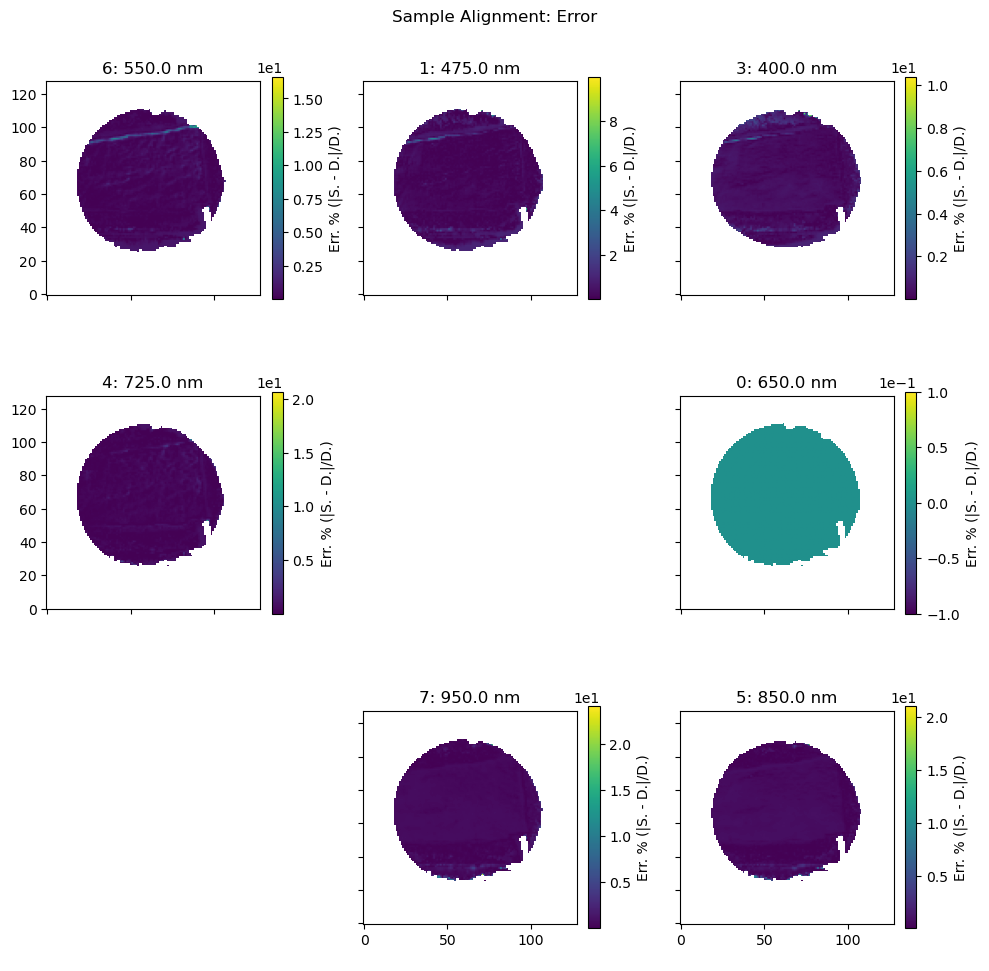

In [13]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

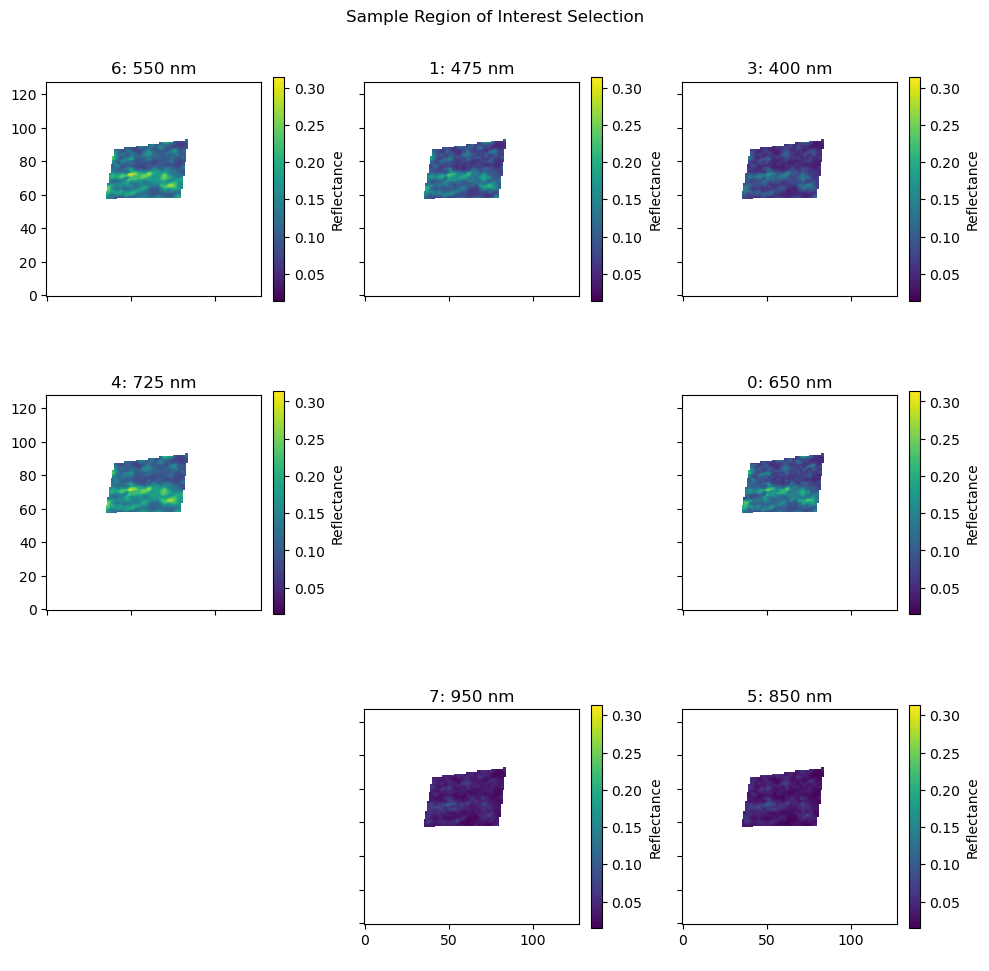

In [14]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

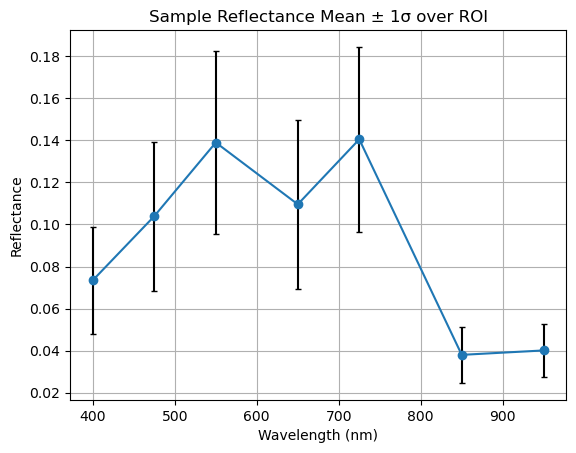

In [15]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


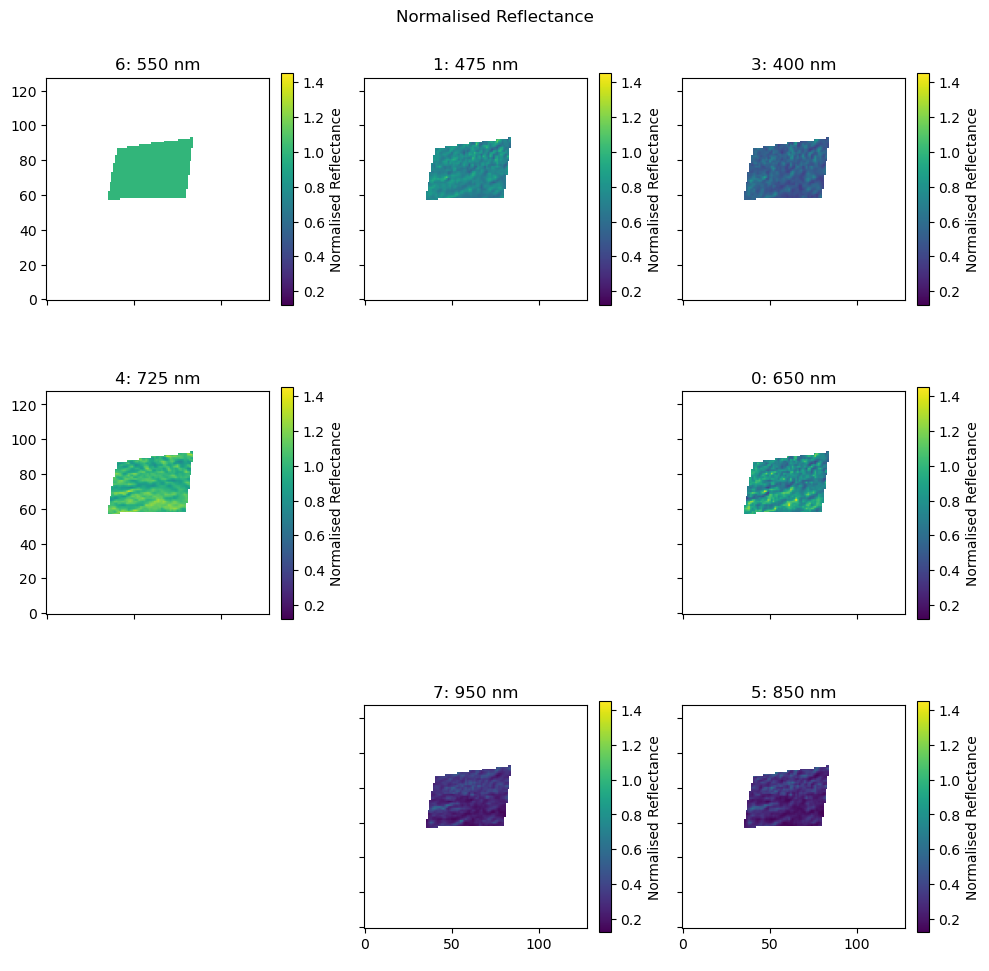

In [16]:
norm_refl = osp.normalise_reflectance(aligned_refl)

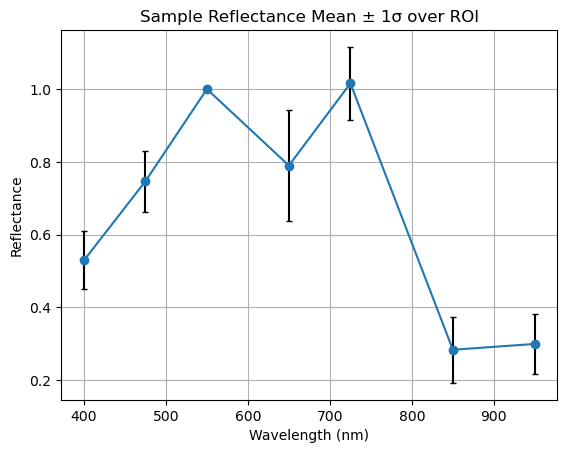

In [17]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

## Right

### Reflectance Calibration

Loading sample_1_r: 0 (650 nm)
Loading sample_1_r: 1 (475 nm)
Loading sample_1_r: 3 (400 nm)
Loading sample_1_r: 4 (725 nm)
Loading sample_1_r: 5 (850 nm)
Loading sample_1_r: 6 (550 nm)
Loading sample_1_r: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\sample_1_r\0_650
Mean image written to ..\data\sample_1_r\0_650\650_mean_rfl.tif
Error image written to ..\data\sample_1_r\0_650\650_error_rfl.tif
..\data\sample_1_r\1_475
Mean image written to ..\data\sample_1_r\1_475\475_mean_rfl.tif
Error image written to ..\data\sample_1_r\1_475\475_error_rfl.tif
..\data\sample_1_r\3_400
Mean image written to ..\data\sample_1_r\3_400\400_mean_rfl.tif
Error image written to ..\data\sample_1_r\3_400\400_error_rfl.tif
..\data\sample_1_r\4_725
Mean image written to ..\data\sample_1_r\4_725\725_mean_rfl.tif
Error image written to ..\data\sample_1_r\4_725\725_error_rfl.tif
..\data\sample_1_r\5_850
Mean image written to ..\data\sample_1_r\5_850\850_mean_rfl.tif
Error image written to ..\data\sample_1_r\5_850\850_error_rfl.tif
..\data\sample_1_r\6_550
Mean image written to ..\data\sample_1_r\6_550\550_mean_rfl.tif
Error image written to ..\data\sample_1_r\6_550\550_error_rfl.tif
..\data\sample_1_r\7_950
Mean image written to ..\data\sample_1_r\7_95

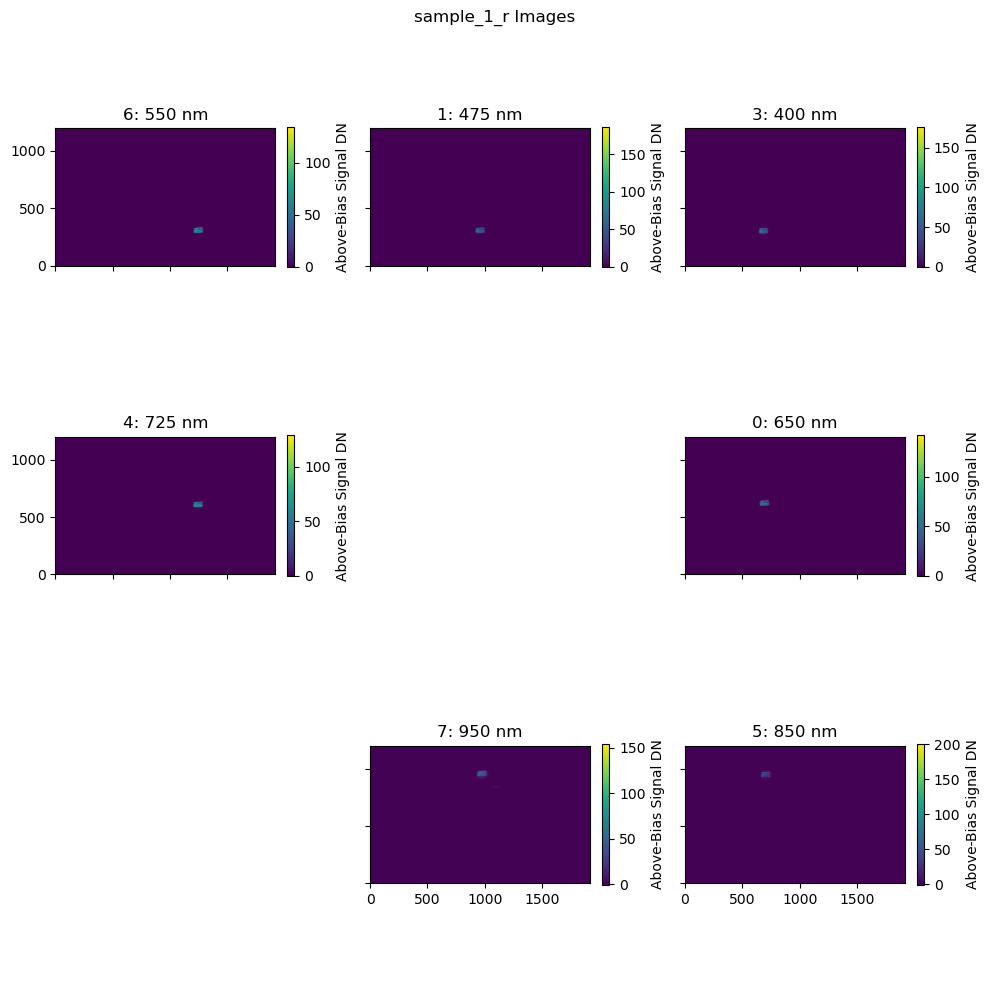

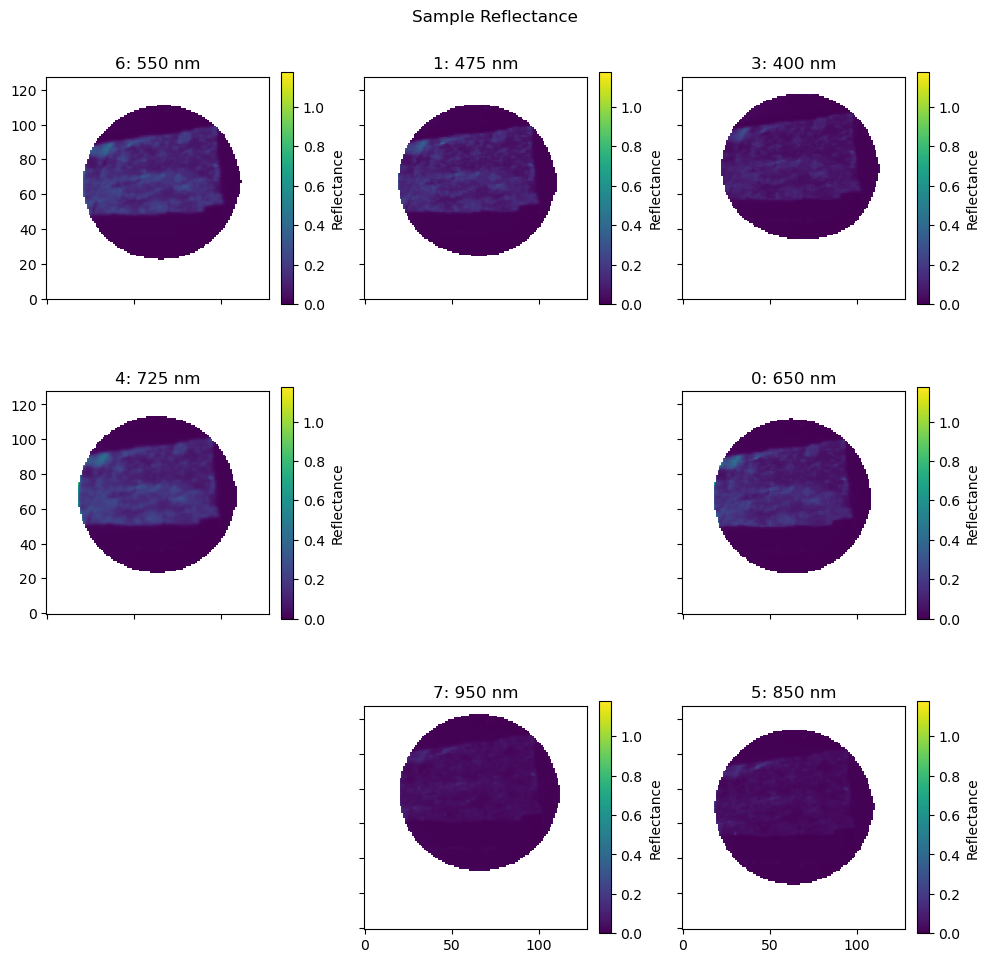

In [18]:
smpl_imgs = osp.load_sample('sample_1_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: divide by zero encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


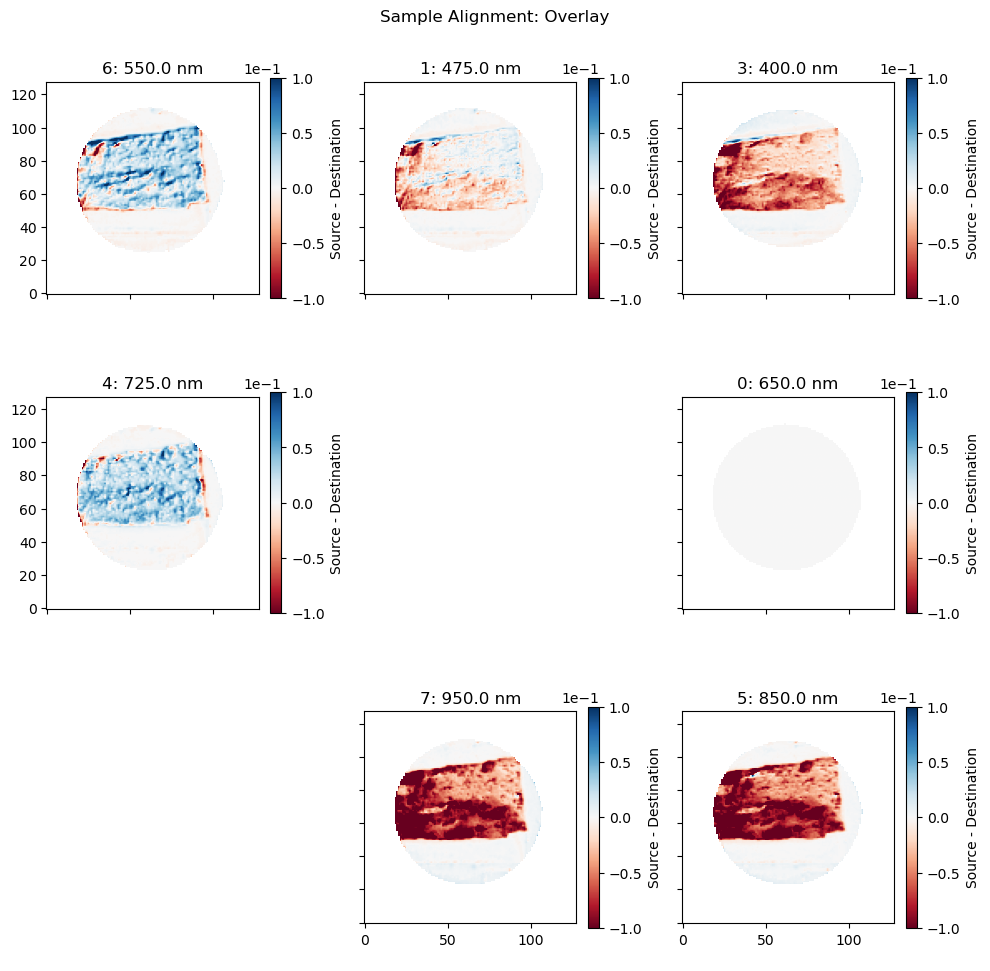

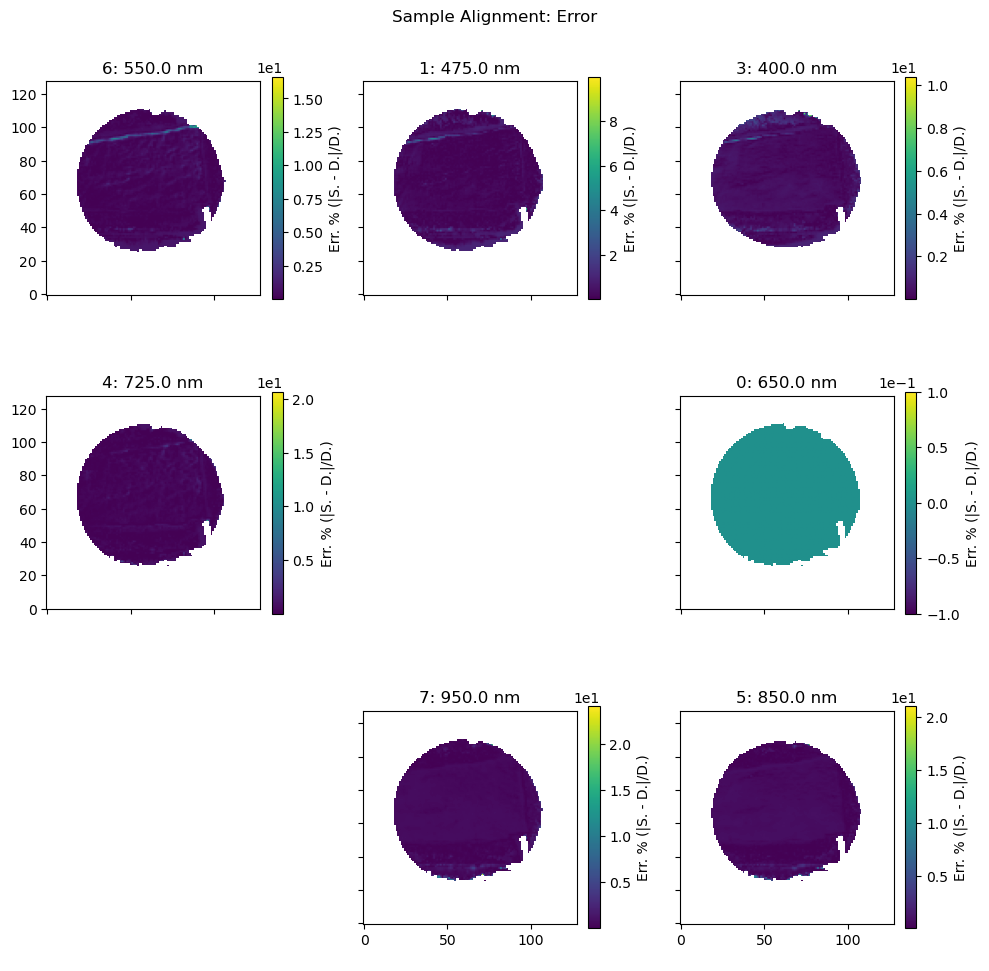

In [19]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

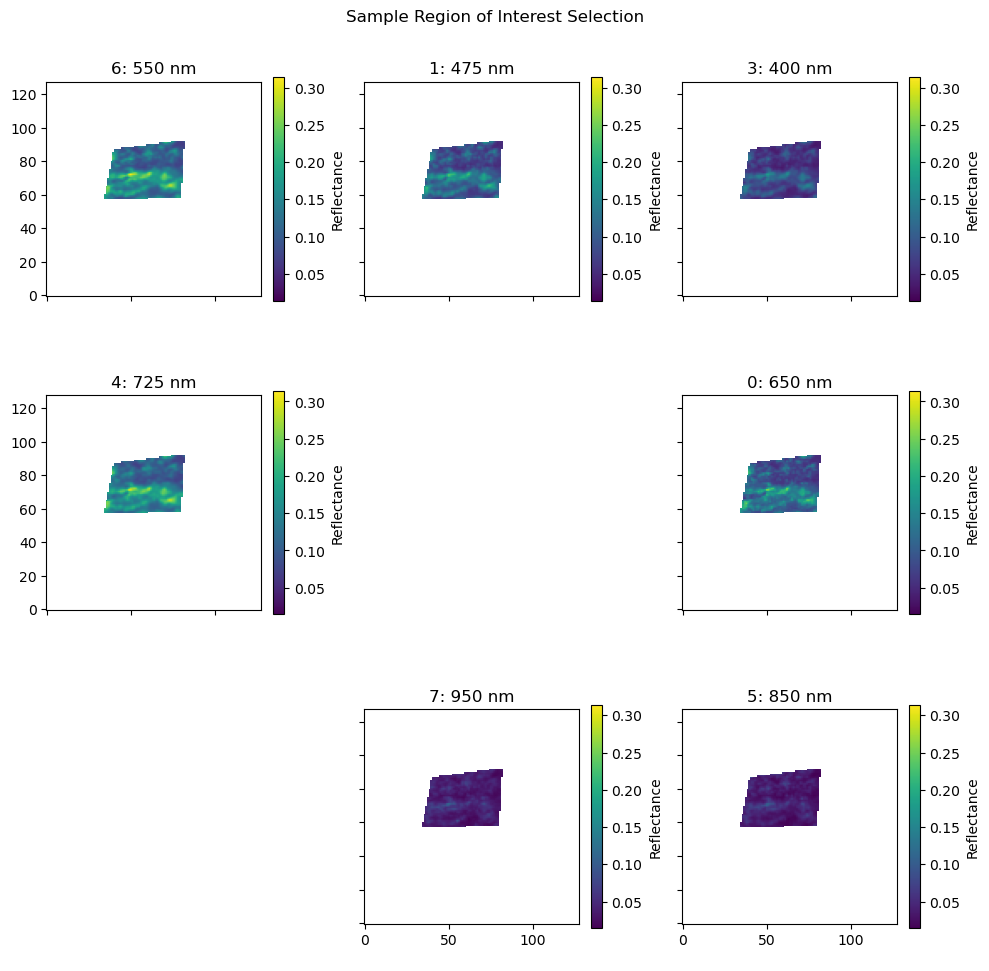

In [20]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

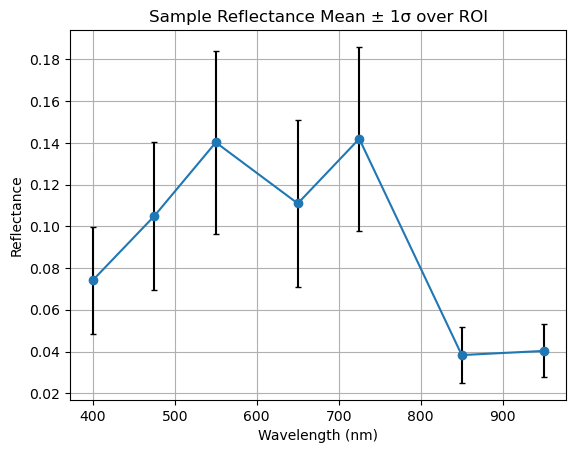

In [21]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


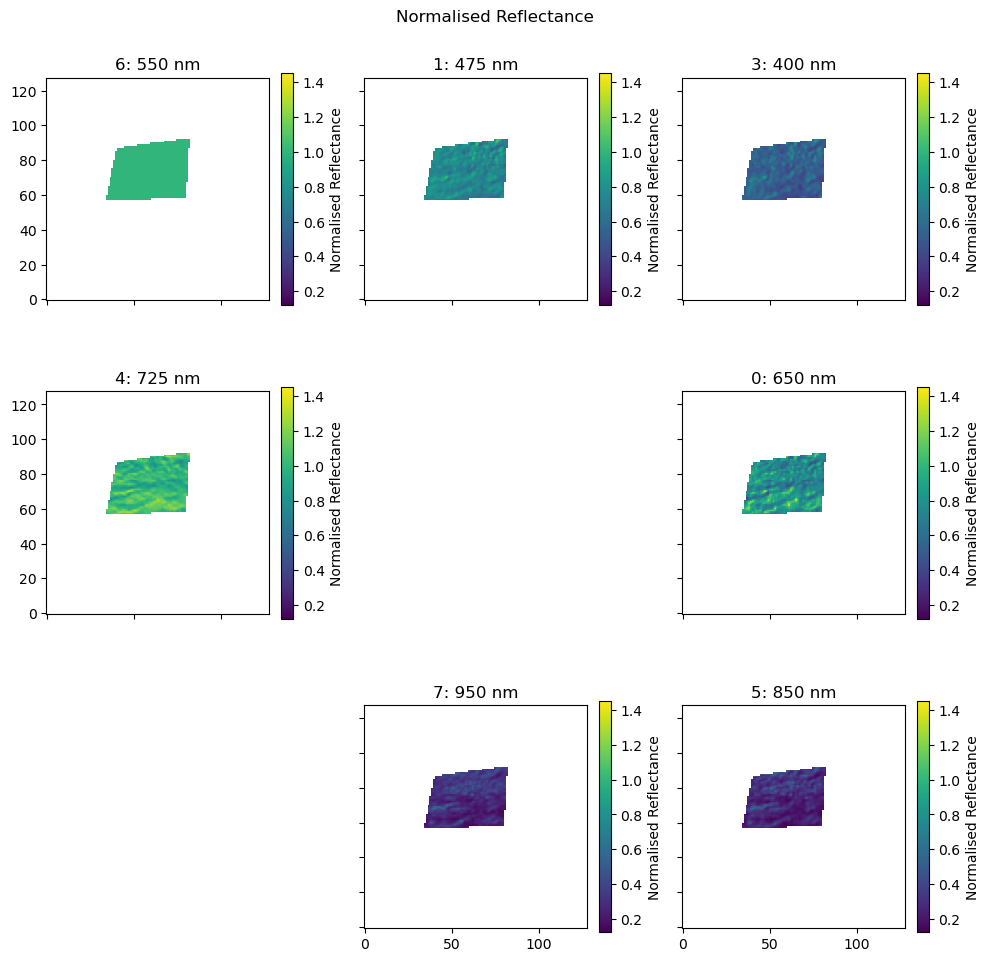

In [22]:
norm_refl = osp.normalise_reflectance(aligned_refl)

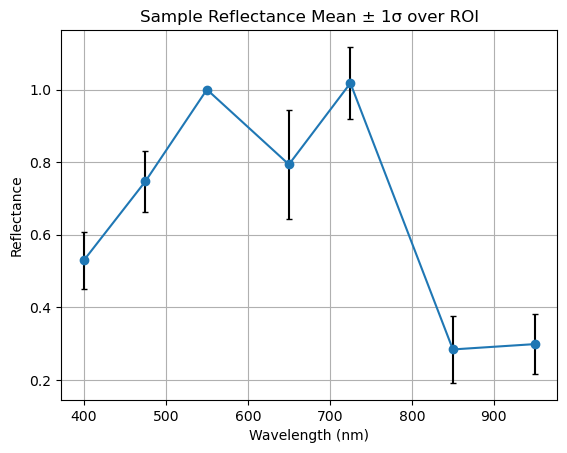

In [23]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

# Sample 2

## Left

### Reflectance Calibration

Loading sample_2_r: 0 (650 nm)
Loading sample_2_r: 1 (475 nm)
Loading sample_2_r: 3 (400 nm)
Loading sample_2_r: 4 (725 nm)
Loading sample_2_r: 5 (850 nm)
Loading sample_2_r: 6 (550 nm)
Loading sample_2_r: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\sample_2_r\0_650
Mean image written to ..\data\sample_2_r\0_650\650_mean_rfl.tif
Error image written to ..\data\sample_2_r\0_650\650_error_rfl.tif
..\data\sample_2_r\1_475
Mean image written to ..\data\sample_2_r\1_475\475_mean_rfl.tif
Error image written to ..\data\sample_2_r\1_475\475_error_rfl.tif
..\data\sample_2_r\3_400
Mean image written to ..\data\sample_2_r\3_400\400_mean_rfl.tif
Error image written to ..\data\sample_2_r\3_400\400_error_rfl.tif
..\data\sample_2_r\4_725
Mean image written to ..\data\sample_2_r\4_725\725_mean_rfl.tif
Error image written to ..\data\sample_2_r\4_725\725_error_rfl.tif
..\data\sample_2_r\5_850
Mean image written to ..\data\sample_2_r\5_850\850_mean_rfl.tif
Error image written to ..\data\sample_2_r\5_850\850_error_rfl.tif
..\data\sample_2_r\6_550
Mean image written to ..\data\sample_2_r\6_550\550_mean_rfl.tif
Error image written to ..\data\sample_2_r\6_550\550_error_rfl.tif
..\data\sample_2_r\7_950
Mean image written to ..\data\sample_2_r\7_95

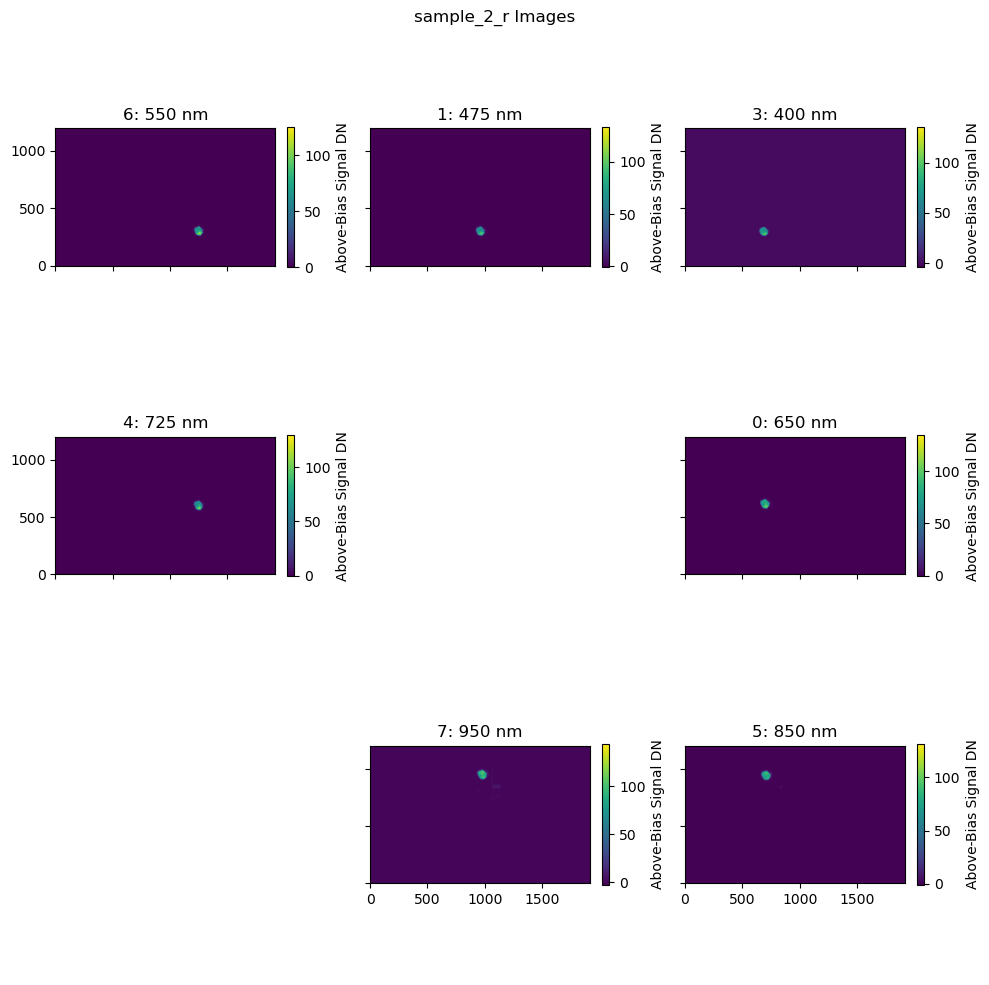

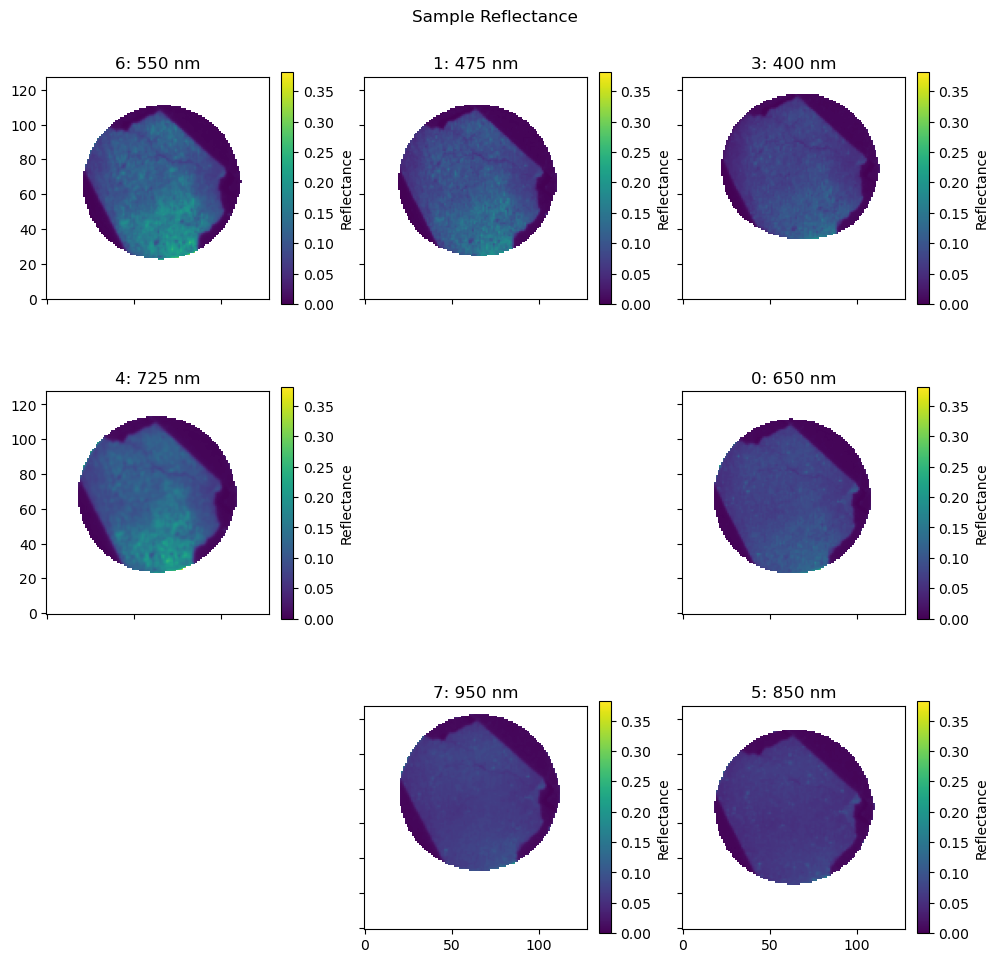

In [24]:
smpl_imgs = osp.load_sample('sample_2_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


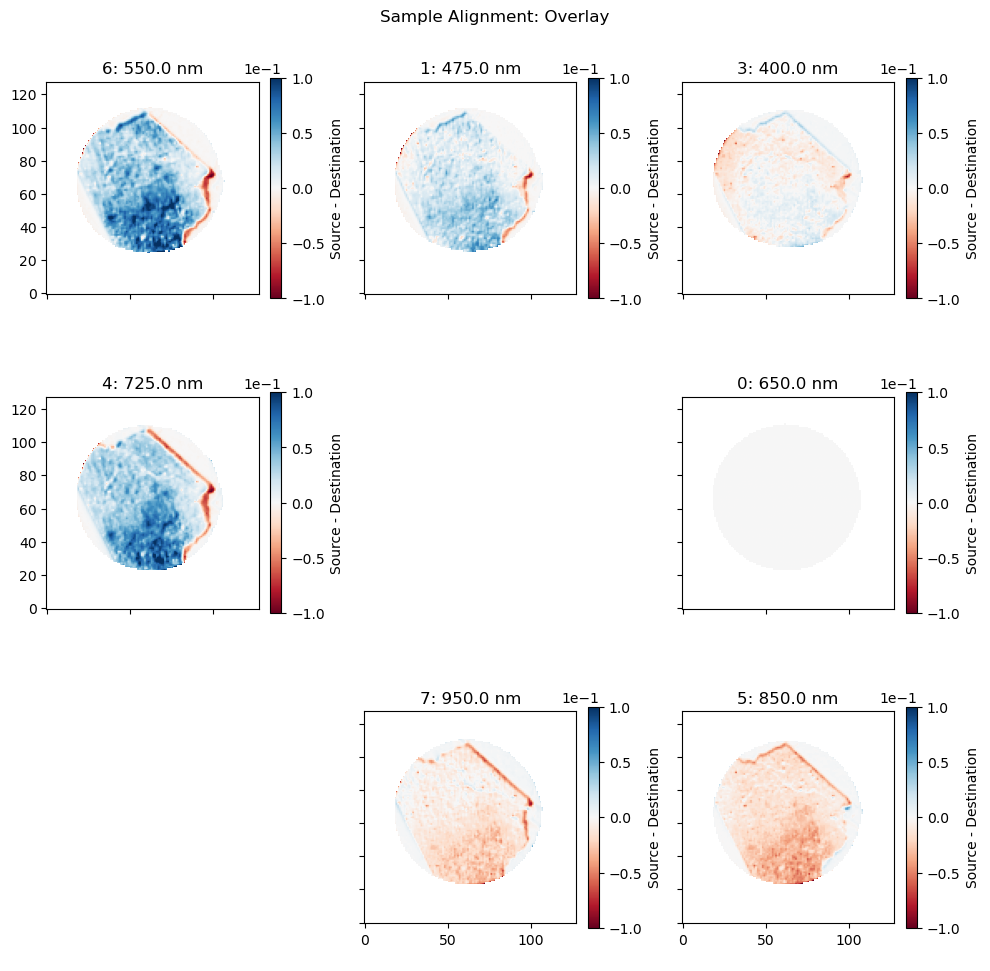

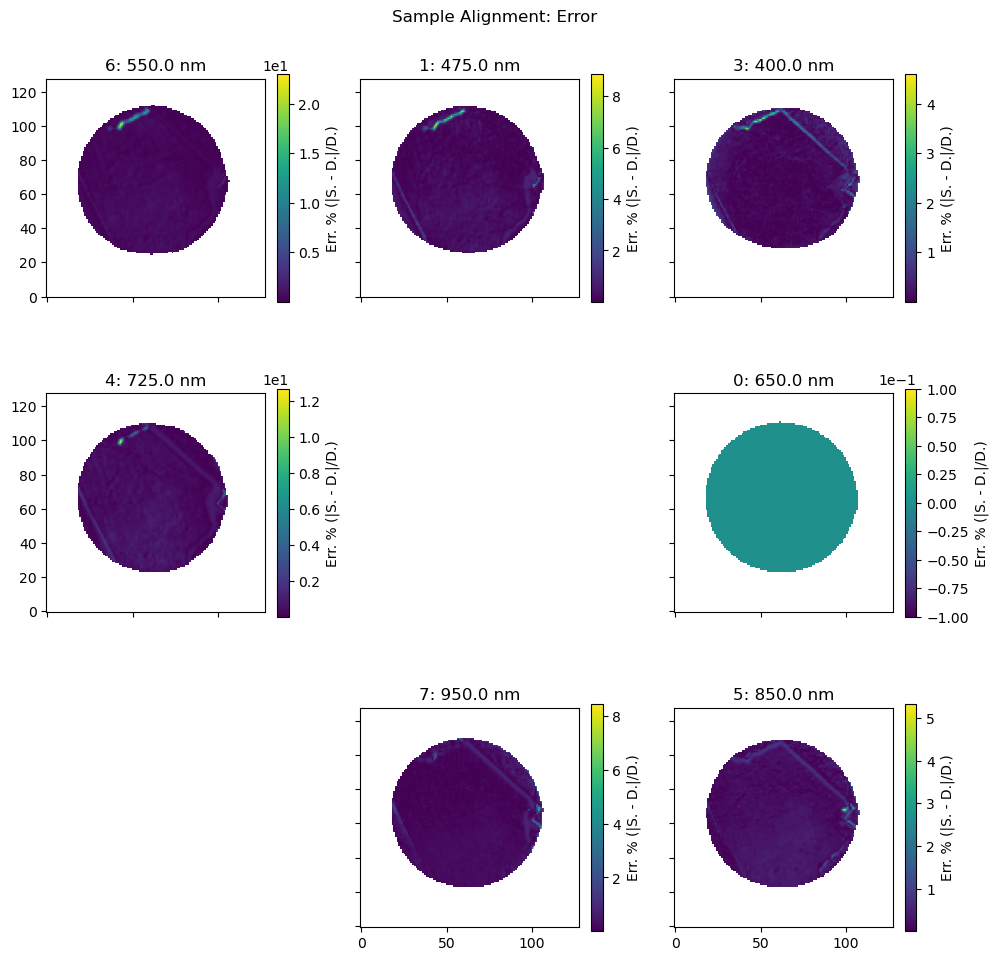

In [25]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

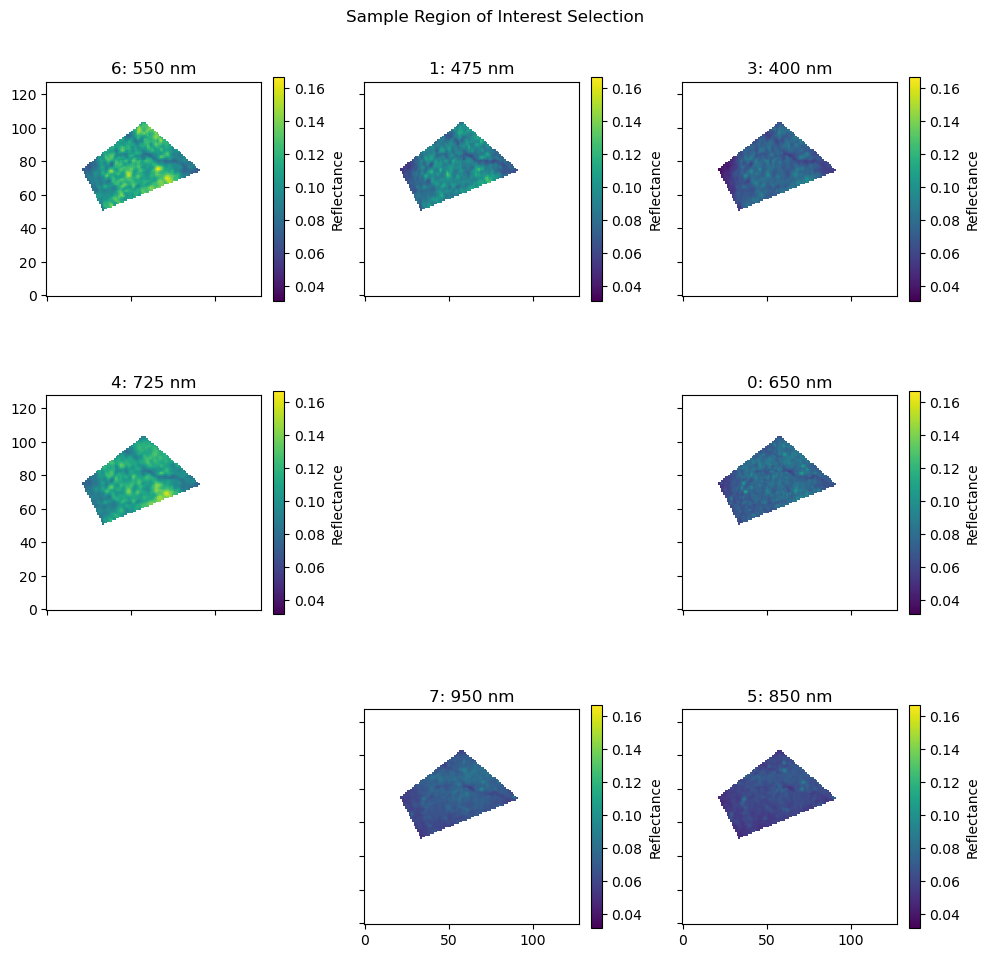

In [26]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

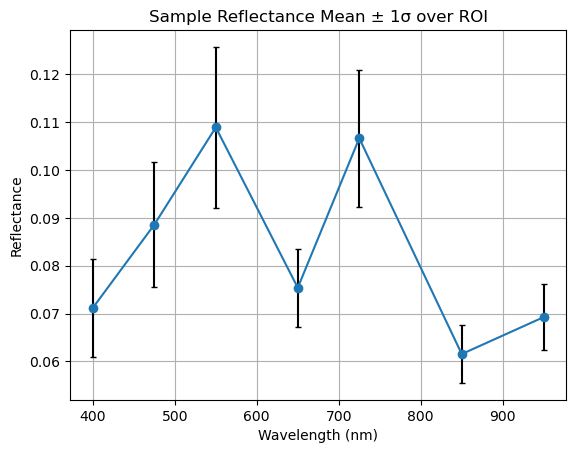

In [27]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


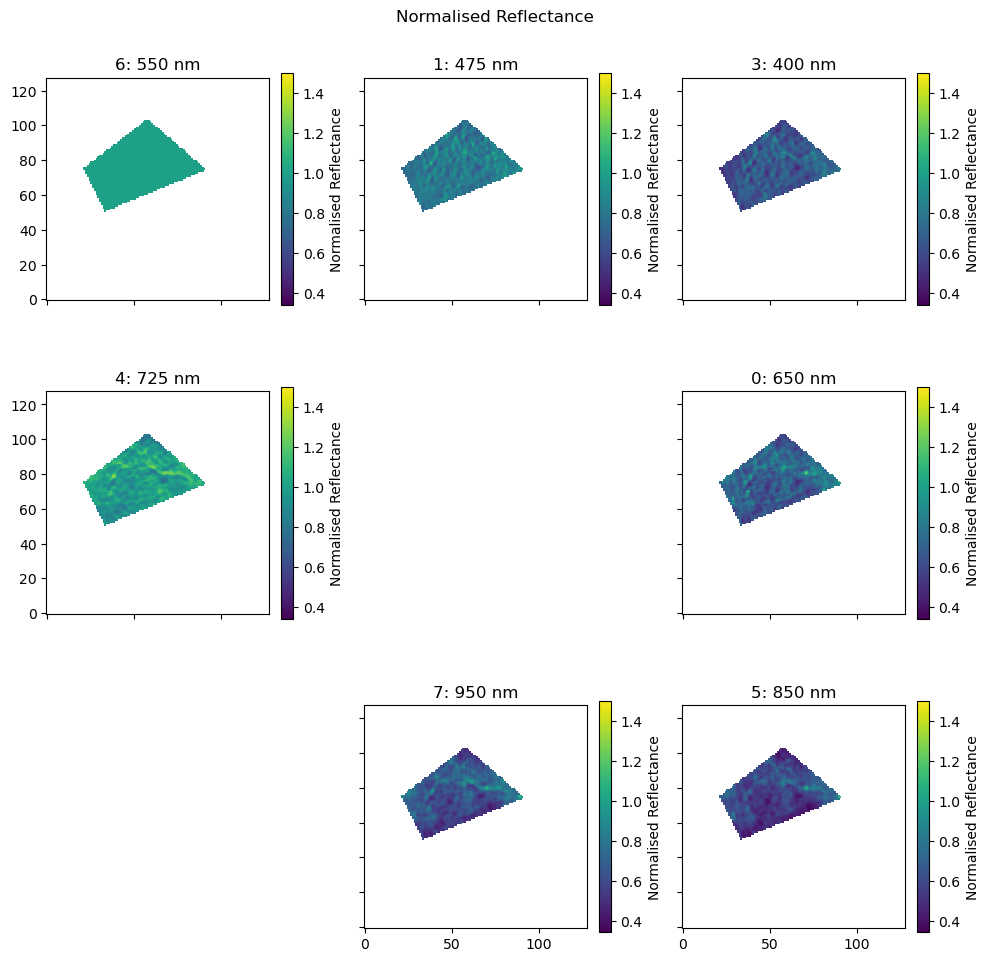

In [28]:
norm_refl = osp.normalise_reflectance(aligned_refl)

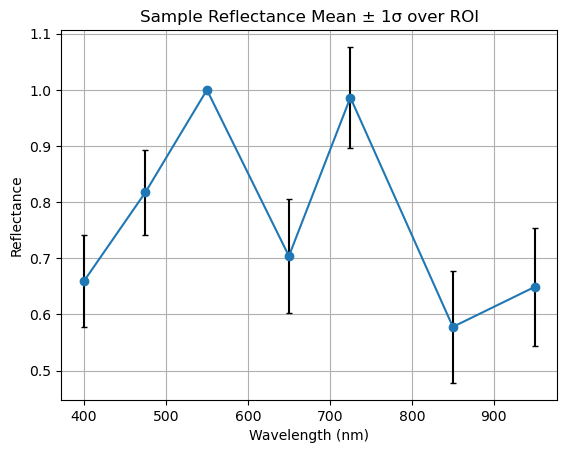

In [29]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

## Right

### Reflectance Calibration

Loading sample_2_r: 0 (650 nm)
Loading sample_2_r: 1 (475 nm)
Loading sample_2_r: 3 (400 nm)
Loading sample_2_r: 4 (725 nm)
Loading sample_2_r: 5 (850 nm)
Loading sample_2_r: 6 (550 nm)
Loading sample_2_r: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\sample_2_r\0_650
Mean image written to ..\data\sample_2_r\0_650\650_mean_rfl.tif
Error image written to ..\data\sample_2_r\0_650\650_error_rfl.tif
..\data\sample_2_r\1_475
Mean image written to ..\data\sample_2_r\1_475\475_mean_rfl.tif
Error image written to ..\data\sample_2_r\1_475\475_error_rfl.tif
..\data\sample_2_r\3_400
Mean image written to ..\data\sample_2_r\3_400\400_mean_rfl.tif
Error image written to ..\data\sample_2_r\3_400\400_error_rfl.tif
..\data\sample_2_r\4_725
Mean image written to ..\data\sample_2_r\4_725\725_mean_rfl.tif
Error image written to ..\data\sample_2_r\4_725\725_error_rfl.tif
..\data\sample_2_r\5_850
Mean image written to ..\data\sample_2_r\5_850\850_mean_rfl.tif
Error image written to ..\data\sample_2_r\5_850\850_error_rfl.tif
..\data\sample_2_r\6_550
Mean image written to ..\data\sample_2_r\6_550\550_mean_rfl.tif
Error image written to ..\data\sample_2_r\6_550\550_error_rfl.tif
..\data\sample_2_r\7_950
Mean image written to ..\data\sample_2_r\7_95

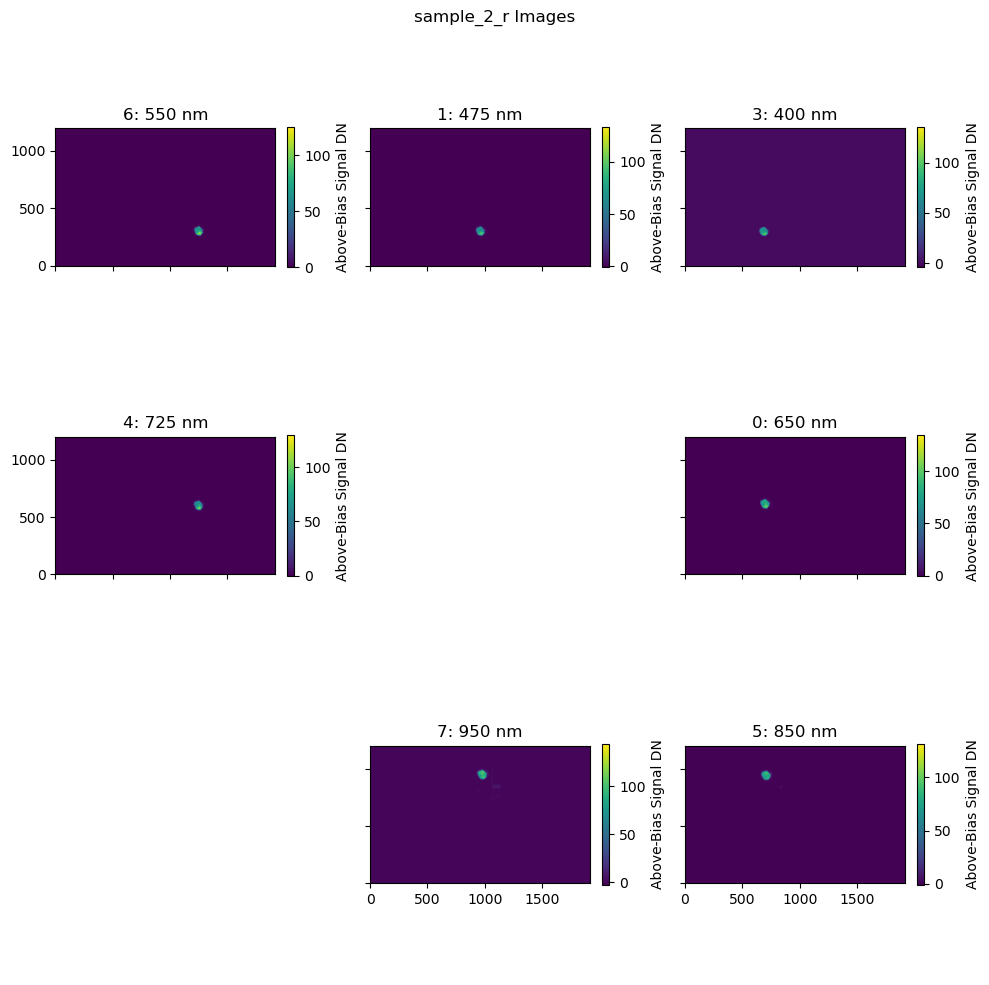

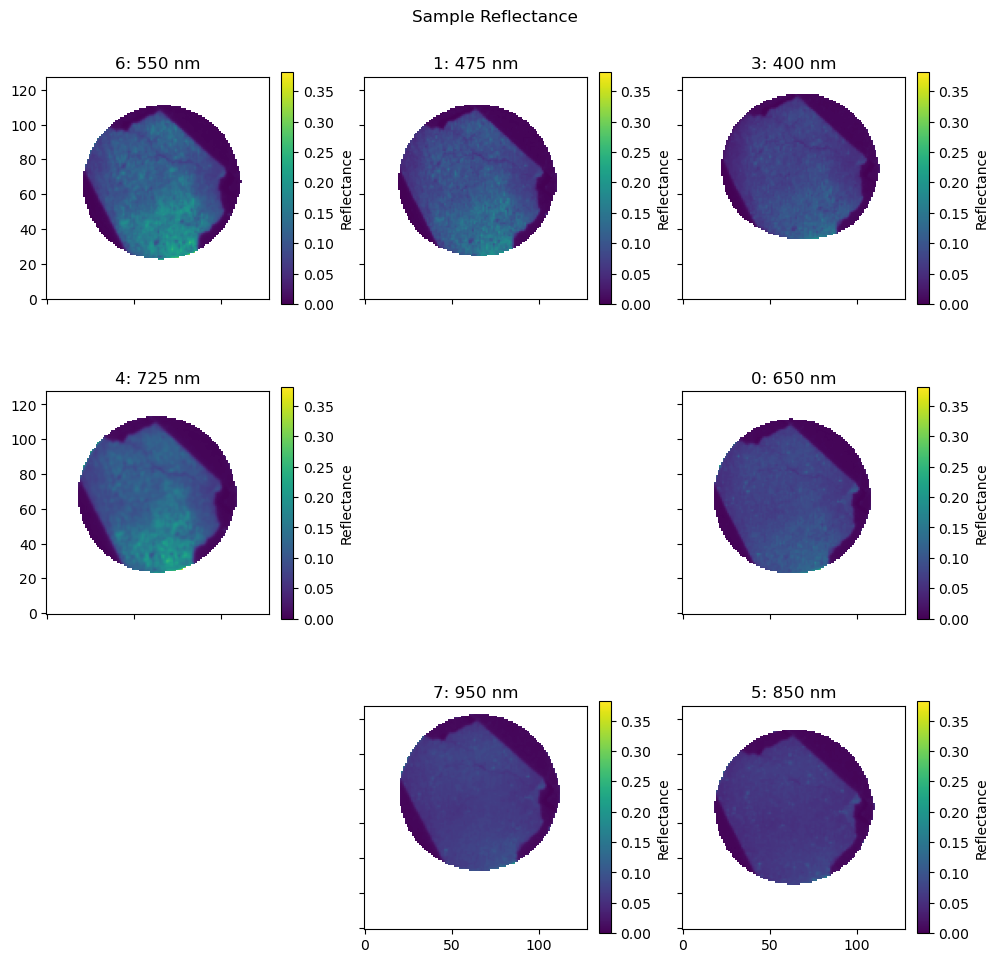

In [30]:
smpl_imgs = osp.load_sample('sample_2_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


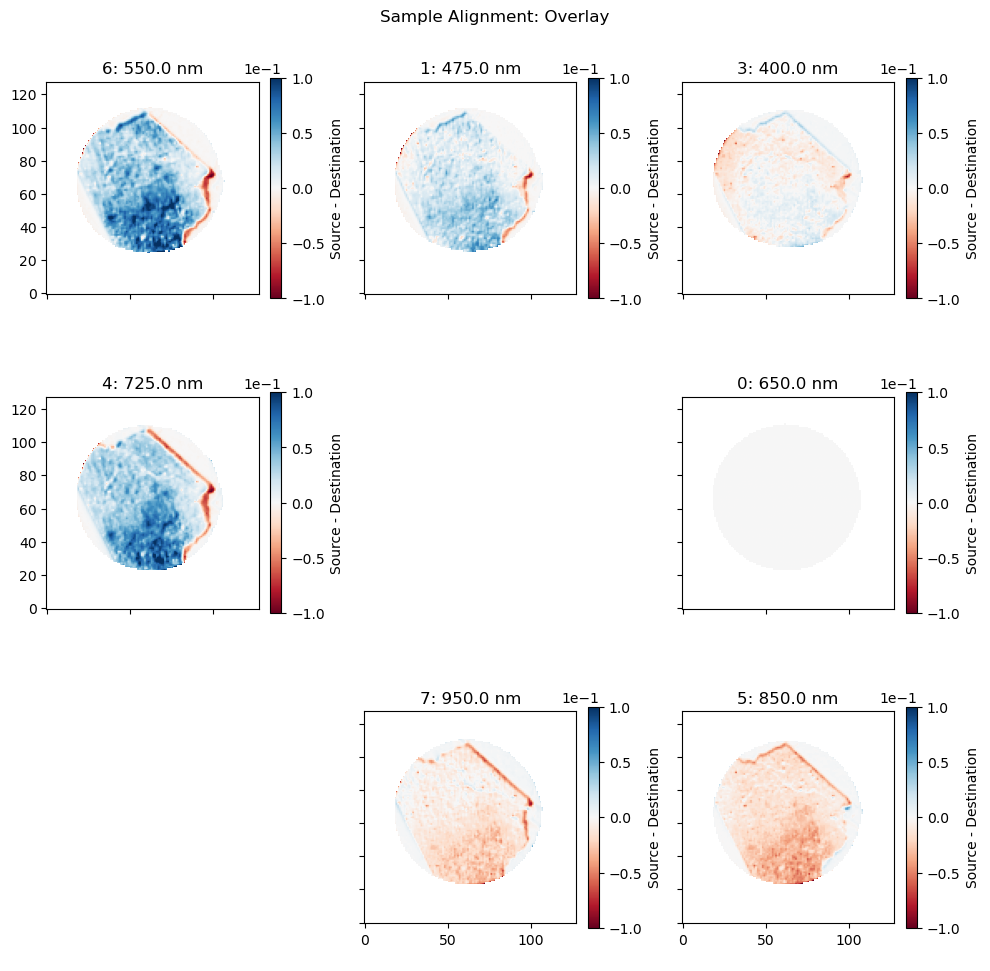

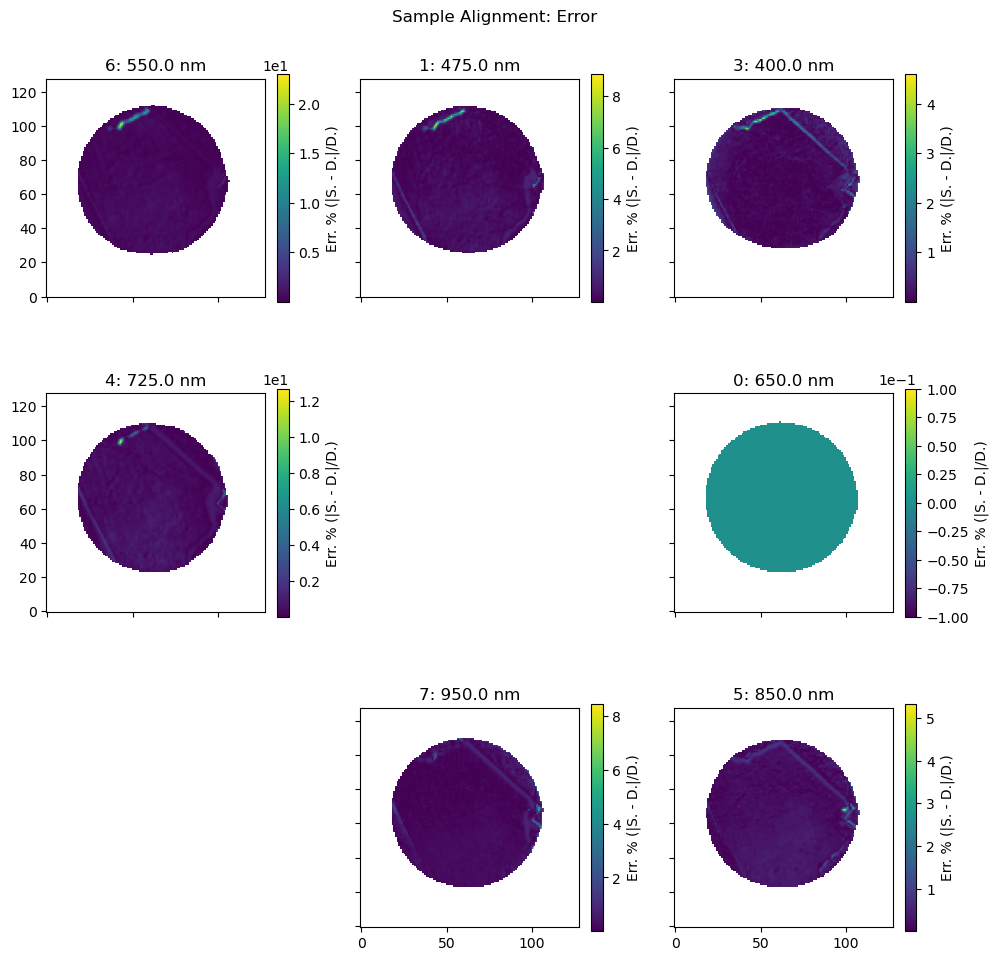

In [31]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

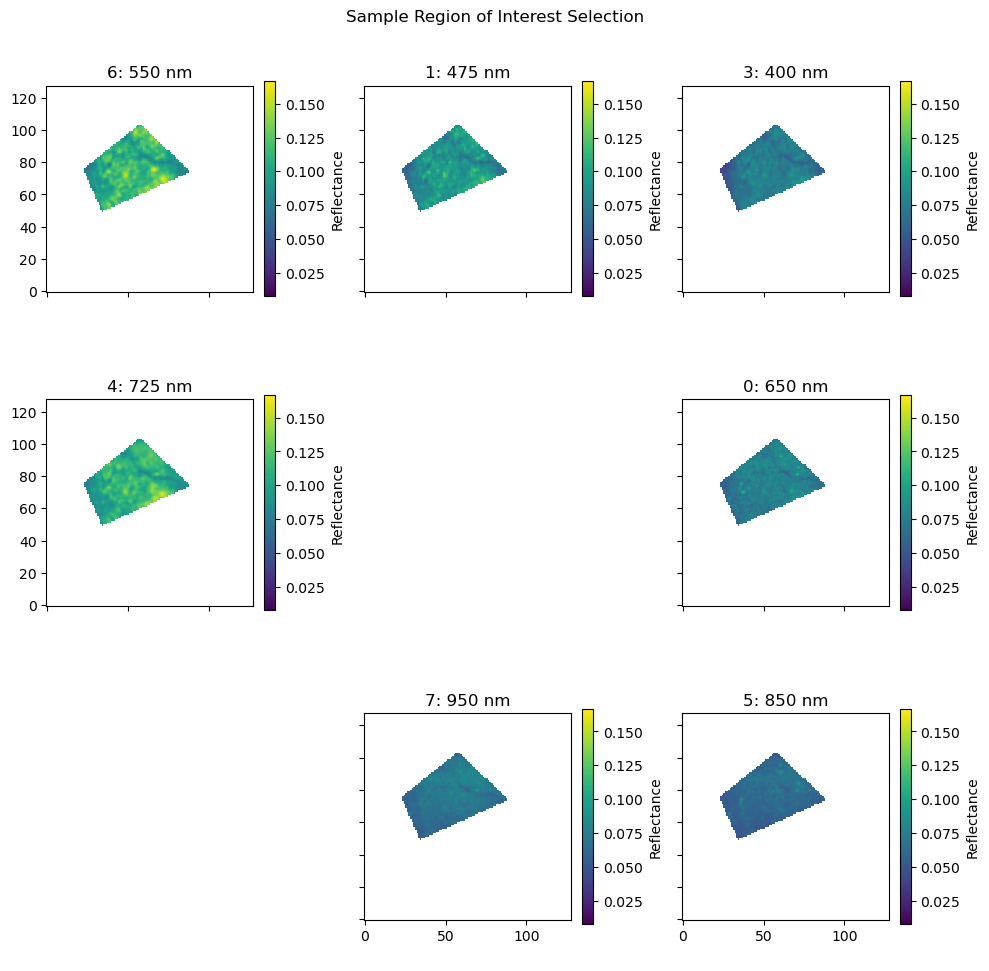

In [32]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

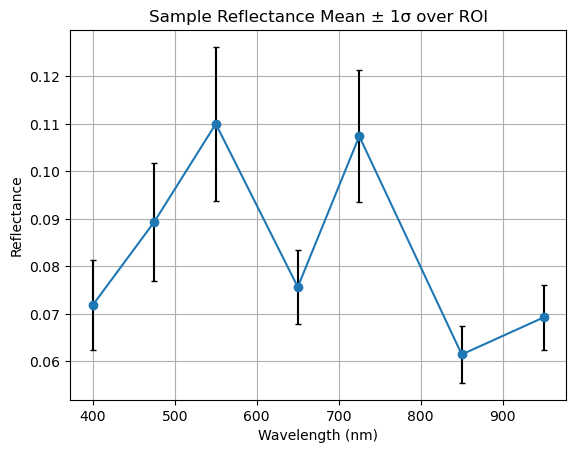

In [33]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


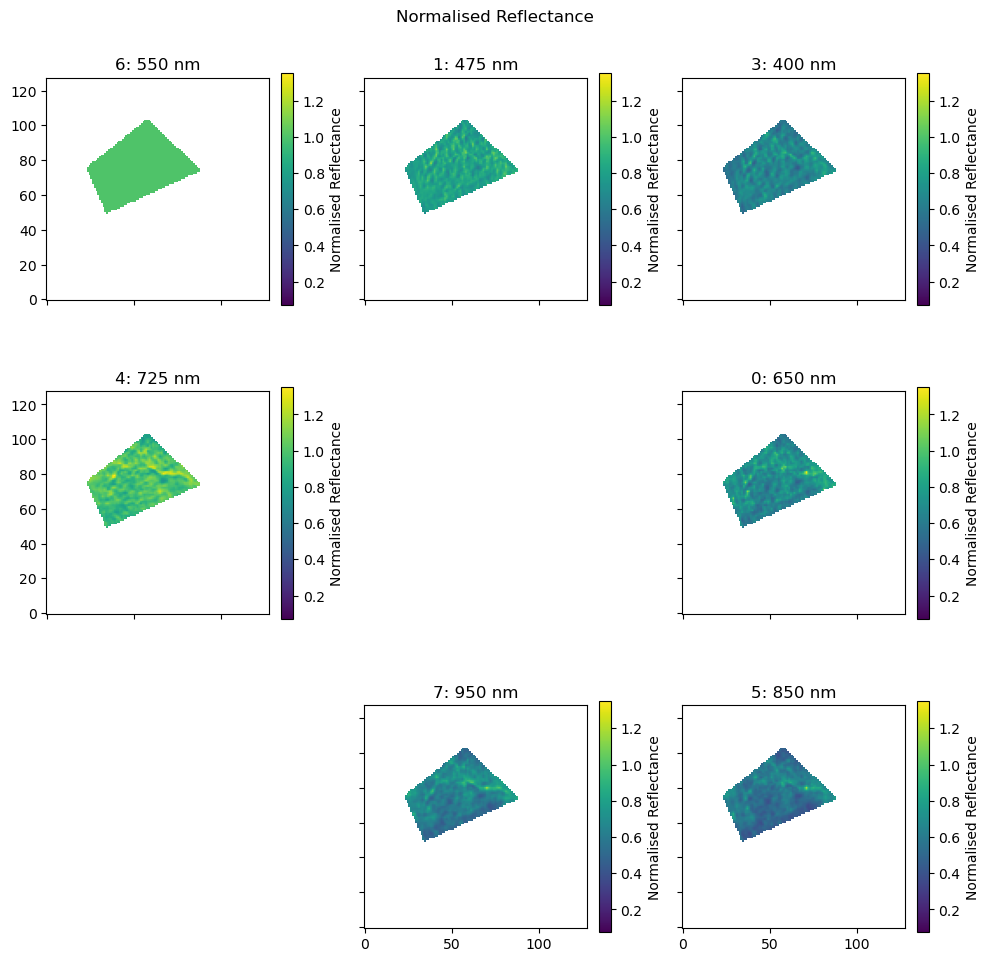

In [34]:
norm_refl = osp.normalise_reflectance(aligned_refl)

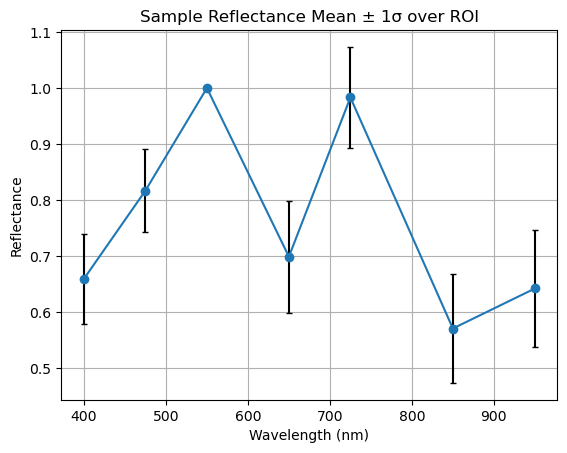

In [35]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

# Sample 3

## Left

### Reflectance Calibration

Loading sample_3_r: 0 (650 nm)
Loading sample_3_r: 1 (475 nm)
Loading sample_3_r: 3 (400 nm)
Loading sample_3_r: 4 (725 nm)
Loading sample_3_r: 5 (850 nm)
Loading sample_3_r: 6 (550 nm)
Loading sample_3_r: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\sample_3_r\0_650
Mean image written to ..\data\sample_3_r\0_650\650_mean_rfl.tif
Error image written to ..\data\sample_3_r\0_650\650_error_rfl.tif
..\data\sample_3_r\1_475
Mean image written to ..\data\sample_3_r\1_475\475_mean_rfl.tif
Error image written to ..\data\sample_3_r\1_475\475_error_rfl.tif
..\data\sample_3_r\3_400
Mean image written to ..\data\sample_3_r\3_400\400_mean_rfl.tif
Error image written to ..\data\sample_3_r\3_400\400_error_rfl.tif
..\data\sample_3_r\4_725
Mean image written to ..\data\sample_3_r\4_725\725_mean_rfl.tif
Error image written to ..\data\sample_3_r\4_725\725_error_rfl.tif
..\data\sample_3_r\5_850
Mean image written to ..\data\sample_3_r\5_850\850_mean_rfl.tif
Error image written to ..\data\sample_3_r\5_850\850_error_rfl.tif
..\data\sample_3_r\6_550
Mean image written to ..\data\sample_3_r\6_550\550_mean_rfl.tif
Error image written to ..\data\sample_3_r\6_550\550_error_rfl.tif
..\data\sample_3_r\7_950
Mean image written to ..\data\sample_3_r\7_95

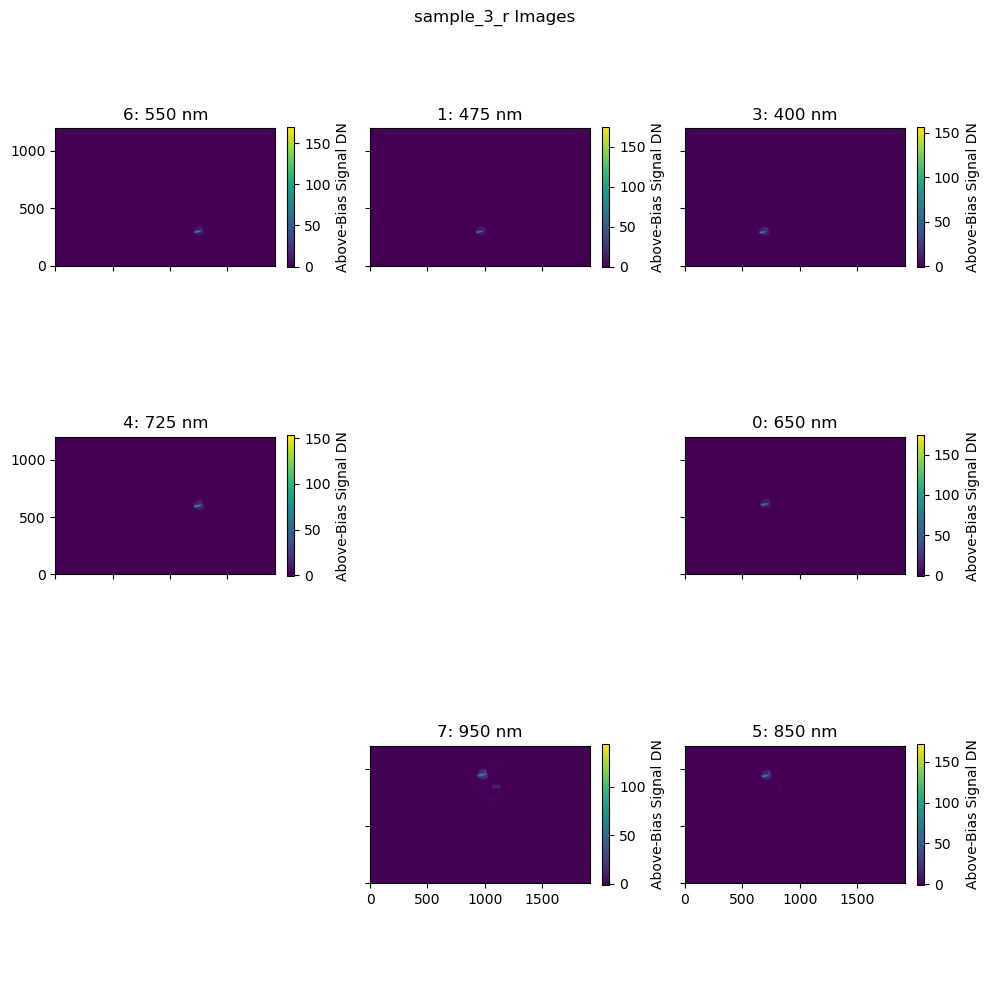

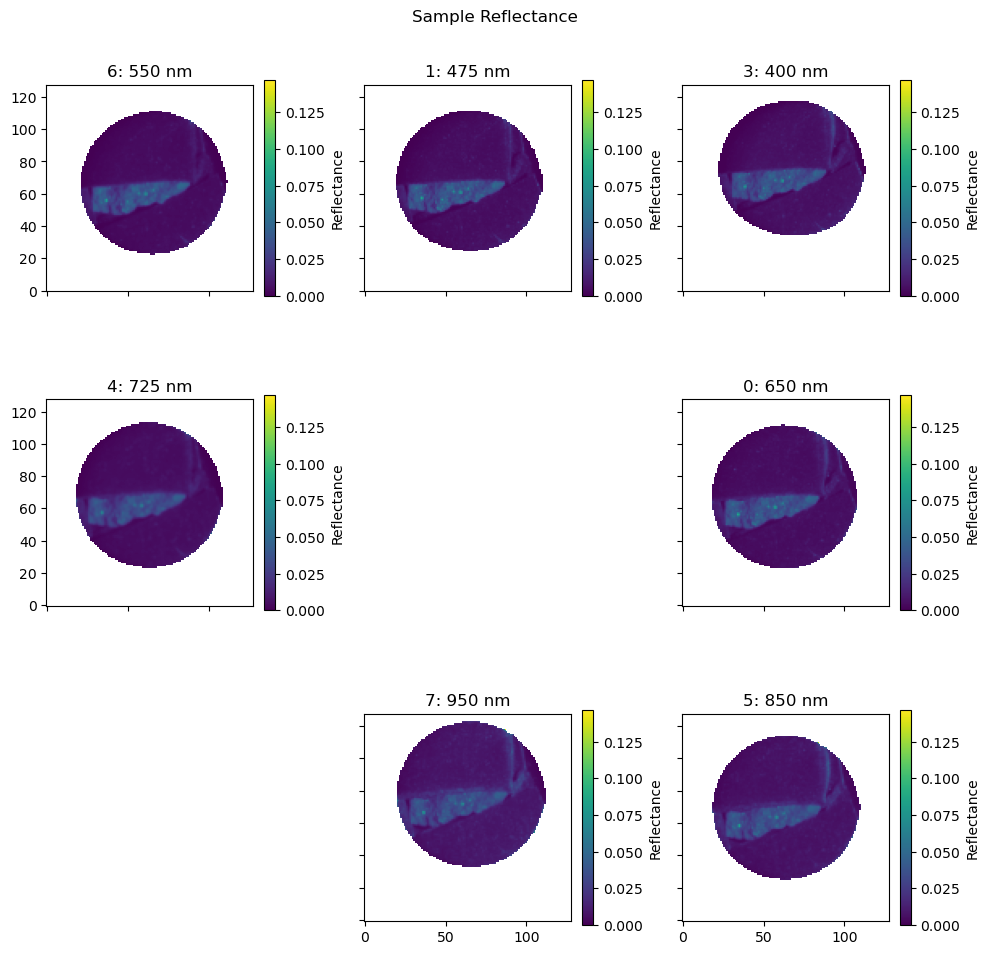

In [36]:
smpl_imgs = osp.load_sample('sample_3_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: divide by zero encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


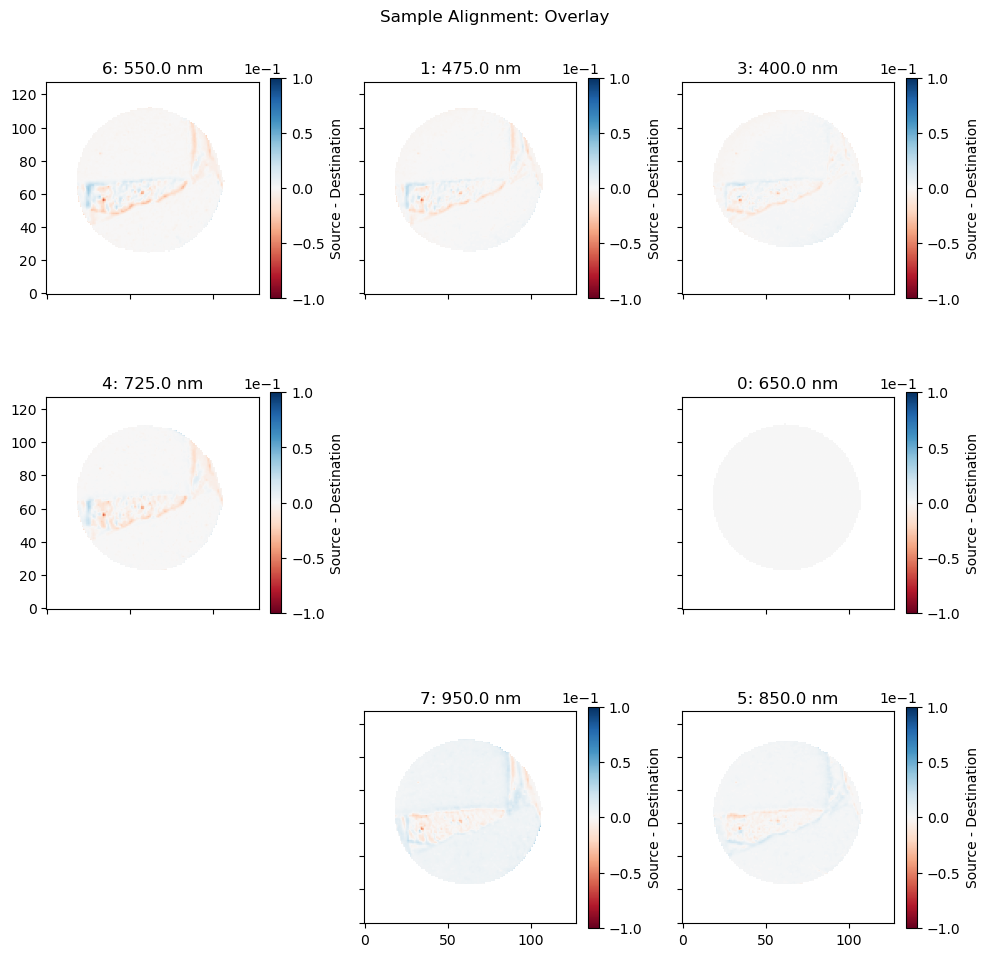

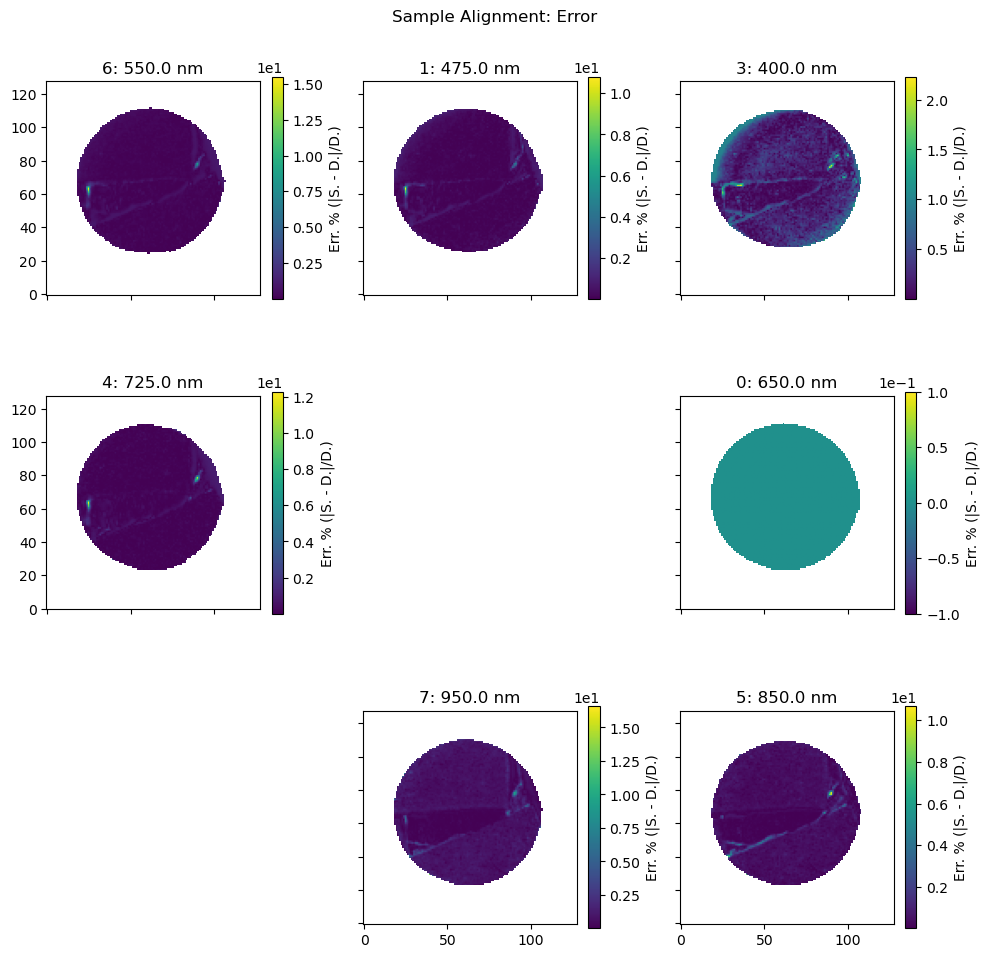

In [37]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

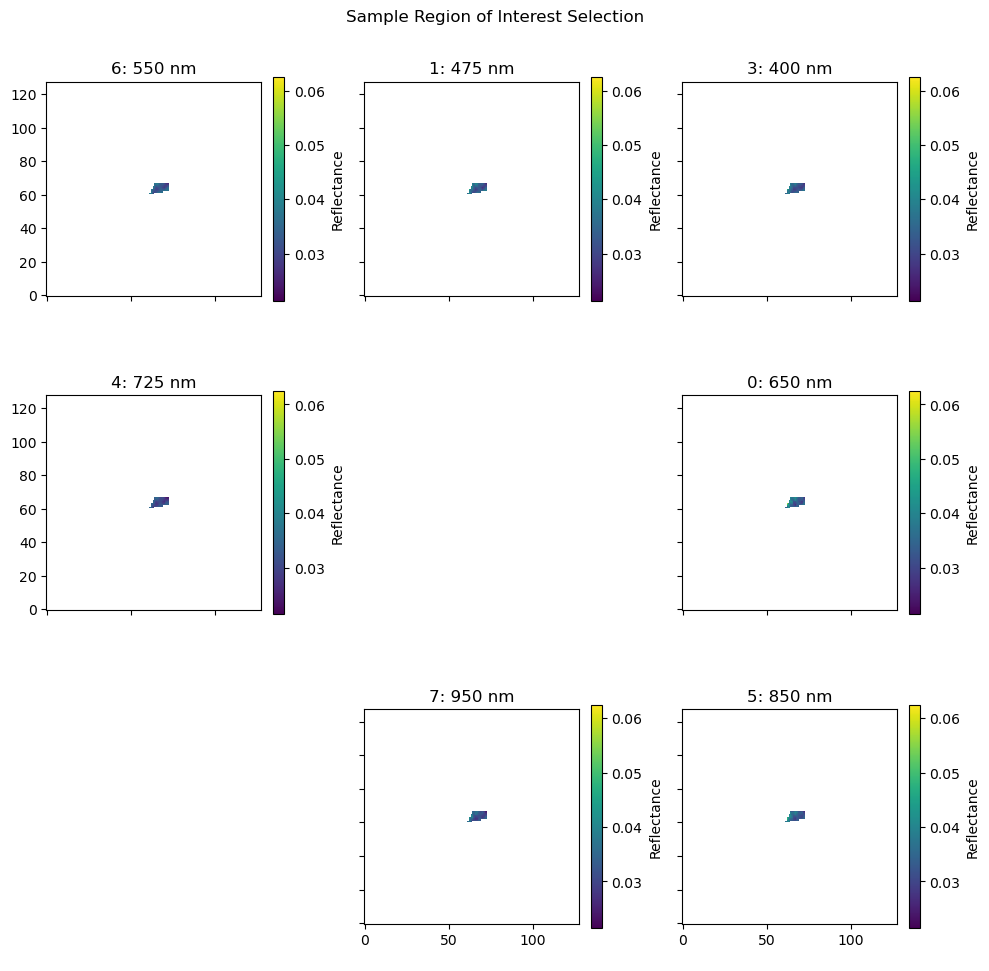

In [38]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

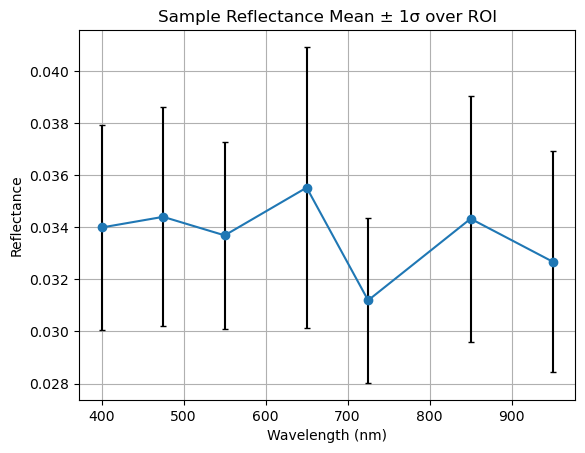

In [39]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


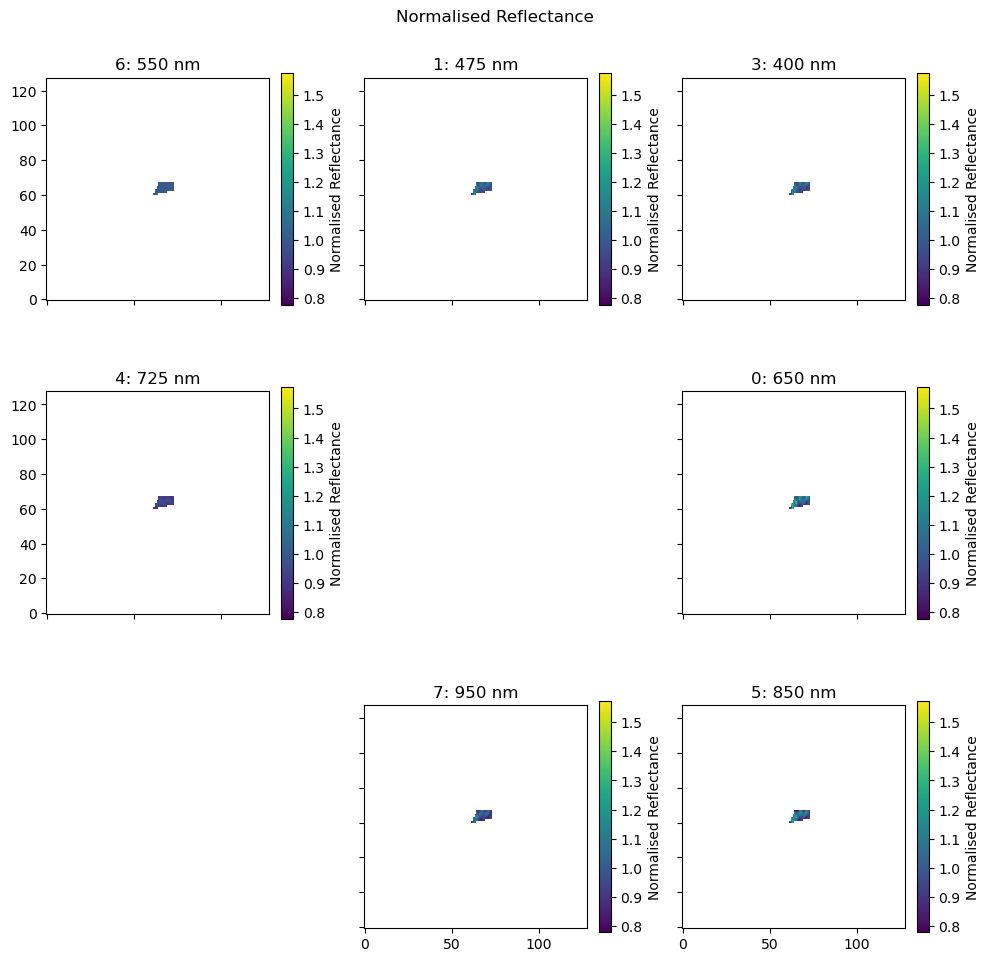

In [40]:
norm_refl = osp.normalise_reflectance(aligned_refl)

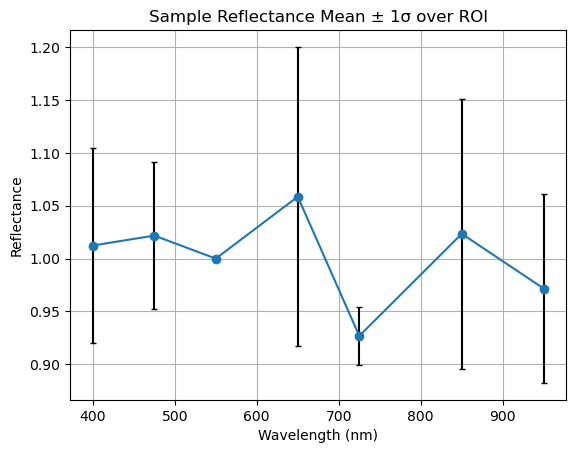

In [41]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

## Right

### Reflectance Calibration

Loading sample_3_r: 0 (650 nm)
Loading sample_3_r: 1 (475 nm)
Loading sample_3_r: 3 (400 nm)
Loading sample_3_r: 4 (725 nm)
Loading sample_3_r: 5 (850 nm)
Loading sample_3_r: 6 (550 nm)
Loading sample_3_r: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\sample_3_r\0_650
Mean image written to ..\data\sample_3_r\0_650\650_mean_rfl.tif
Error image written to ..\data\sample_3_r\0_650\650_error_rfl.tif
..\data\sample_3_r\1_475
Mean image written to ..\data\sample_3_r\1_475\475_mean_rfl.tif
Error image written to ..\data\sample_3_r\1_475\475_error_rfl.tif
..\data\sample_3_r\3_400
Mean image written to ..\data\sample_3_r\3_400\400_mean_rfl.tif
Error image written to ..\data\sample_3_r\3_400\400_error_rfl.tif
..\data\sample_3_r\4_725
Mean image written to ..\data\sample_3_r\4_725\725_mean_rfl.tif
Error image written to ..\data\sample_3_r\4_725\725_error_rfl.tif
..\data\sample_3_r\5_850
Mean image written to ..\data\sample_3_r\5_850\850_mean_rfl.tif
Error image written to ..\data\sample_3_r\5_850\850_error_rfl.tif
..\data\sample_3_r\6_550
Mean image written to ..\data\sample_3_r\6_550\550_mean_rfl.tif
Error image written to ..\data\sample_3_r\6_550\550_error_rfl.tif
..\data\sample_3_r\7_950
Mean image written to ..\data\sample_3_r\7_95

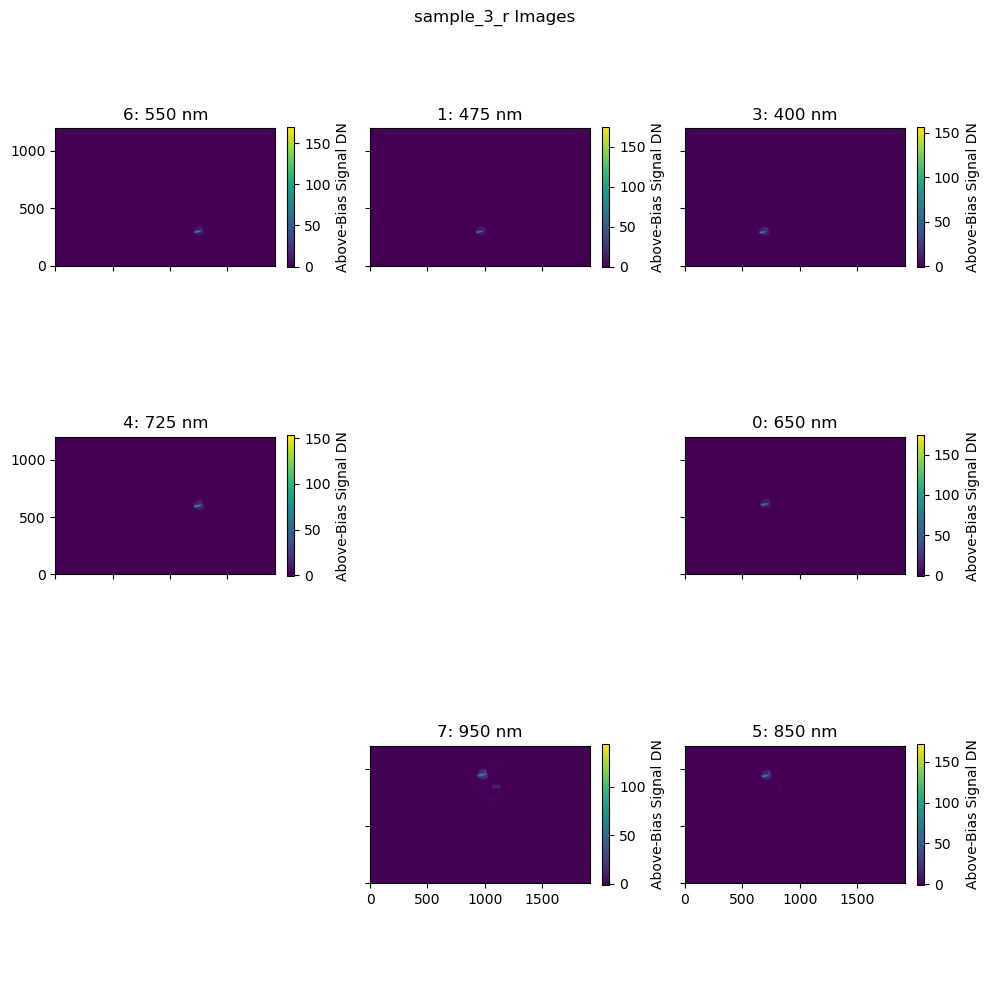

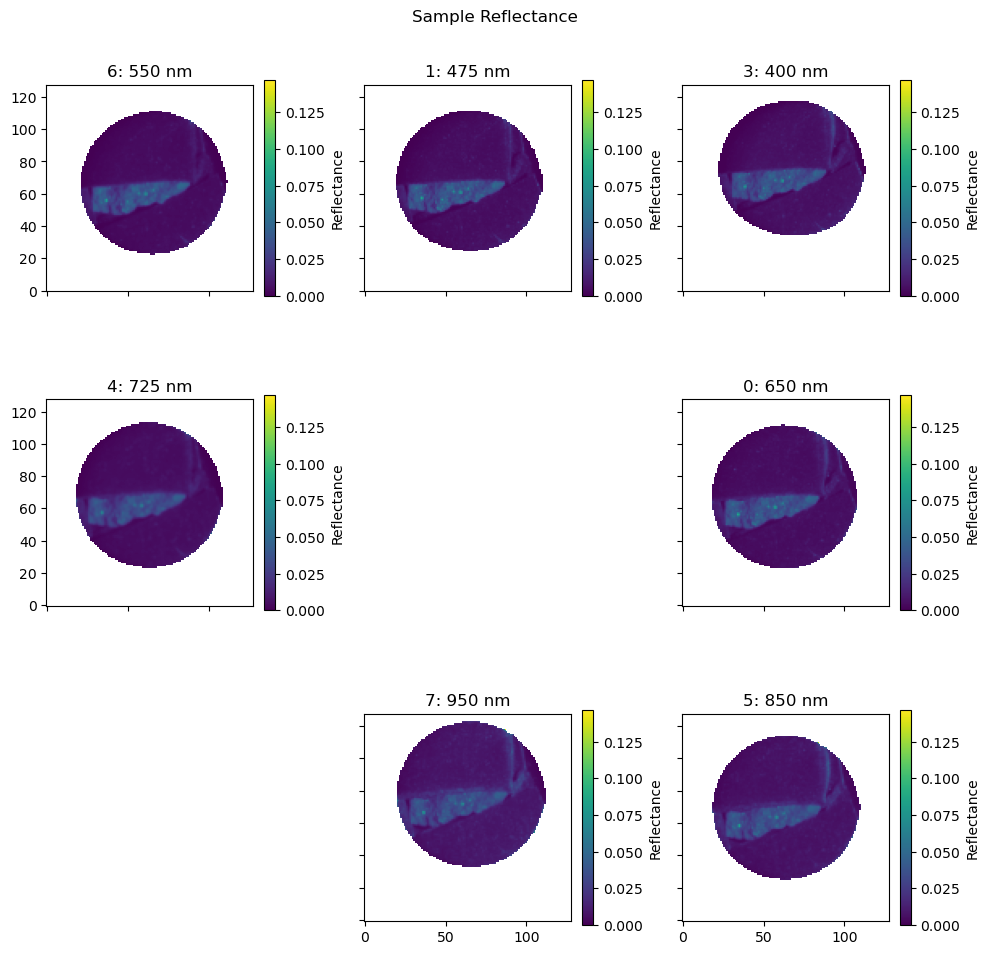

In [42]:
smpl_imgs = osp.load_sample('sample_3_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: divide by zero encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


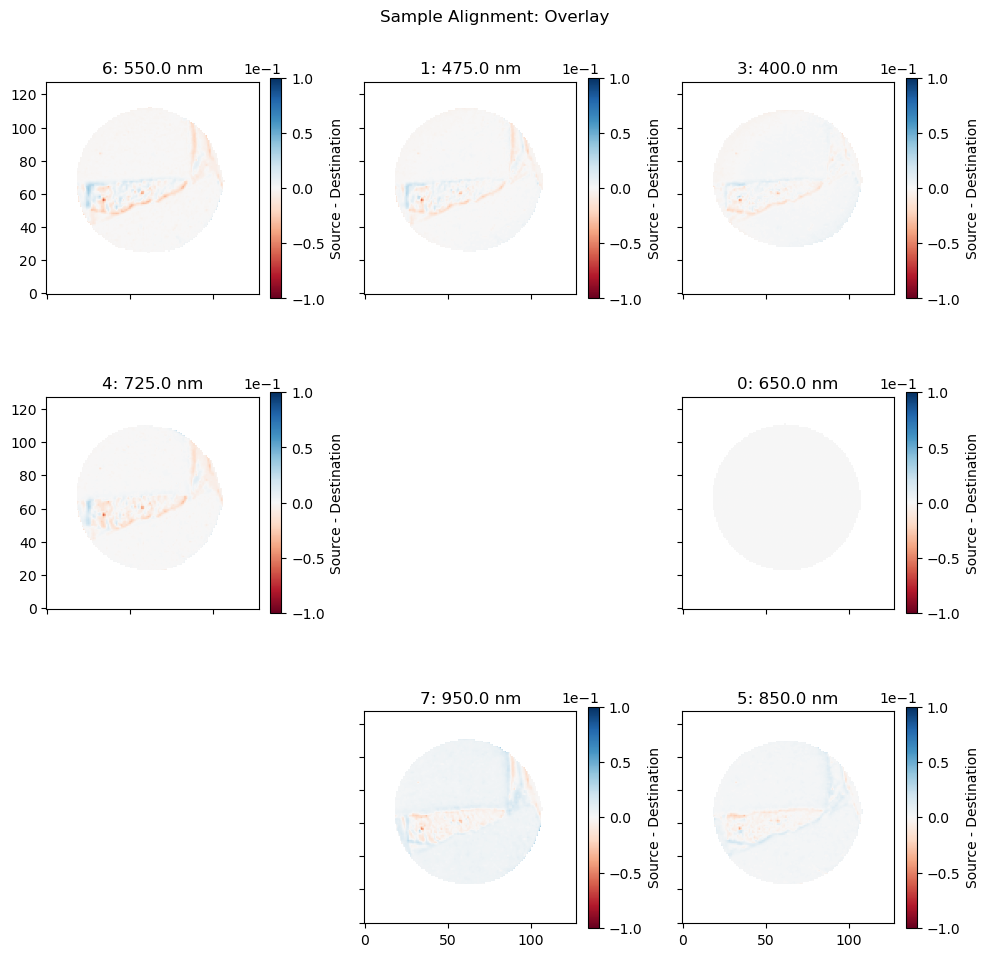

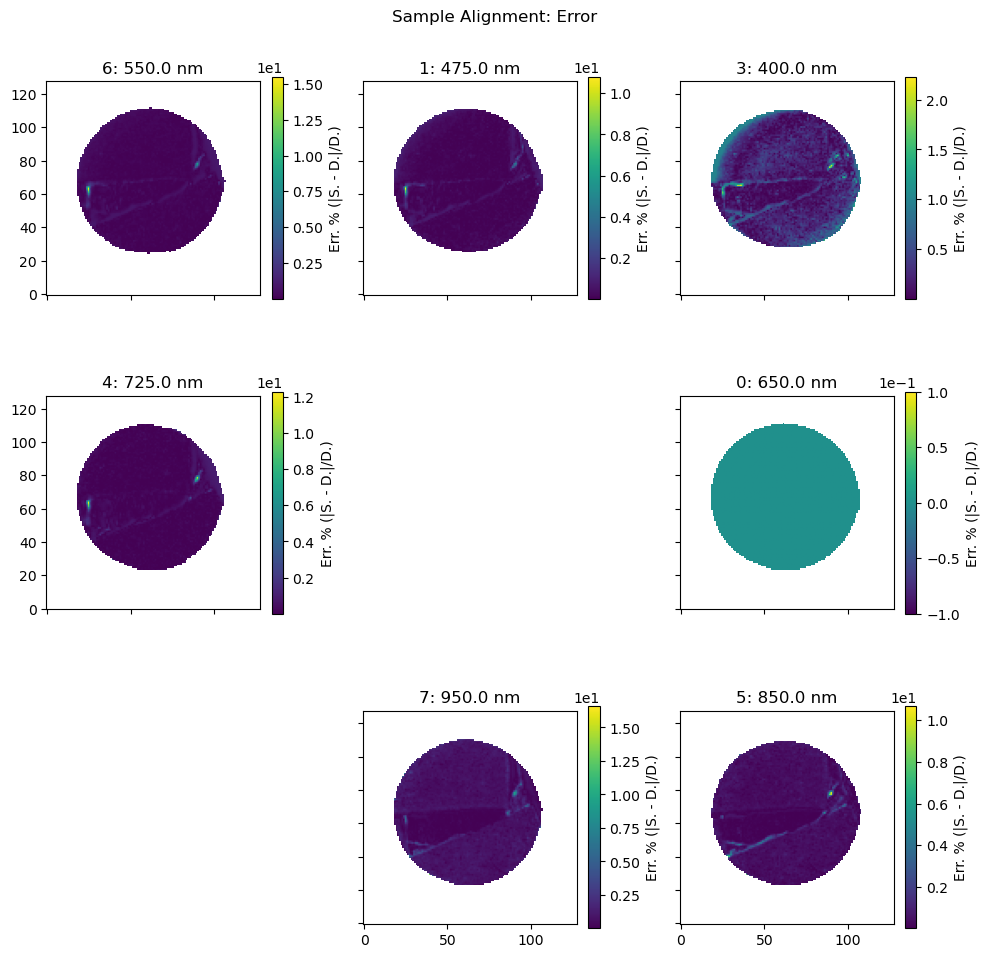

In [43]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

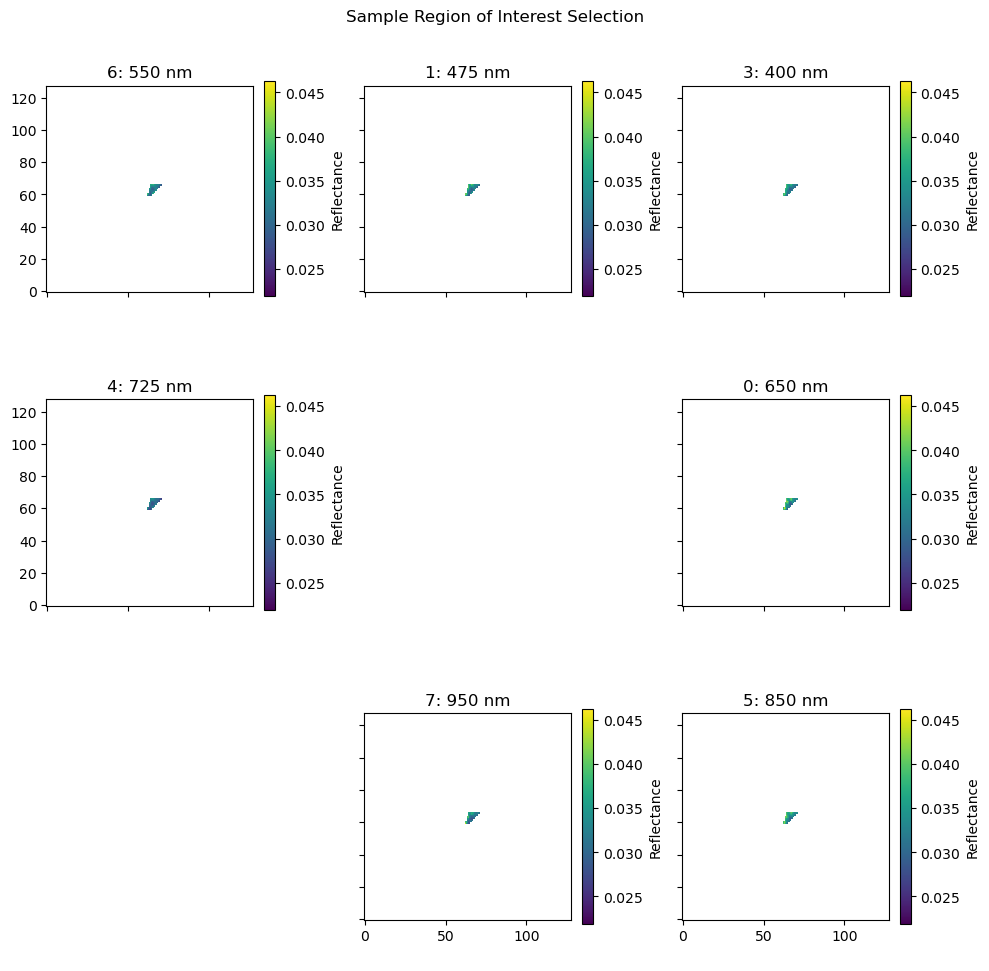

In [44]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

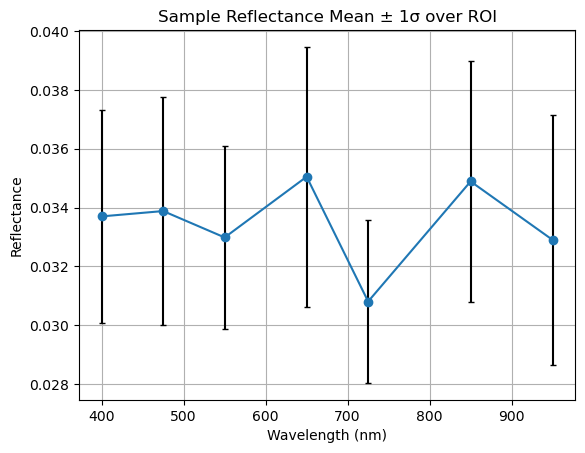

In [45]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


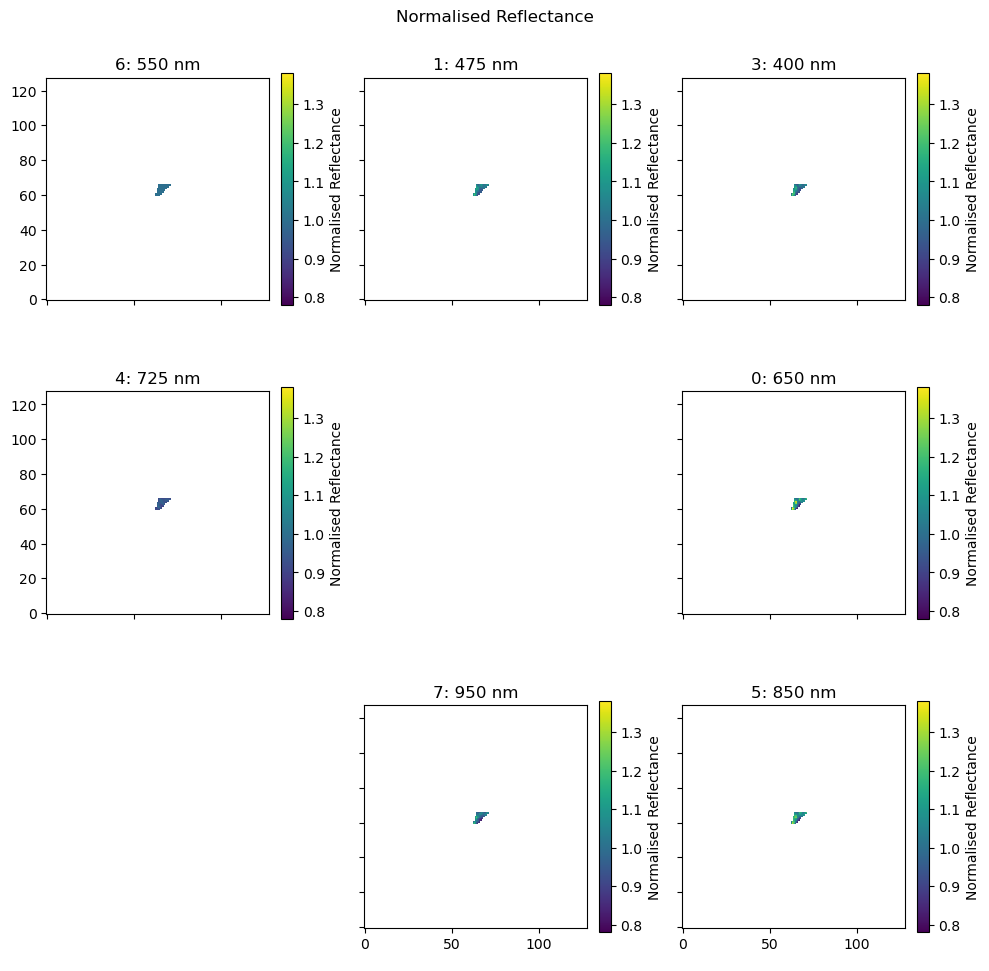

In [46]:
norm_refl = osp.normalise_reflectance(aligned_refl)

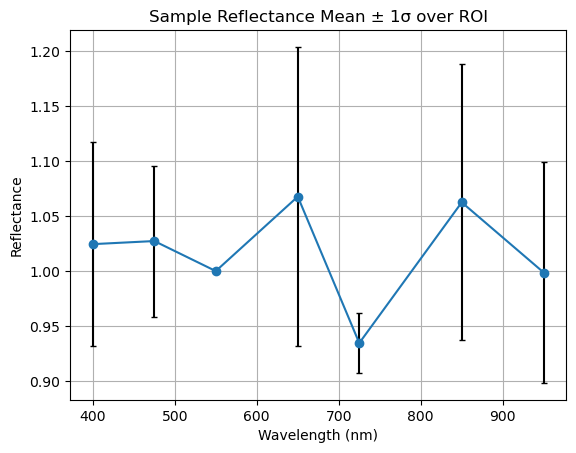

In [47]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

# Sample 4

## Left

### Reflectance Calibration

Loading sample_4_r: 0 (650 nm)
Loading sample_4_r: 1 (475 nm)
Loading sample_4_r: 3 (400 nm)
Loading sample_4_r: 4 (725 nm)
Loading sample_4_r: 5 (850 nm)
Loading sample_4_r: 6 (550 nm)
Loading sample_4_r: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\sample_4_r\0_650
Mean image written to ..\data\sample_4_r\0_650\650_mean_rfl.tif
Error image written to ..\data\sample_4_r\0_650\650_error_rfl.tif
..\data\sample_4_r\1_475
Mean image written to ..\data\sample_4_r\1_475\475_mean_rfl.tif
Error image written to ..\data\sample_4_r\1_475\475_error_rfl.tif
..\data\sample_4_r\3_400
Mean image written to ..\data\sample_4_r\3_400\400_mean_rfl.tif
Error image written to ..\data\sample_4_r\3_400\400_error_rfl.tif
..\data\sample_4_r\4_725
Mean image written to ..\data\sample_4_r\4_725\725_mean_rfl.tif
Error image written to ..\data\sample_4_r\4_725\725_error_rfl.tif
..\data\sample_4_r\5_850
Mean image written to ..\data\sample_4_r\5_850\850_mean_rfl.tif
Error image written to ..\data\sample_4_r\5_850\850_error_rfl.tif
..\data\sample_4_r\6_550
Mean image written to ..\data\sample_4_r\6_550\550_mean_rfl.tif
Error image written to ..\data\sample_4_r\6_550\550_error_rfl.tif
..\data\sample_4_r\7_950
Mean image written to ..\data\sample_4_r\7_95

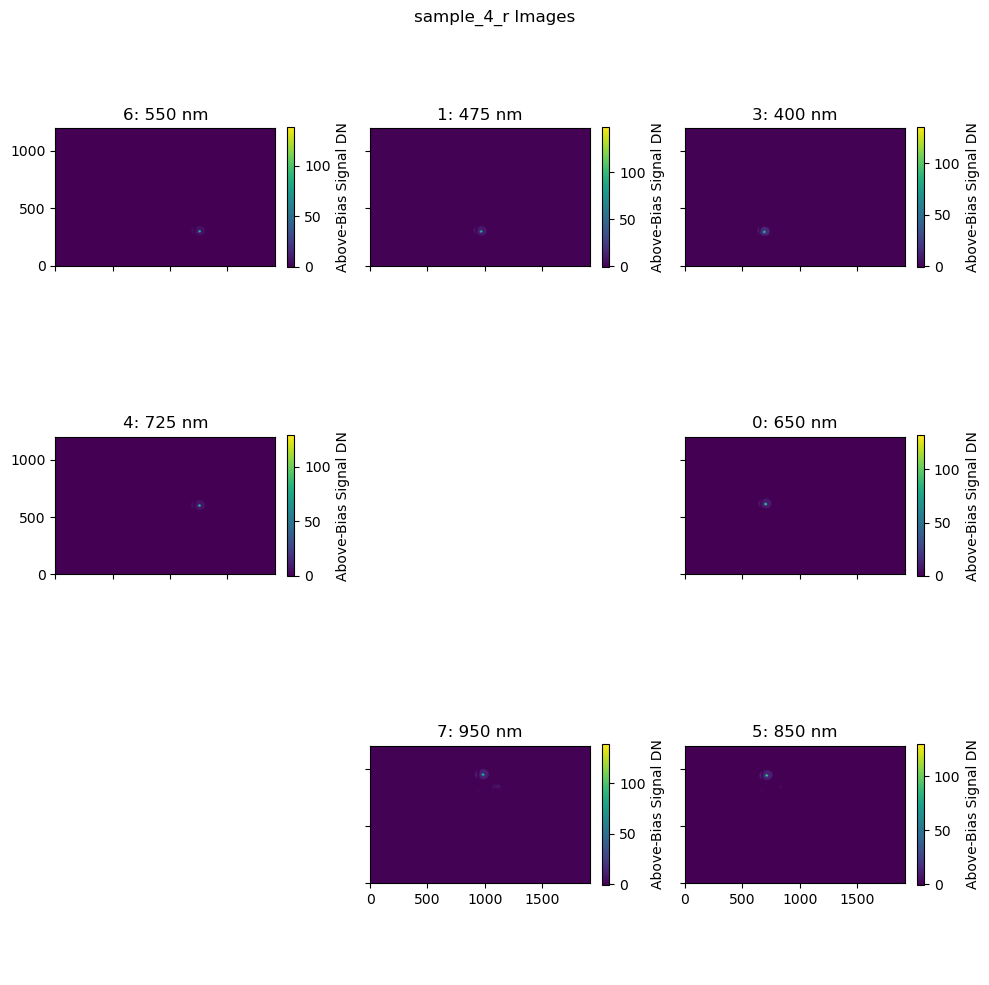

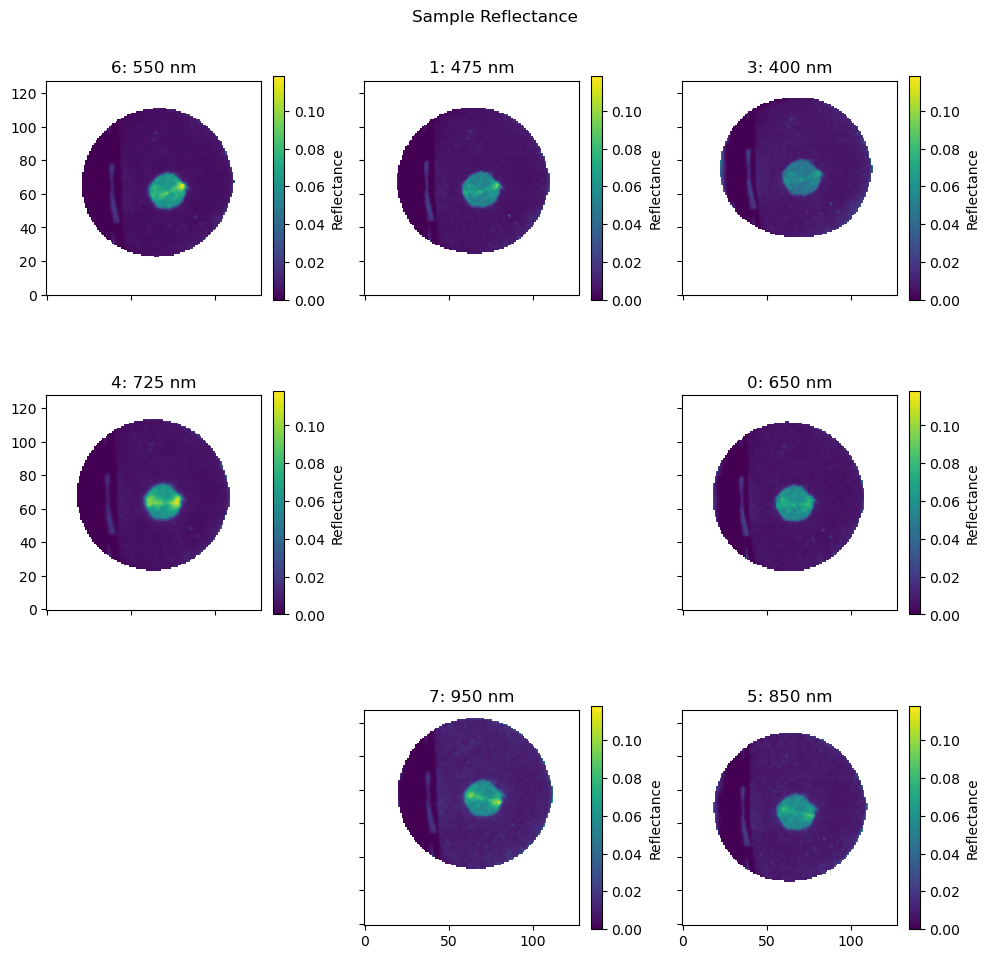

In [48]:
smpl_imgs = osp.load_sample('sample_4_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: divide by zero encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


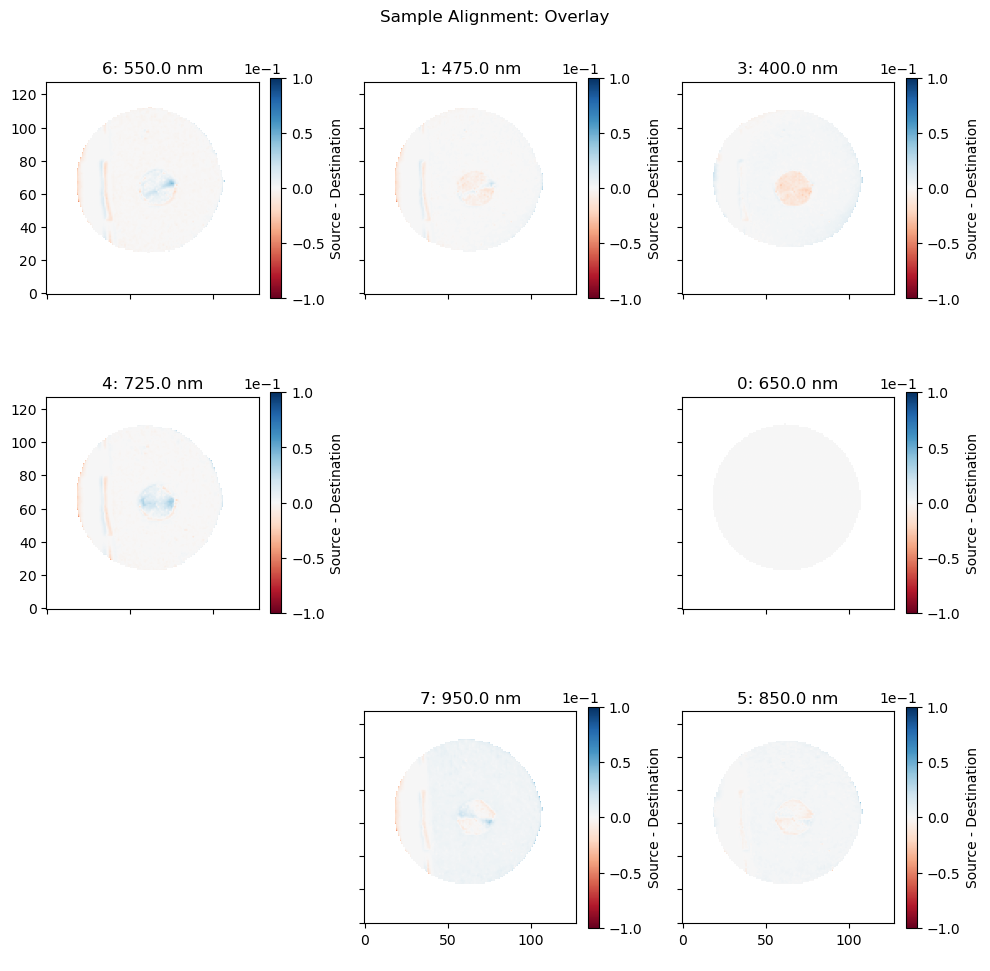

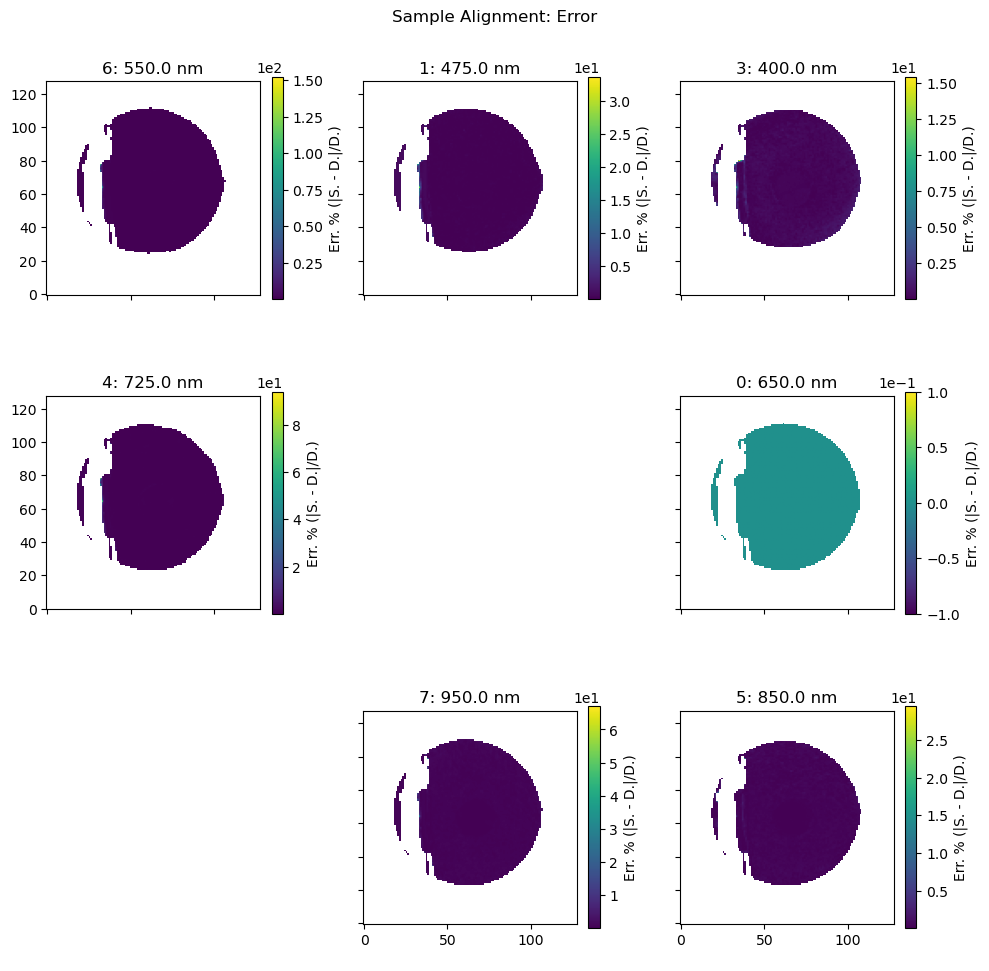

In [49]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

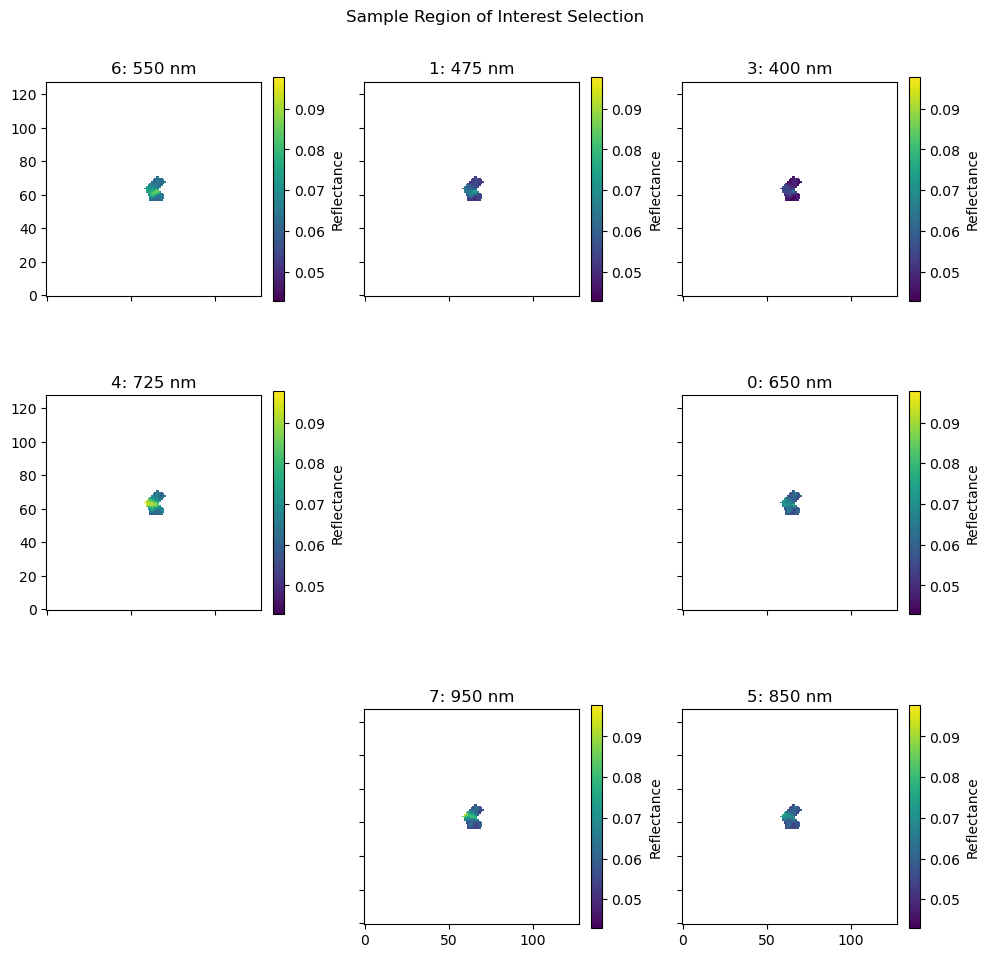

In [50]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

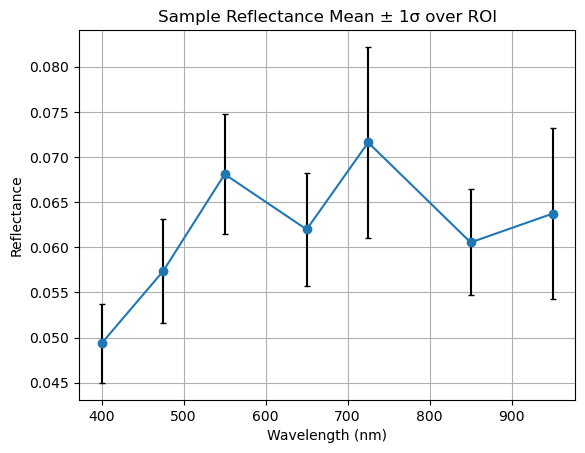

In [51]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


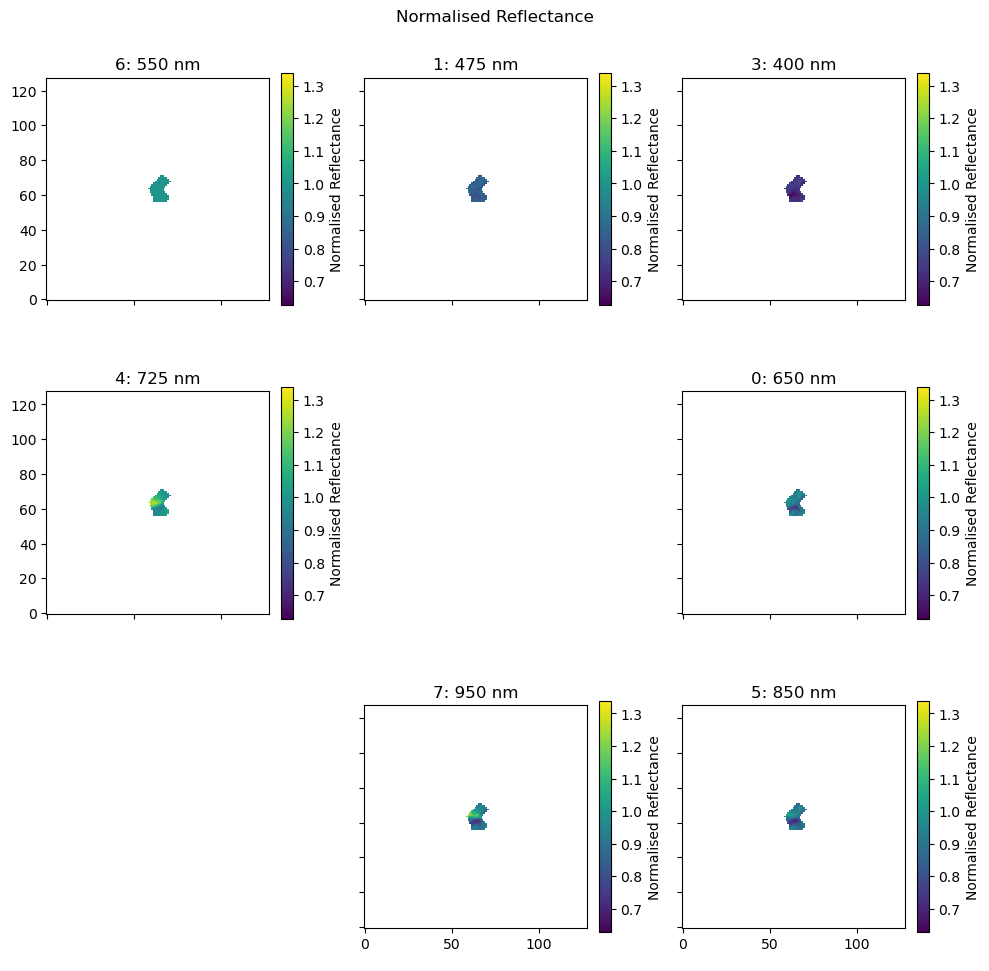

In [52]:
norm_refl = osp.normalise_reflectance(aligned_refl)

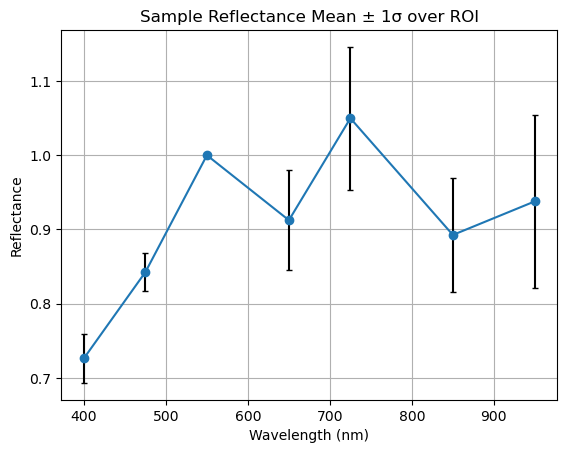

In [53]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

## Right

### Reflectance Calibration

Loading sample_4_r: 0 (650 nm)
Loading sample_4_r: 1 (475 nm)
Loading sample_4_r: 3 (400 nm)
Loading sample_4_r: 4 (725 nm)
Loading sample_4_r: 5 (850 nm)
Loading sample_4_r: 6 (550 nm)
Loading sample_4_r: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\sample_4_r\0_650
Mean image written to ..\data\sample_4_r\0_650\650_mean_rfl.tif
Error image written to ..\data\sample_4_r\0_650\650_error_rfl.tif
..\data\sample_4_r\1_475
Mean image written to ..\data\sample_4_r\1_475\475_mean_rfl.tif
Error image written to ..\data\sample_4_r\1_475\475_error_rfl.tif
..\data\sample_4_r\3_400
Mean image written to ..\data\sample_4_r\3_400\400_mean_rfl.tif
Error image written to ..\data\sample_4_r\3_400\400_error_rfl.tif
..\data\sample_4_r\4_725
Mean image written to ..\data\sample_4_r\4_725\725_mean_rfl.tif
Error image written to ..\data\sample_4_r\4_725\725_error_rfl.tif
..\data\sample_4_r\5_850
Mean image written to ..\data\sample_4_r\5_850\850_mean_rfl.tif
Error image written to ..\data\sample_4_r\5_850\850_error_rfl.tif
..\data\sample_4_r\6_550
Mean image written to ..\data\sample_4_r\6_550\550_mean_rfl.tif
Error image written to ..\data\sample_4_r\6_550\550_error_rfl.tif
..\data\sample_4_r\7_950
Mean image written to ..\data\sample_4_r\7_95

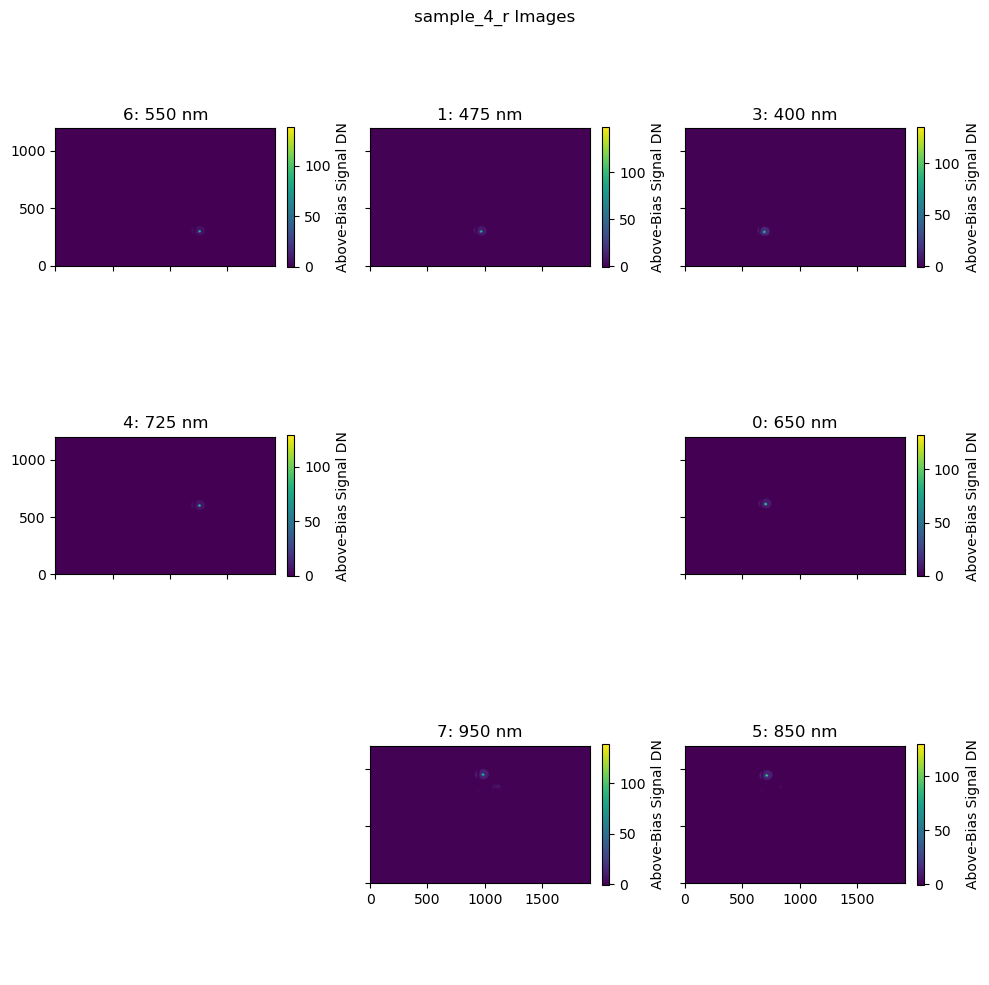

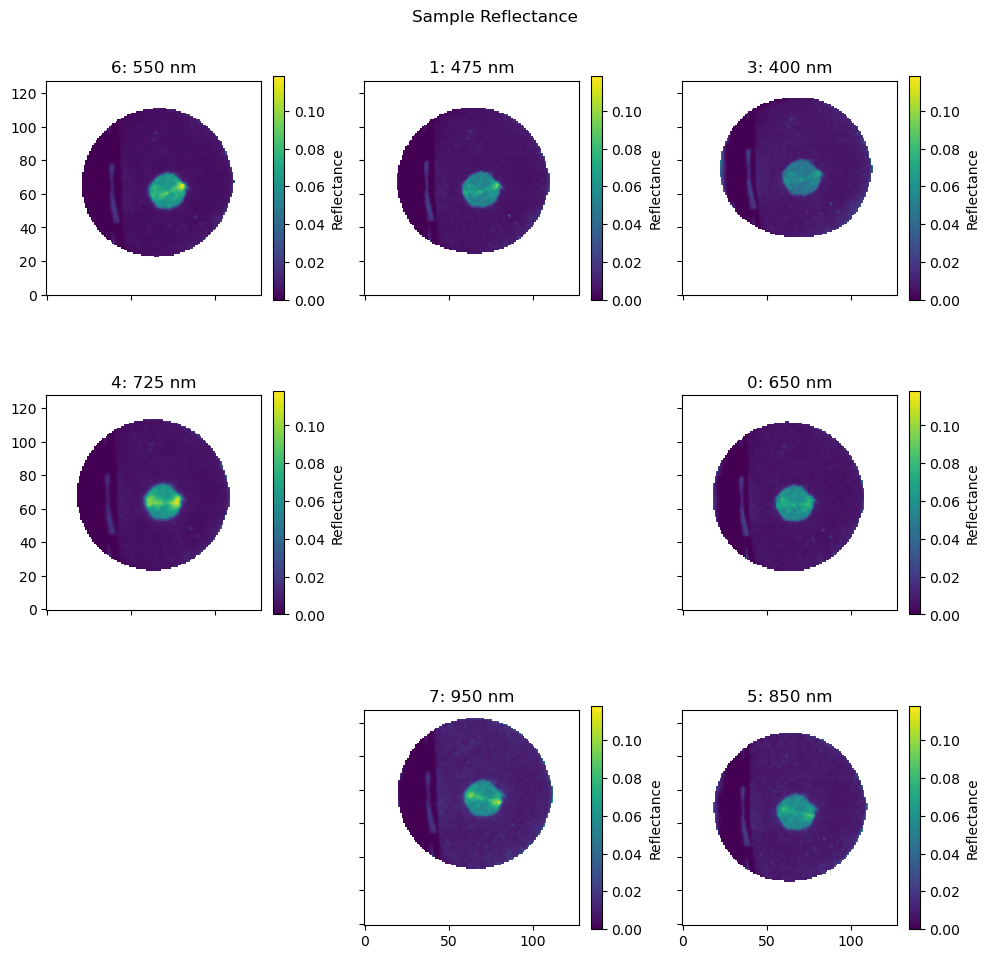

In [54]:
smpl_imgs = osp.load_sample('sample_4_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: divide by zero encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


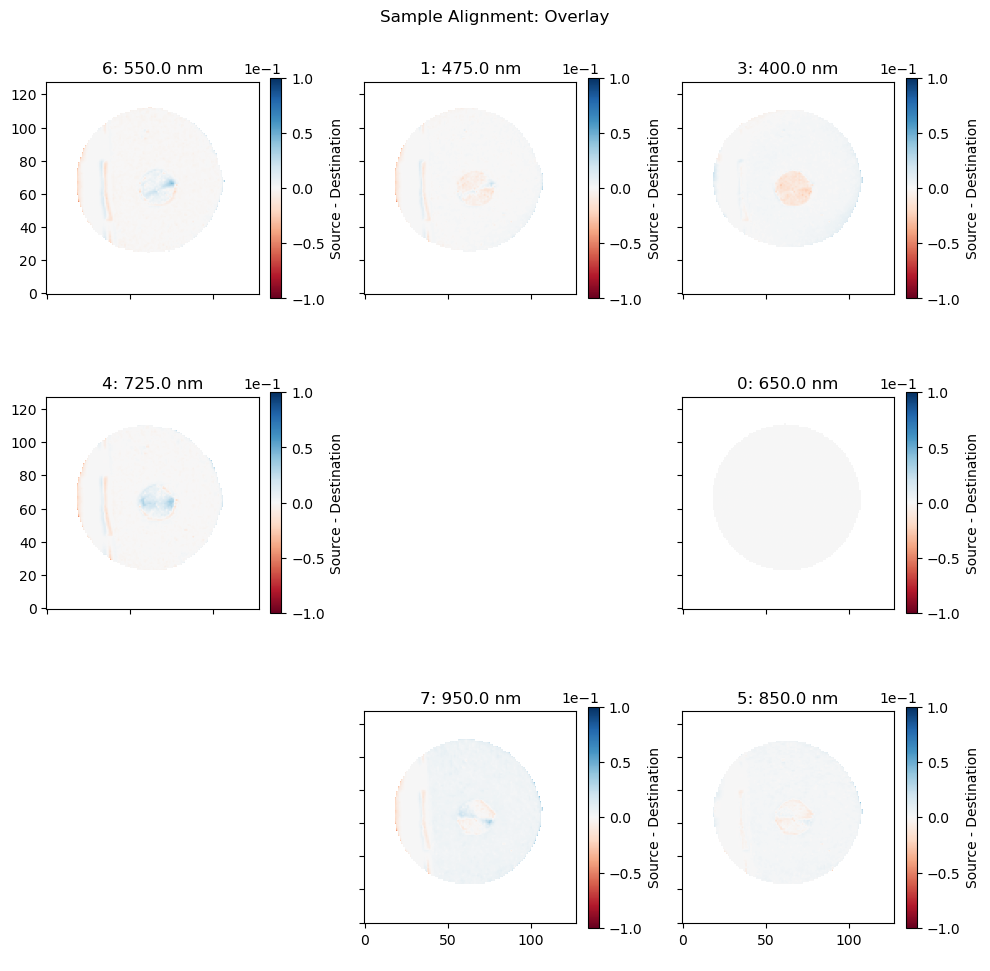

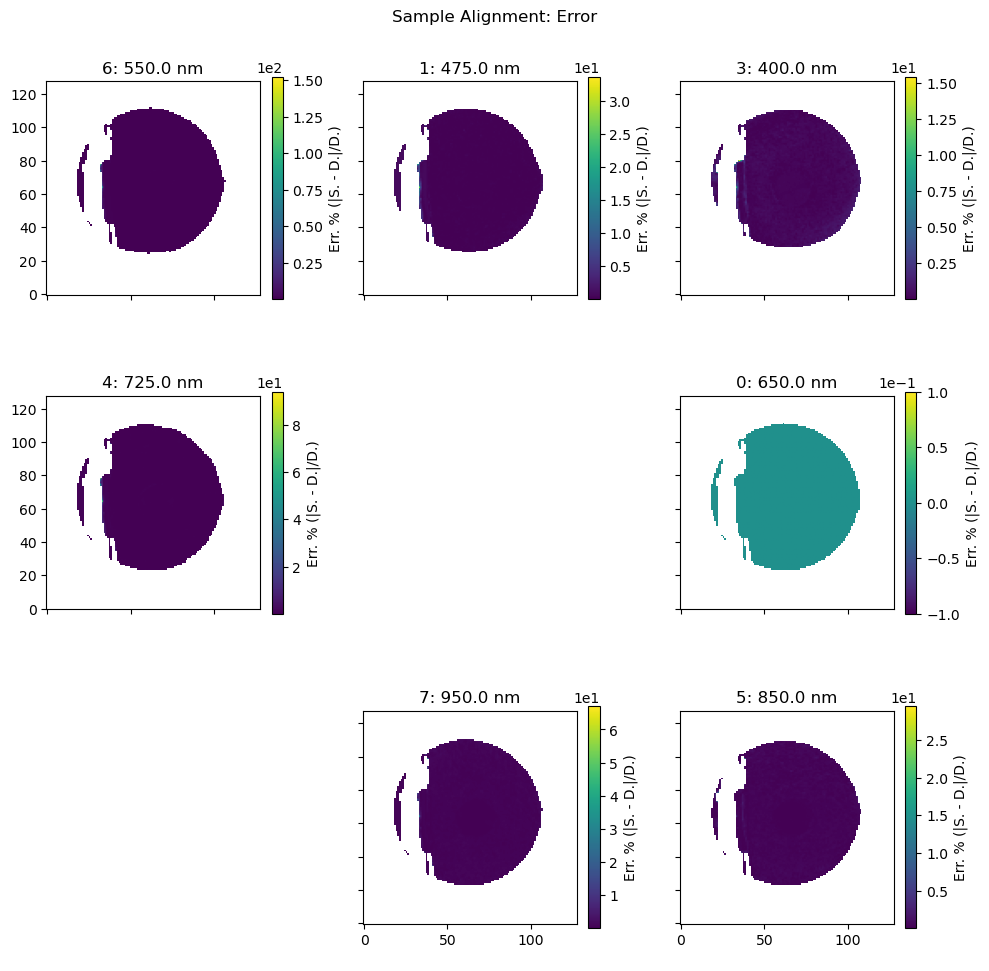

In [55]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

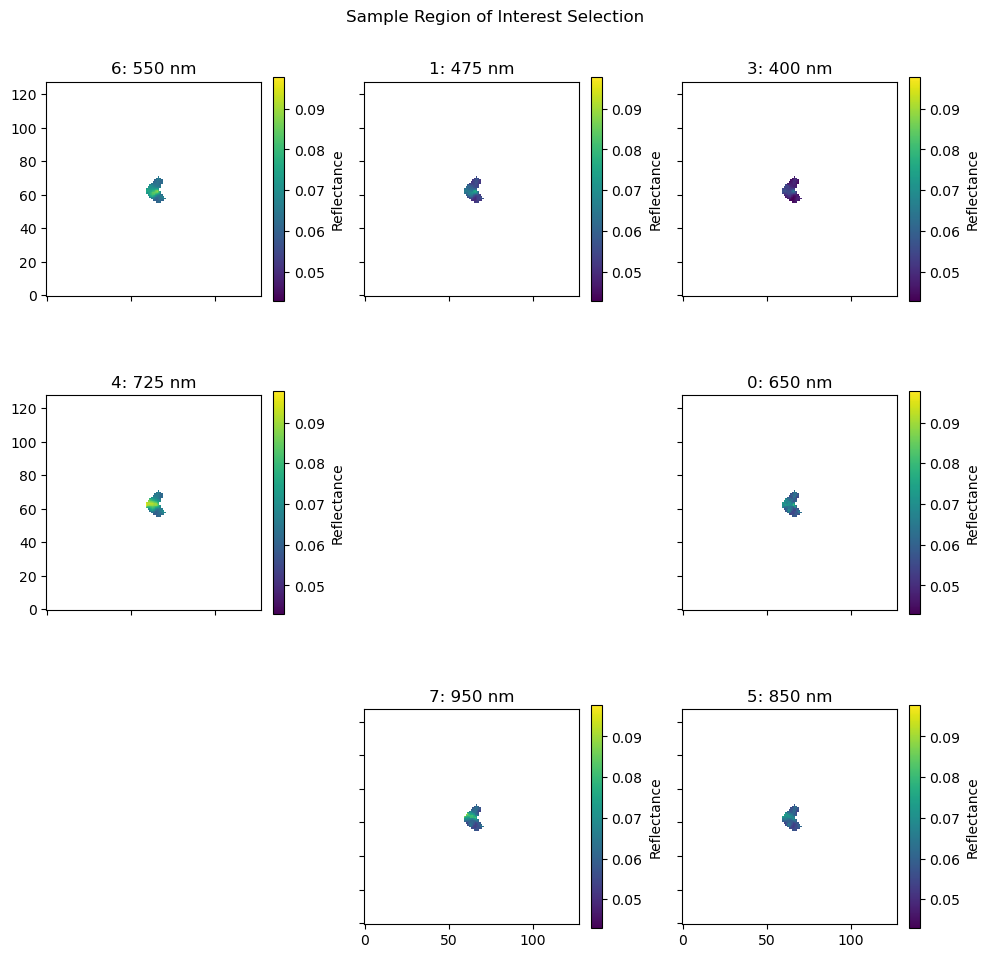

In [56]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

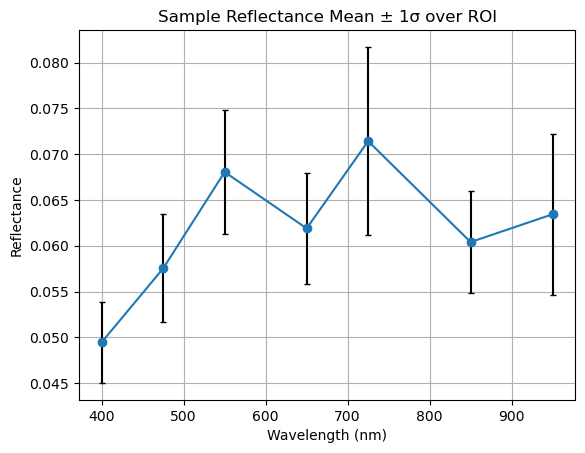

In [57]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


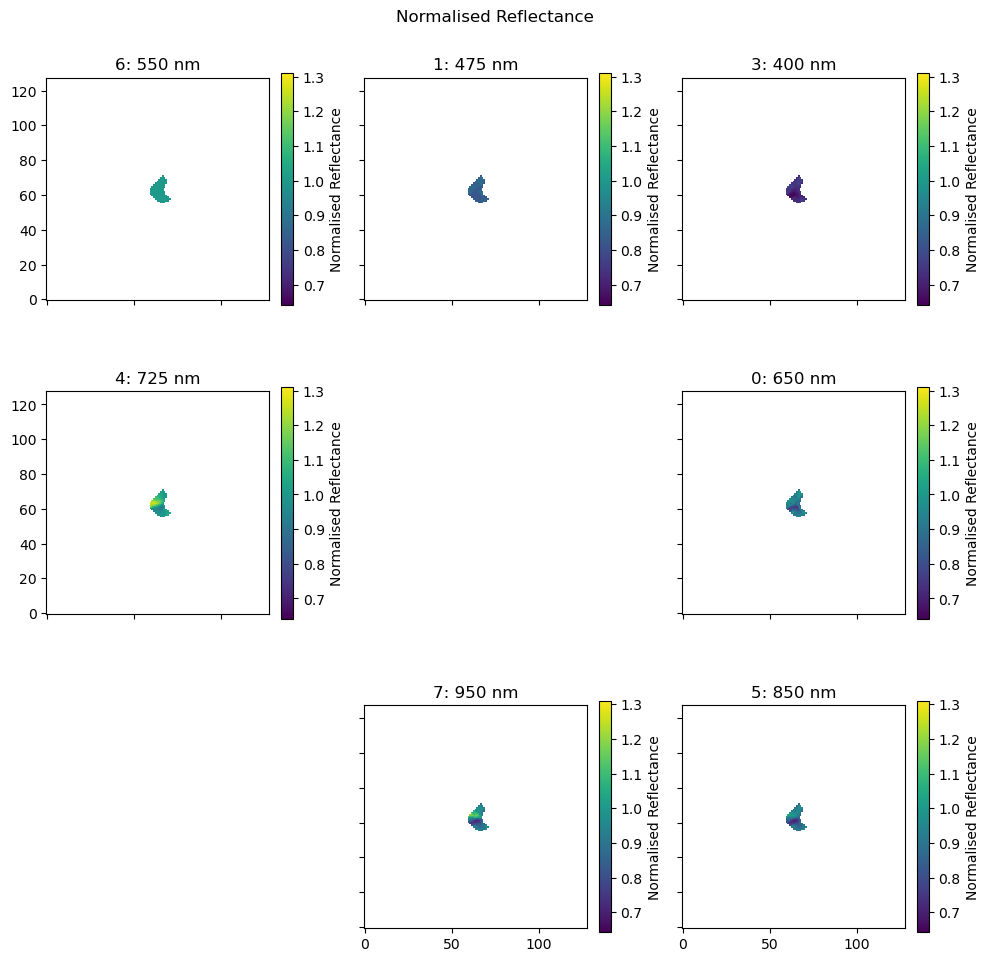

In [58]:
norm_refl = osp.normalise_reflectance(aligned_refl)

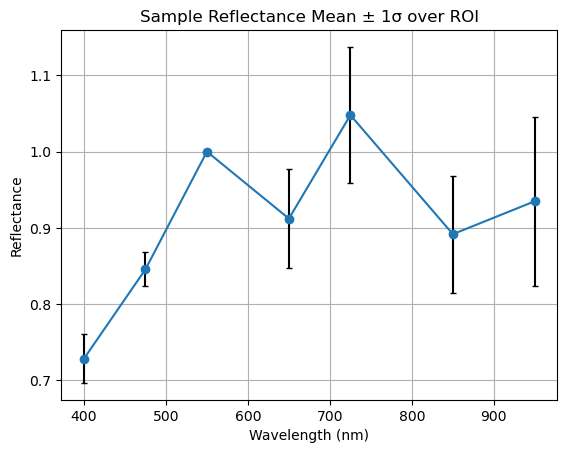

In [59]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

# Sample 5

## Left

### Reflectance Calibration

Loading sample_5_r: 0 (650 nm)
Loading sample_5_r: 1 (475 nm)
Loading sample_5_r: 3 (400 nm)
Loading sample_5_r: 4 (725 nm)
Loading sample_5_r: 5 (850 nm)
Loading sample_5_r: 6 (550 nm)
Loading sample_5_r: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\sample_5_r\0_650
Mean image written to ..\data\sample_5_r\0_650\650_mean_rfl.tif
Error image written to ..\data\sample_5_r\0_650\650_error_rfl.tif
..\data\sample_5_r\1_475
Mean image written to ..\data\sample_5_r\1_475\475_mean_rfl.tif
Error image written to ..\data\sample_5_r\1_475\475_error_rfl.tif
..\data\sample_5_r\3_400
Mean image written to ..\data\sample_5_r\3_400\400_mean_rfl.tif
Error image written to ..\data\sample_5_r\3_400\400_error_rfl.tif
..\data\sample_5_r\4_725
Mean image written to ..\data\sample_5_r\4_725\725_mean_rfl.tif
Error image written to ..\data\sample_5_r\4_725\725_error_rfl.tif
..\data\sample_5_r\5_850
Mean image written to ..\data\sample_5_r\5_850\850_mean_rfl.tif
Error image written to ..\data\sample_5_r\5_850\850_error_rfl.tif
..\data\sample_5_r\6_550
Mean image written to ..\data\sample_5_r\6_550\550_mean_rfl.tif
Error image written to ..\data\sample_5_r\6_550\550_error_rfl.tif
..\data\sample_5_r\7_950
Mean image written to ..\data\sample_5_r\7_95

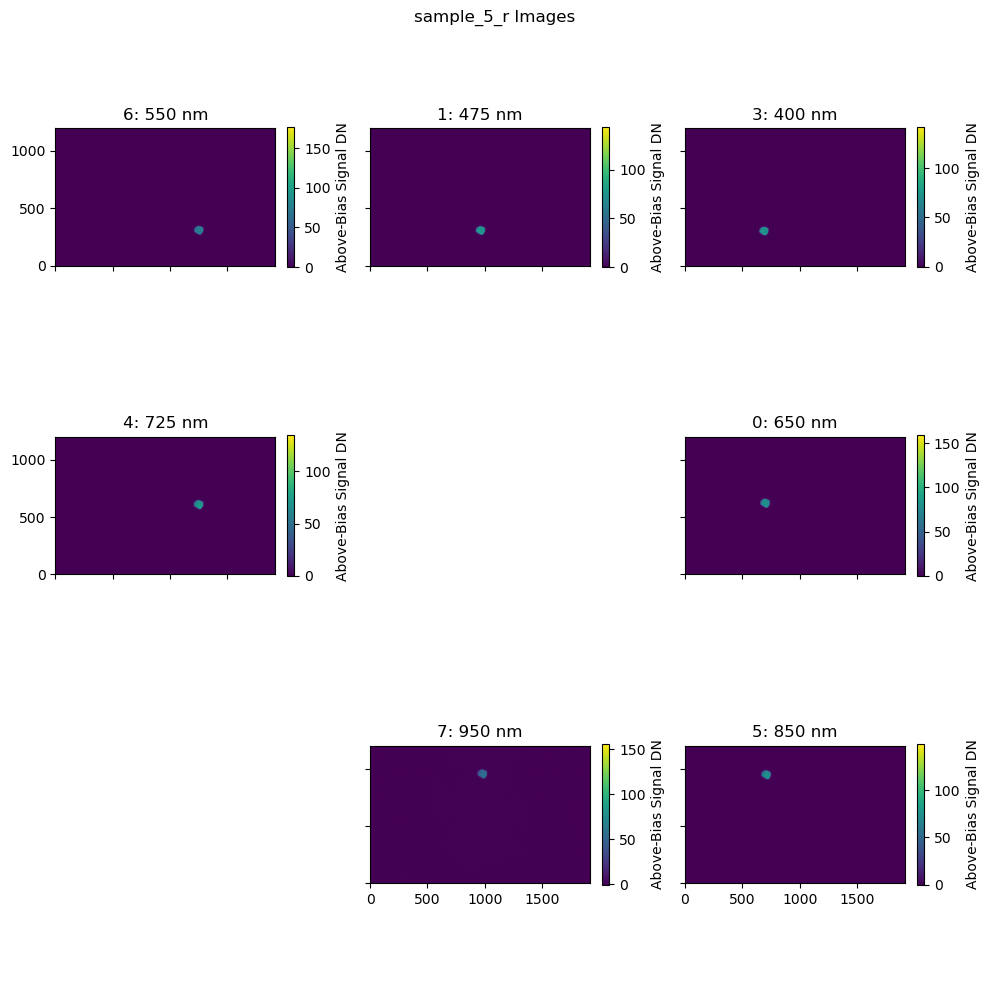

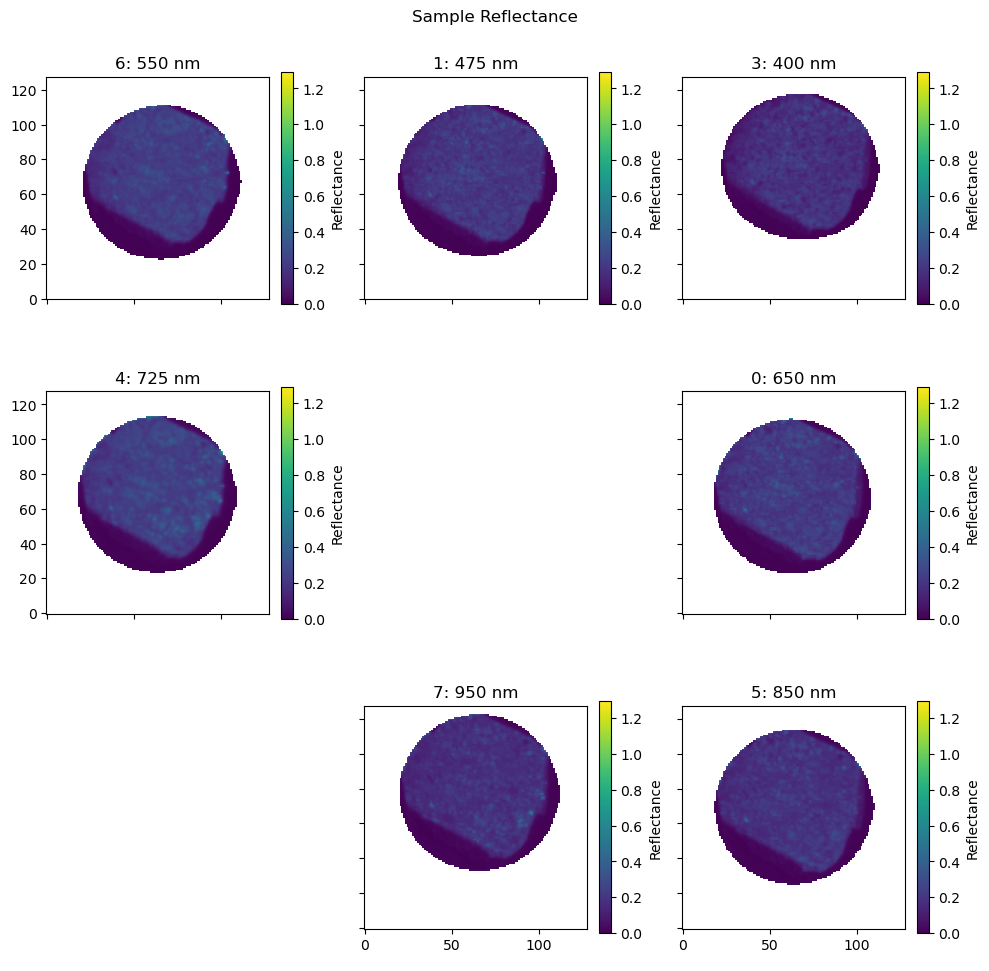

In [60]:
smpl_imgs = osp.load_sample('sample_5_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


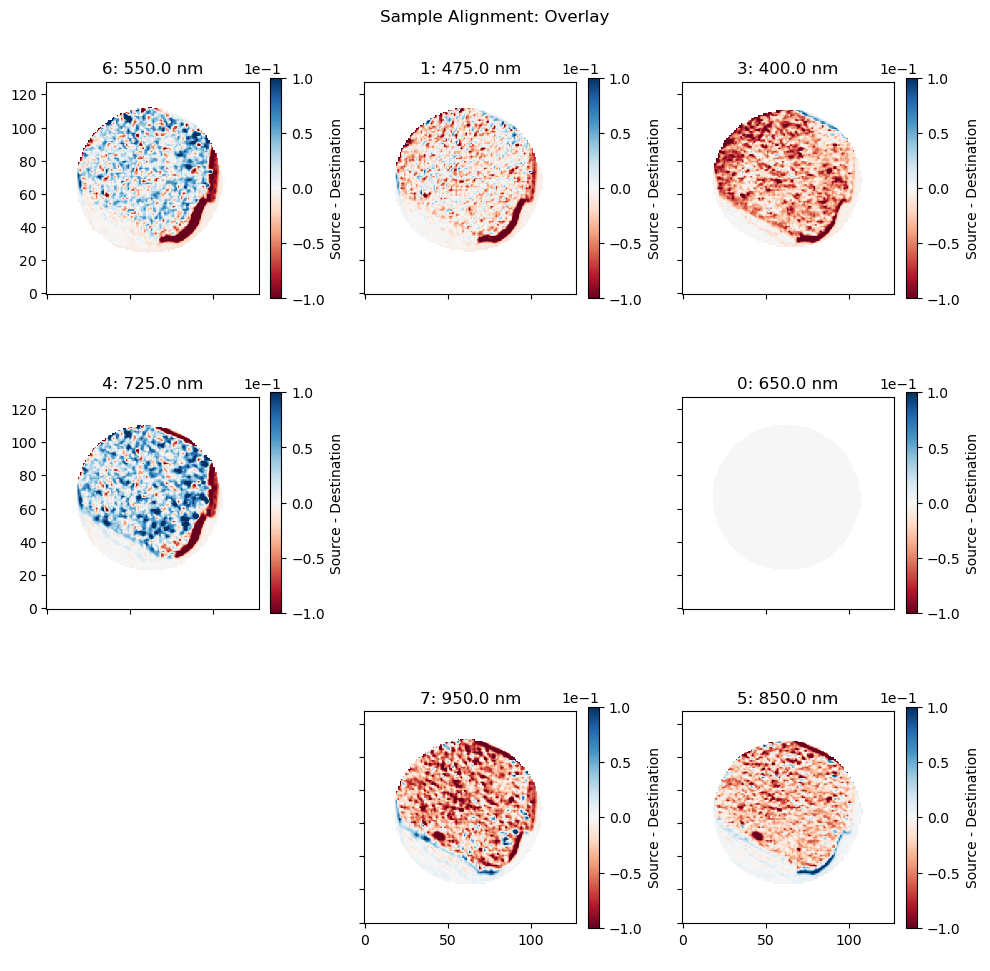

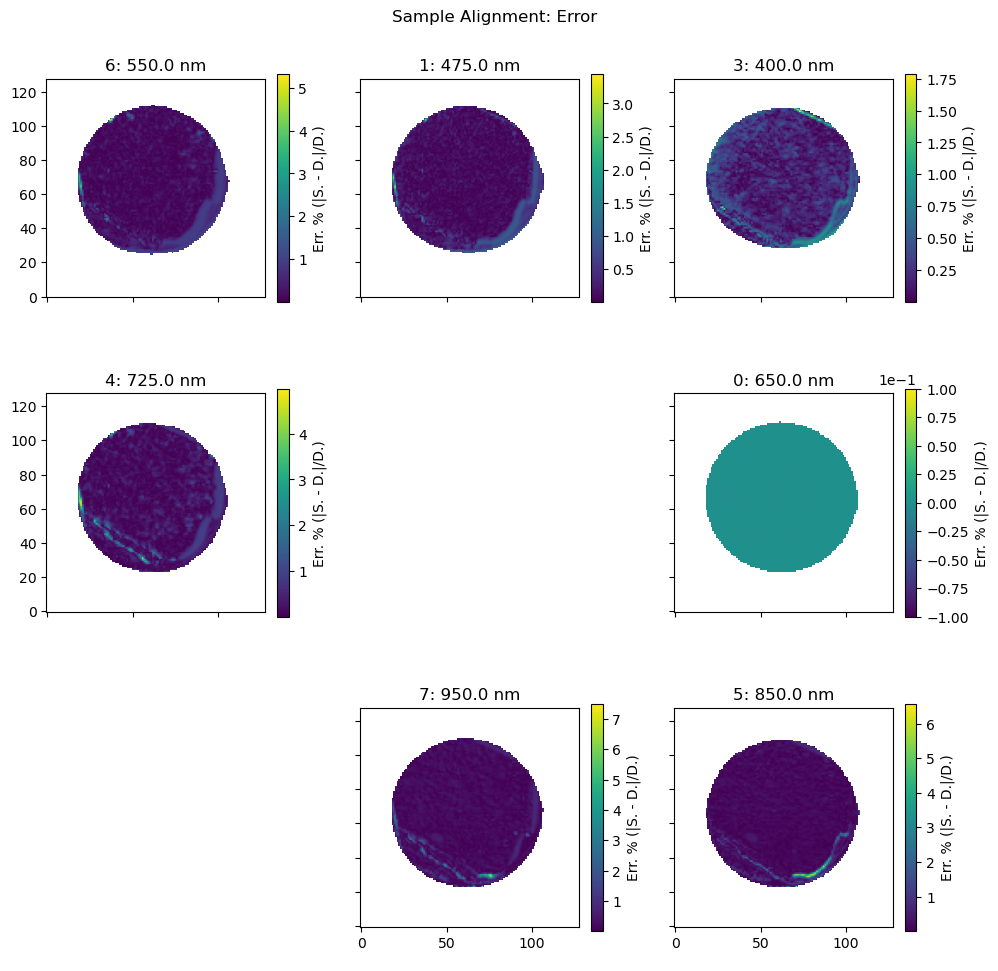

In [61]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

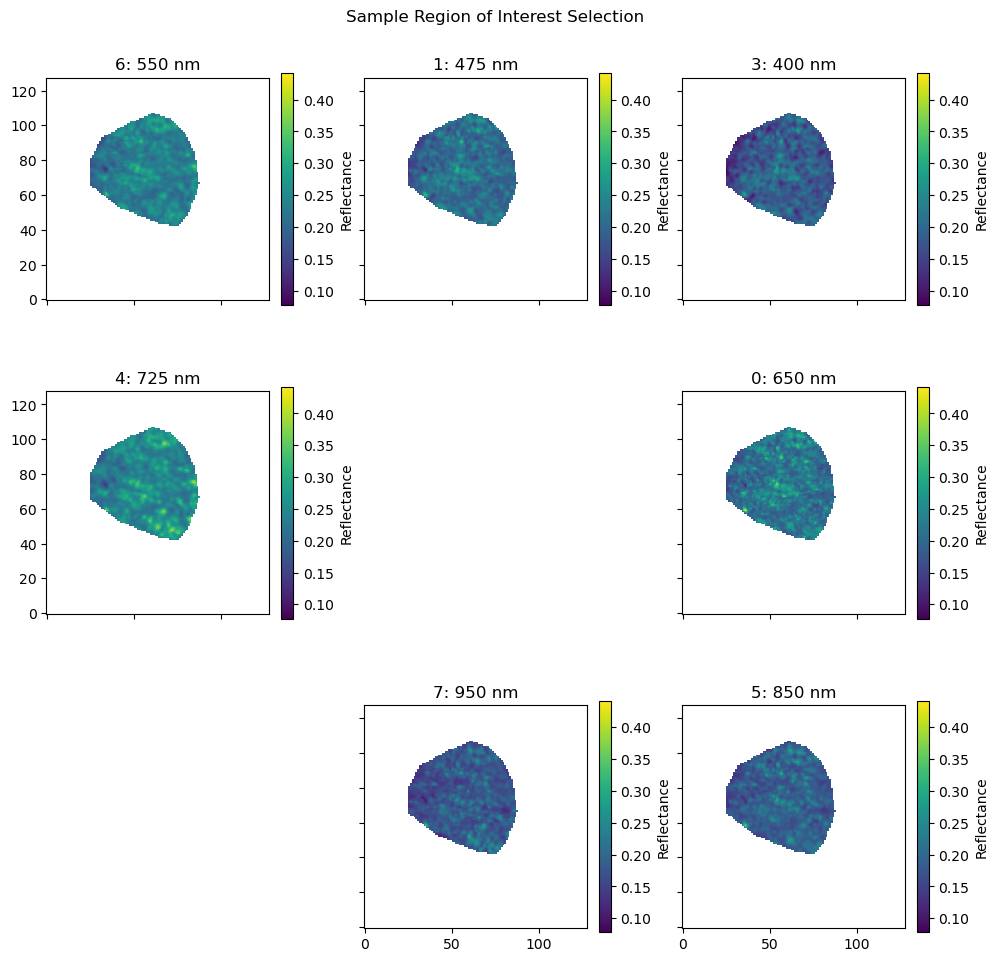

In [62]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

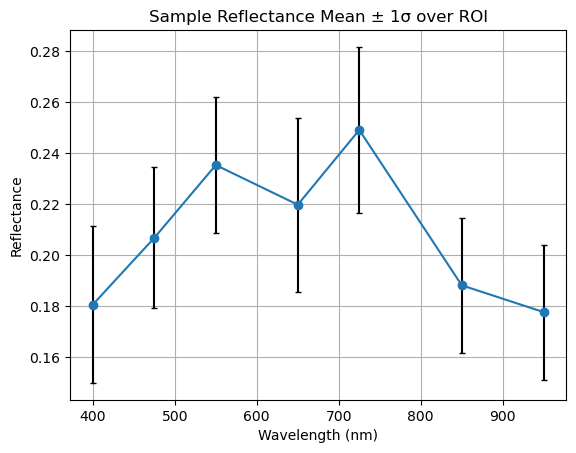

In [63]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


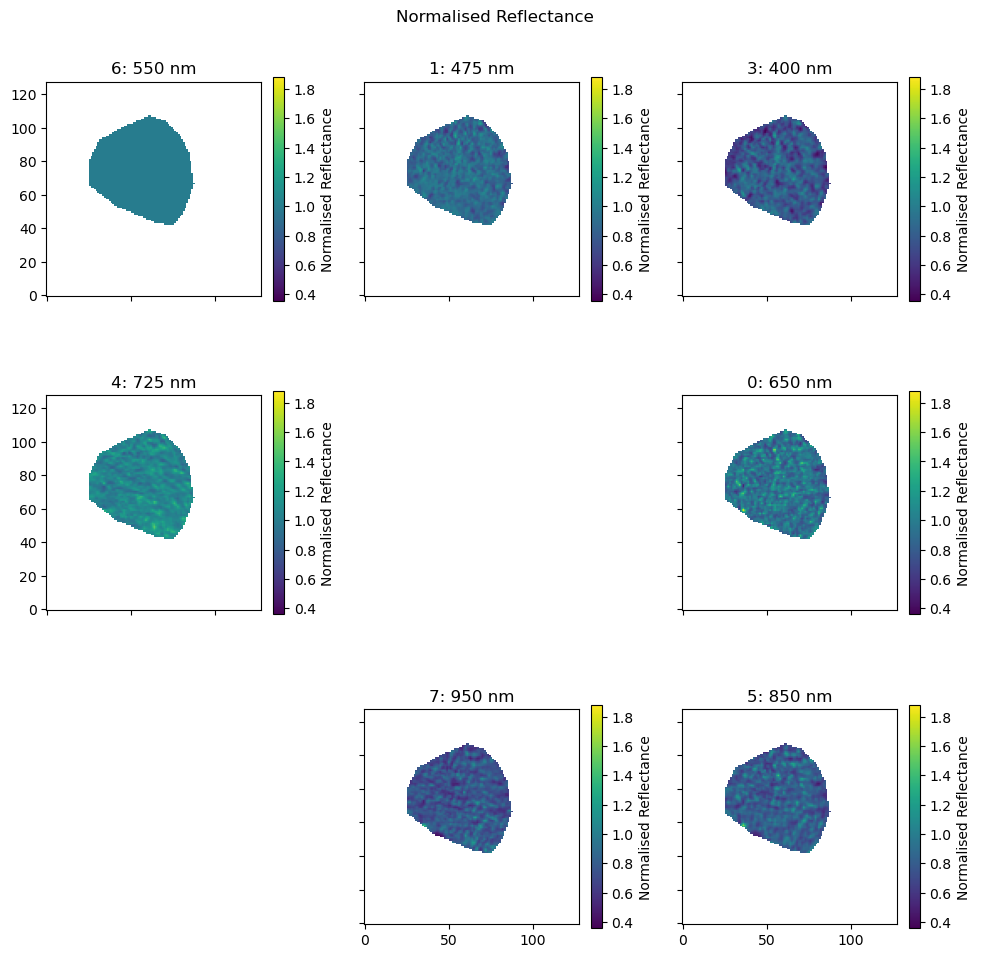

In [64]:
norm_refl = osp.normalise_reflectance(aligned_refl)

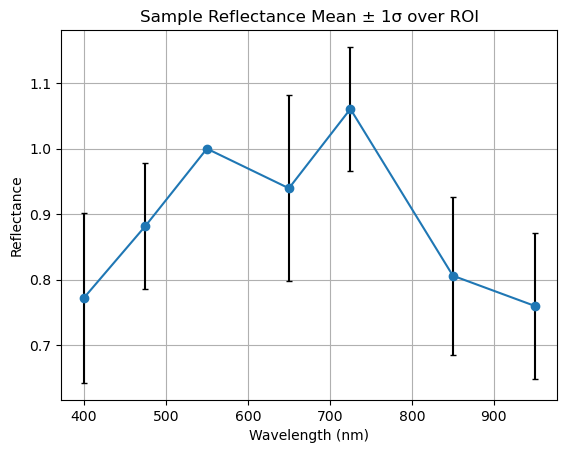

In [65]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

## Right

### Reflectance Calibration

Loading sample_5_r: 0 (650 nm)
Loading sample_5_r: 1 (475 nm)
Loading sample_5_r: 3 (400 nm)
Loading sample_5_r: 4 (725 nm)
Loading sample_5_r: 5 (850 nm)
Loading sample_5_r: 6 (550 nm)
Loading sample_5_r: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\sample_5_r\0_650
Mean image written to ..\data\sample_5_r\0_650\650_mean_rfl.tif
Error image written to ..\data\sample_5_r\0_650\650_error_rfl.tif
..\data\sample_5_r\1_475
Mean image written to ..\data\sample_5_r\1_475\475_mean_rfl.tif
Error image written to ..\data\sample_5_r\1_475\475_error_rfl.tif
..\data\sample_5_r\3_400
Mean image written to ..\data\sample_5_r\3_400\400_mean_rfl.tif
Error image written to ..\data\sample_5_r\3_400\400_error_rfl.tif
..\data\sample_5_r\4_725
Mean image written to ..\data\sample_5_r\4_725\725_mean_rfl.tif
Error image written to ..\data\sample_5_r\4_725\725_error_rfl.tif
..\data\sample_5_r\5_850
Mean image written to ..\data\sample_5_r\5_850\850_mean_rfl.tif
Error image written to ..\data\sample_5_r\5_850\850_error_rfl.tif
..\data\sample_5_r\6_550
Mean image written to ..\data\sample_5_r\6_550\550_mean_rfl.tif
Error image written to ..\data\sample_5_r\6_550\550_error_rfl.tif
..\data\sample_5_r\7_950
Mean image written to ..\data\sample_5_r\7_95

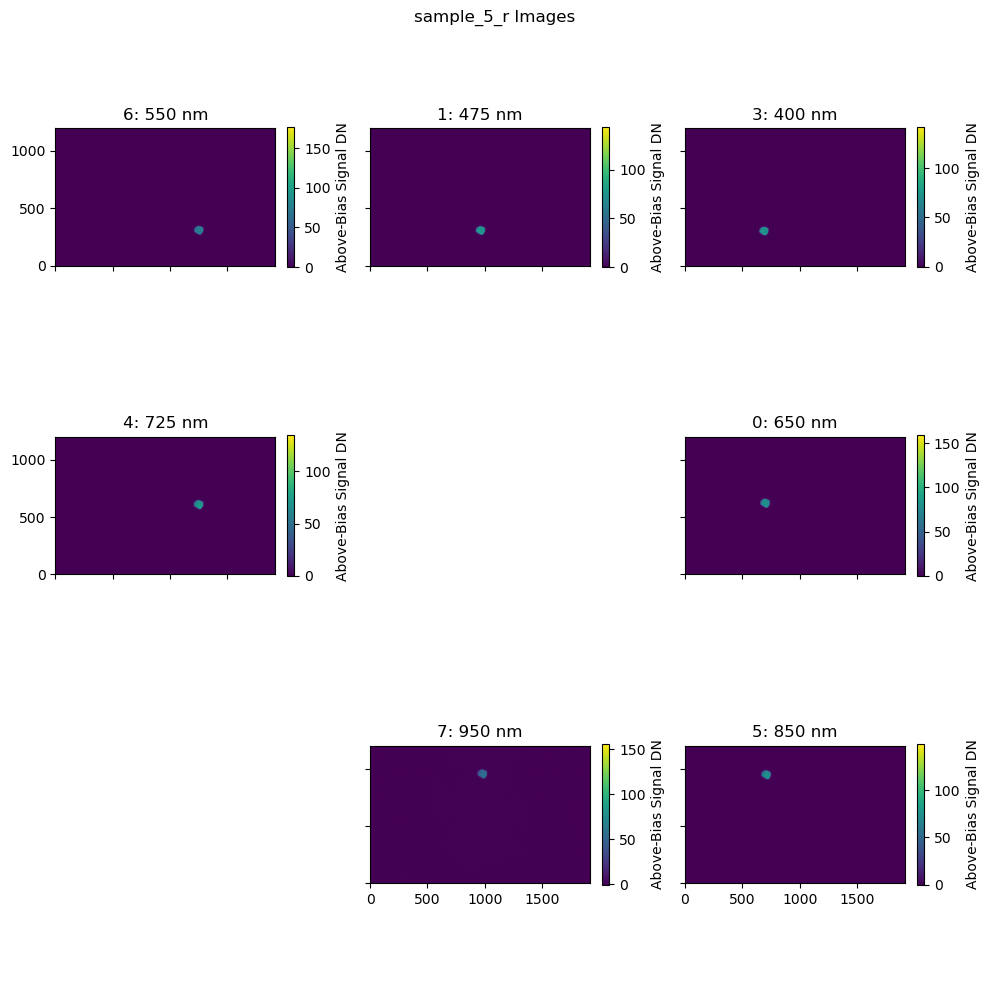

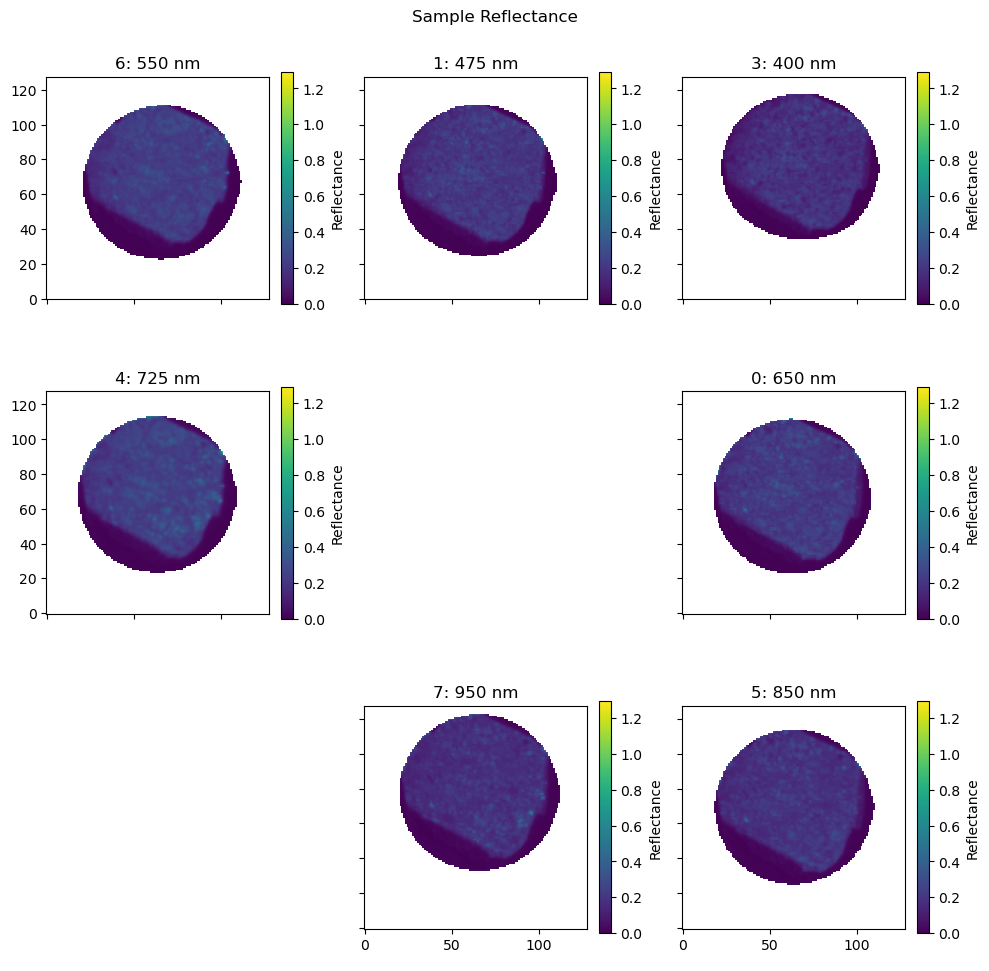

In [66]:
smpl_imgs = osp.load_sample('sample_5_r')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

### Geometric Alignment

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


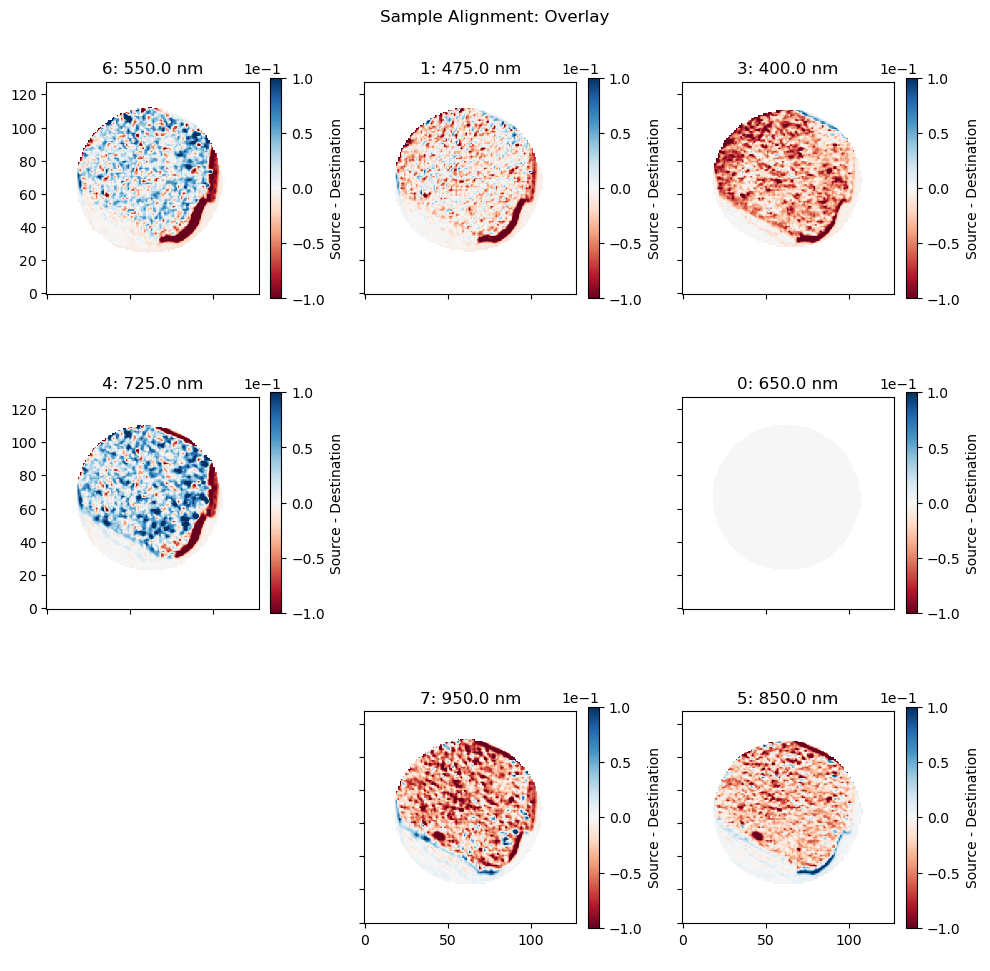

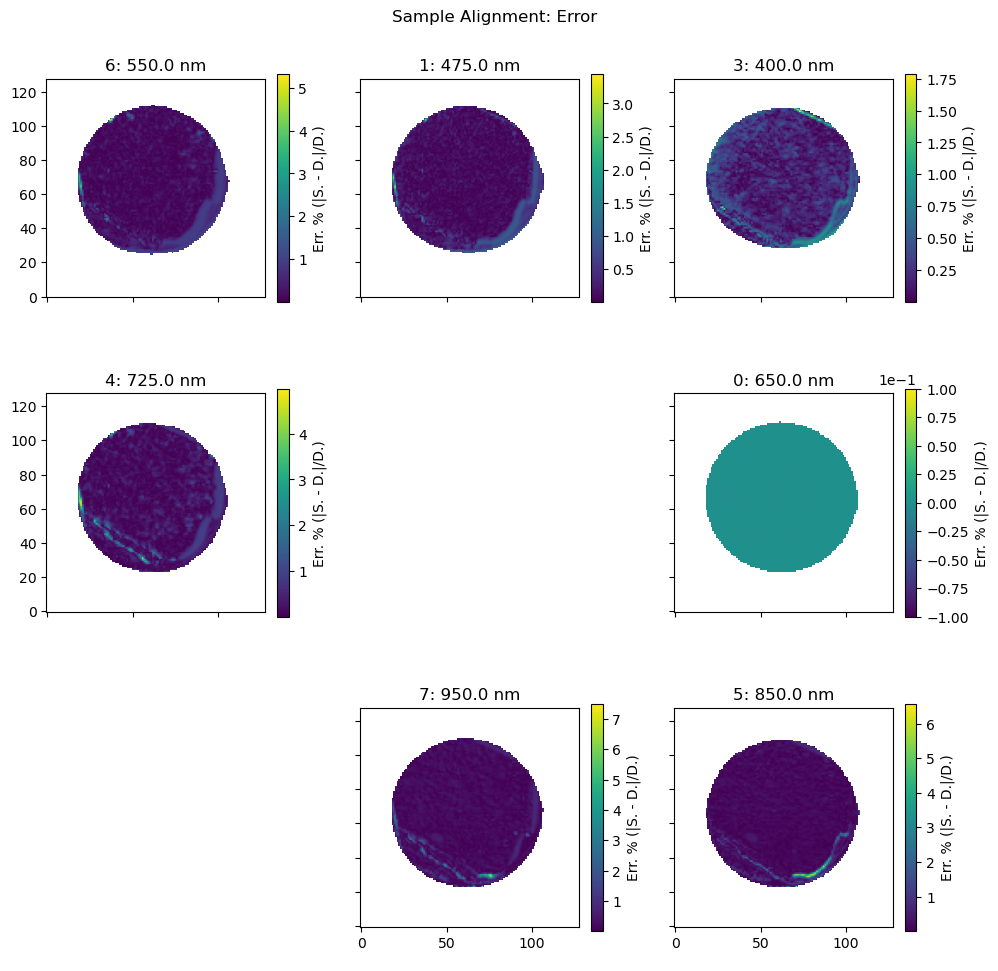

In [67]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

### Reflectance ROI Selection and Plotting

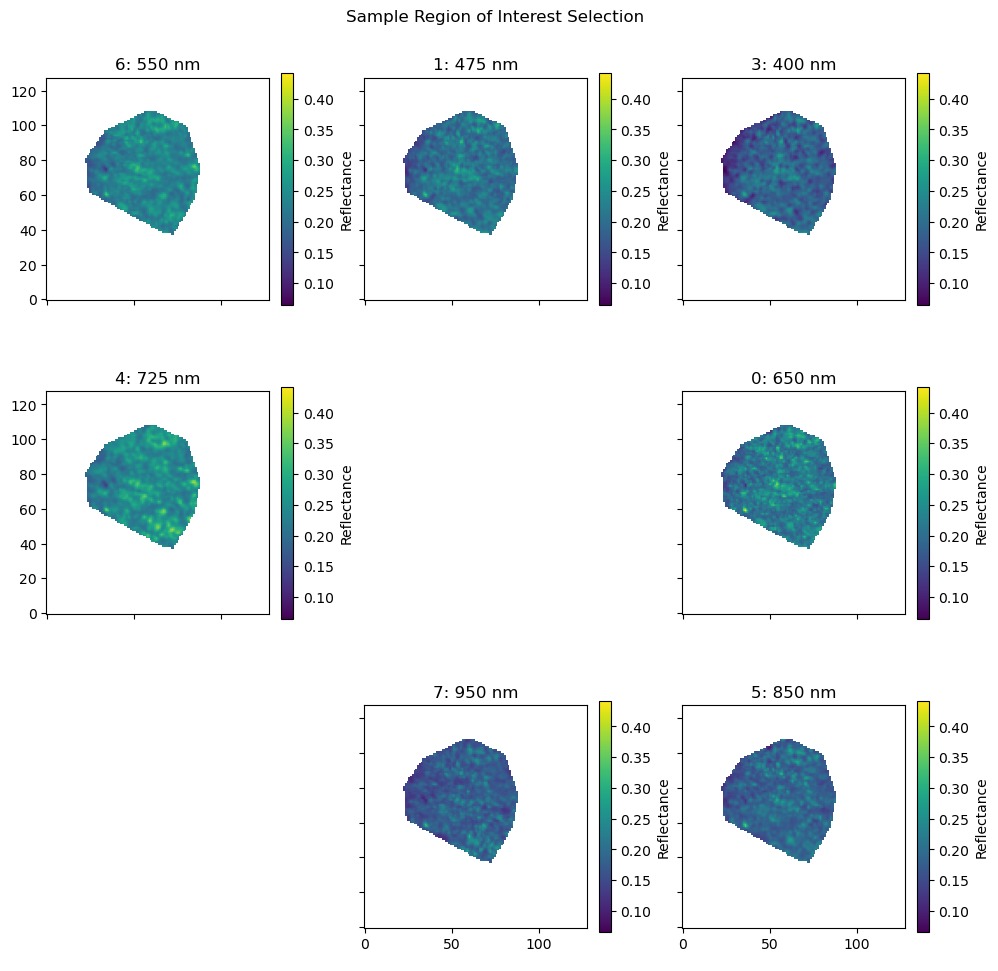

In [68]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

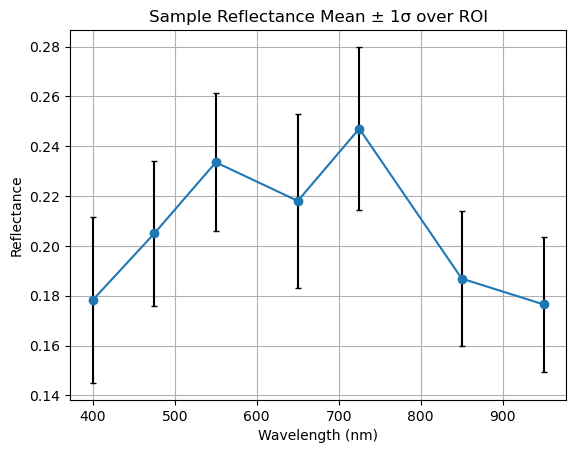

In [69]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


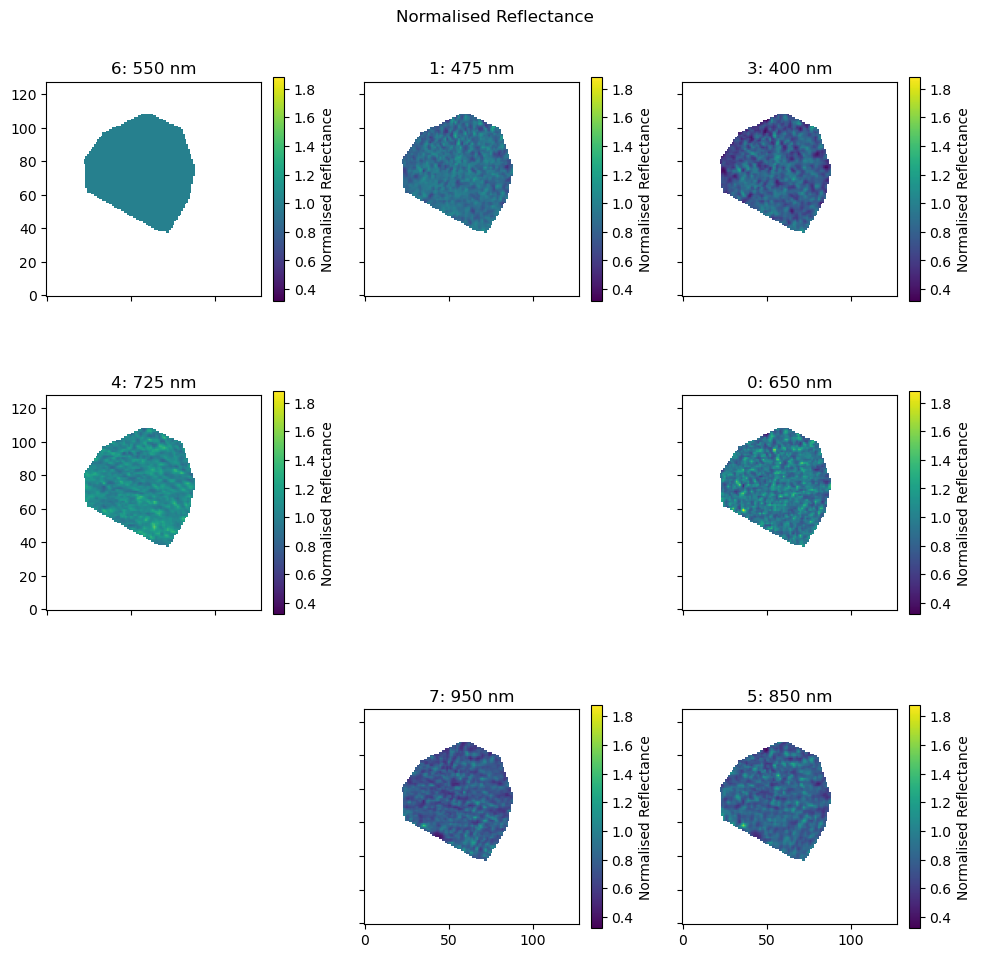

In [70]:
norm_refl = osp.normalise_reflectance(aligned_refl)

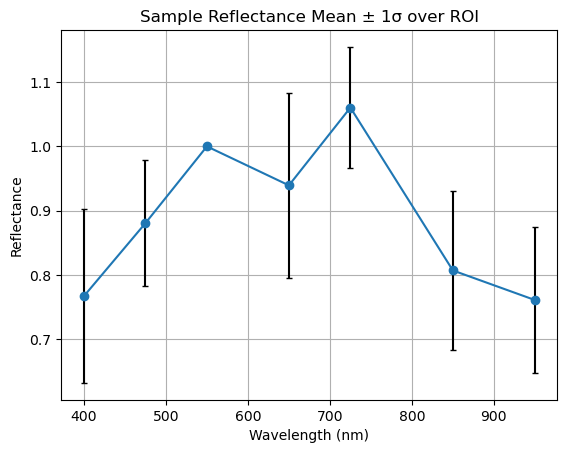

In [71]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

# Checking the Dark and Light Reflectance Calibration After Imaging

Loading Calibration Target for: 0 (650 nm)
Loading Calibration Target for: 1 (475 nm)
Loading Calibration Target for: 3 (400 nm)
Loading Calibration Target for: 4 (725 nm)
Loading Calibration Target for: 5 (850 nm)
Loading Calibration Target for: 6 (550 nm)
Loading Calibration Target for: 7 (950 nm)
Finding Reflectance Correction for: 0 (650 nm)
Finding Reflectance Correction for: 1 (475 nm)
Finding Reflectance Correction for: 3 (400 nm)
Finding Reflectance Correction for: 4 (725 nm)
Finding Reflectance Correction for: 5 (850 nm)
Finding Reflectance Correction for: 6 (550 nm)
Finding Reflectance Correction for: 7 (950 nm)


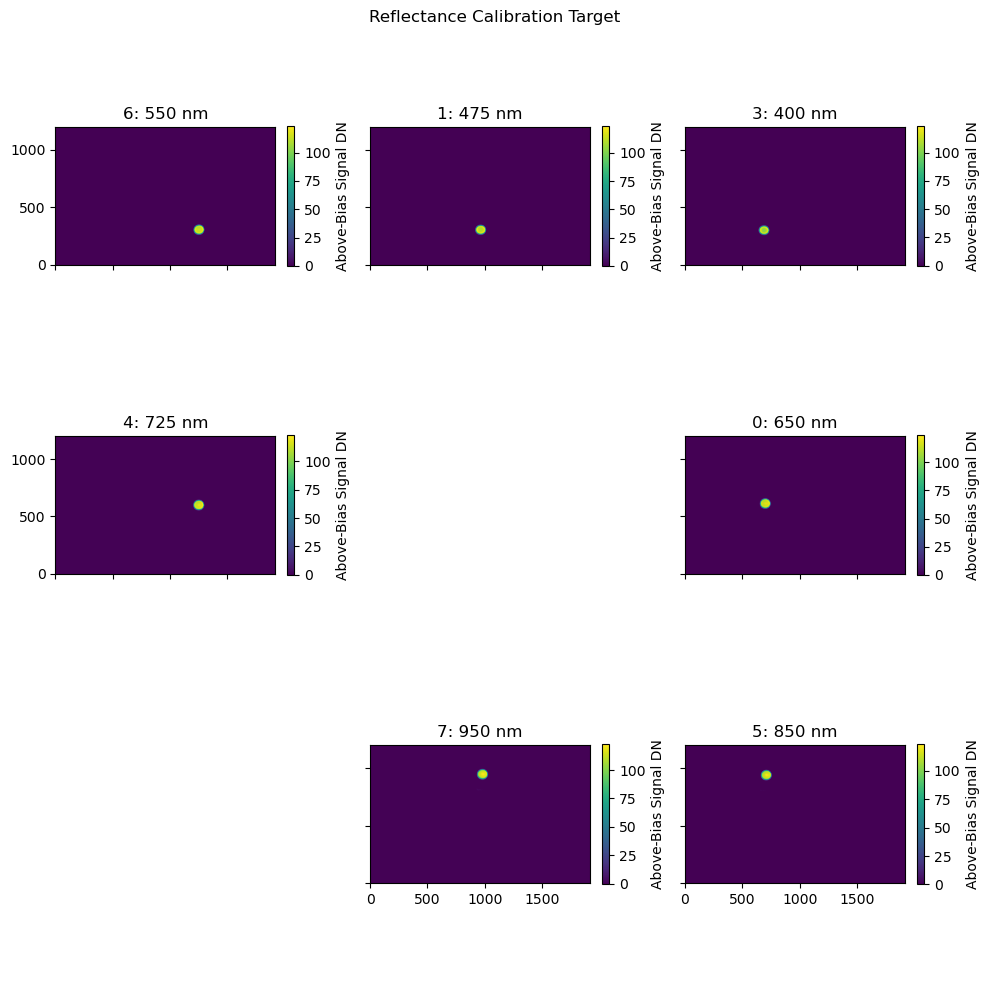

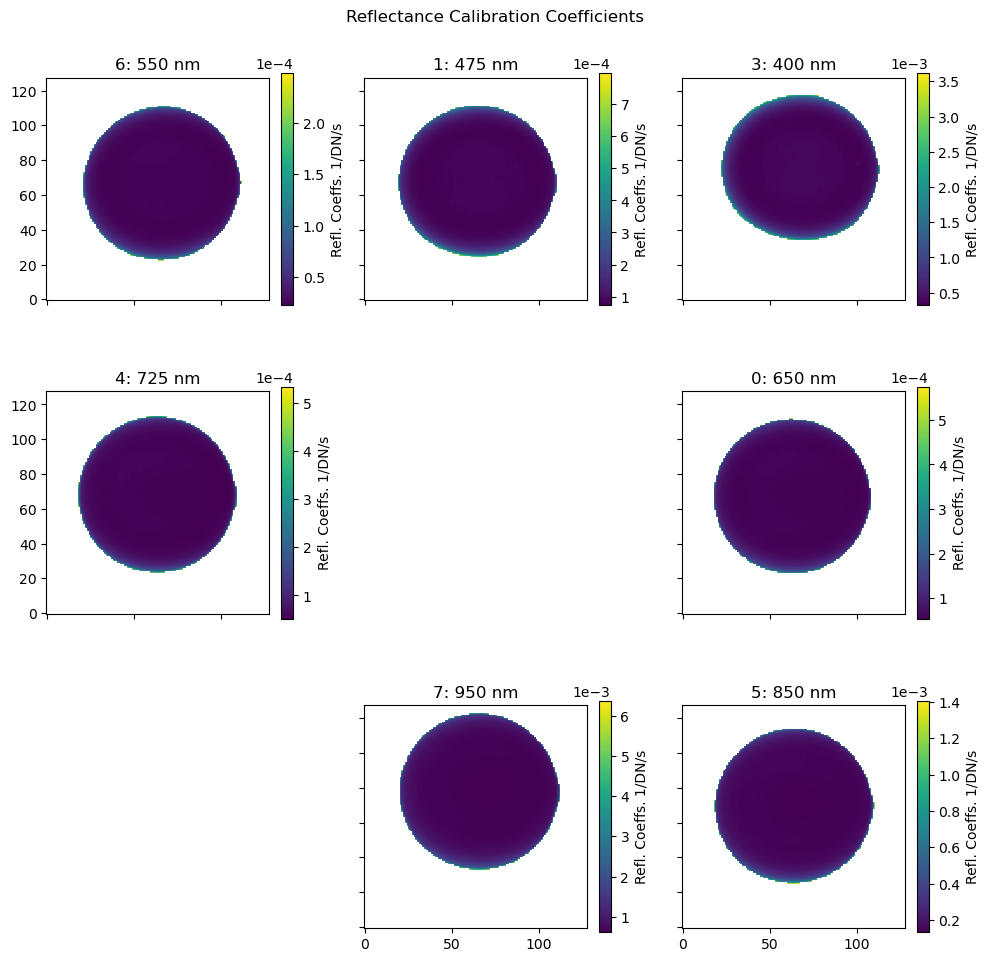

In [76]:
cali_imgs = osp.load_reflectance_calibration('reflectance_calibration')
cali_coeffs = osp.calibrate_reflectance(cali_imgs)

# Sample Reflectance Calibration and Coalignment
- Load, average and bias correct Sample images
- Correct for exposure
- Apply calibration coefficient frames
- Optional: mask for Calibration Target area and Sample area.
- Save reflectance images

## Checking against the dark calibration target

- expect to be near 0.1, but not exactly 0.1

Loading dark_reflectance_calibration_2: 0 (650 nm)
Loading dark_reflectance_calibration_2: 1 (475 nm)
Loading dark_reflectance_calibration_2: 3 (400 nm)
Loading dark_reflectance_calibration_2: 4 (725 nm)
Loading dark_reflectance_calibration_2: 5 (850 nm)
Loading dark_reflectance_calibration_2: 6 (550 nm)
Loading dark_reflectance_calibration_2: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\dark_reflectance_calibration_2\0_650
Mean image written to ..\data\dark_reflectance_calibration_2\0_650\650_mean_rfl.tif
Error image written to ..\data\dark_reflectance_calibration_2\0_650\650_error_rfl.tif
..\data\dark_reflectance_calibration_2\1_475
Mean image written to ..\data\dark_reflectance_calibration_2\1_475\475_mean_rfl.tif
Error image written to ..\data\dark_reflectance_calibration_2\1_475\475_error_rfl.tif
..\data\dark_reflectance_calibration_2\3_400
Mean image written to ..\data\dark_reflectance_calibration_2\3_400\400_mean_rfl.tif
Error image written to ..\data\dark_reflectance_calibration_2\3_400\400_error_rfl.tif
..\data\dark_reflectance_calibration_2\4_725
Mean image written to ..\data\dark_reflectance_calibration_2\4_725\725_mean_rfl.tif
Error image written to ..\data\dark_reflectance_calibration_2\4_725\725_error_rfl.tif
..\data\dark_reflectance_calibration_2\5_850
Mean image written to ..\data\dark_reflectance_calibration_2\5_850\850_mean_rfl.tif
Error image

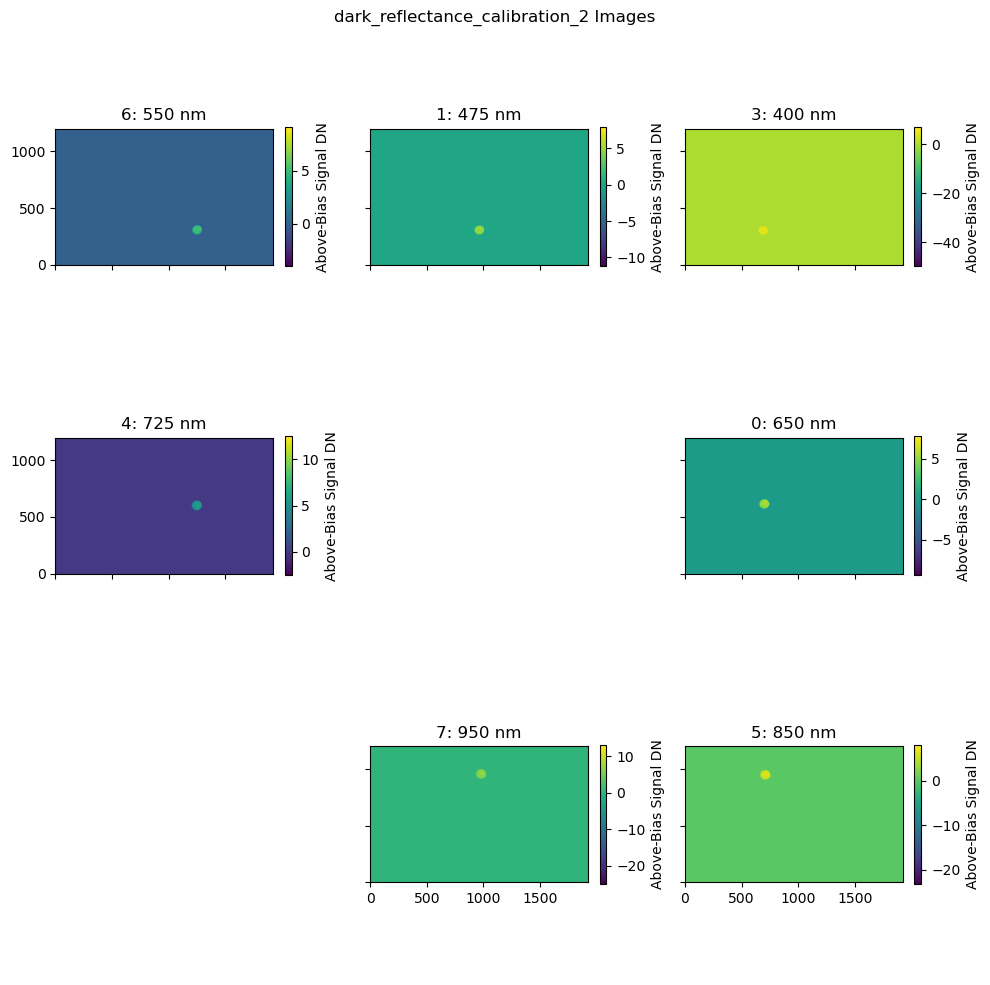

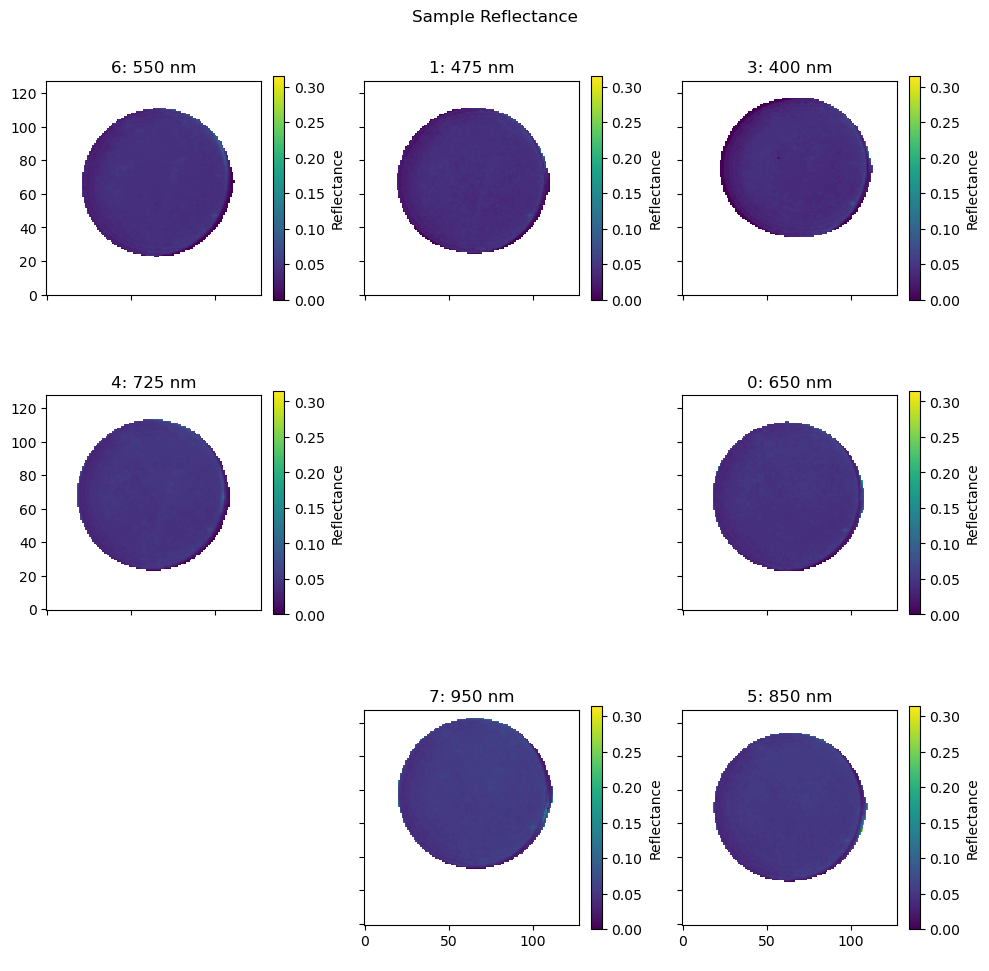

In [77]:
smpl_imgs = osp.load_sample('dark_reflectance_calibration_2')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: divide by zero encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


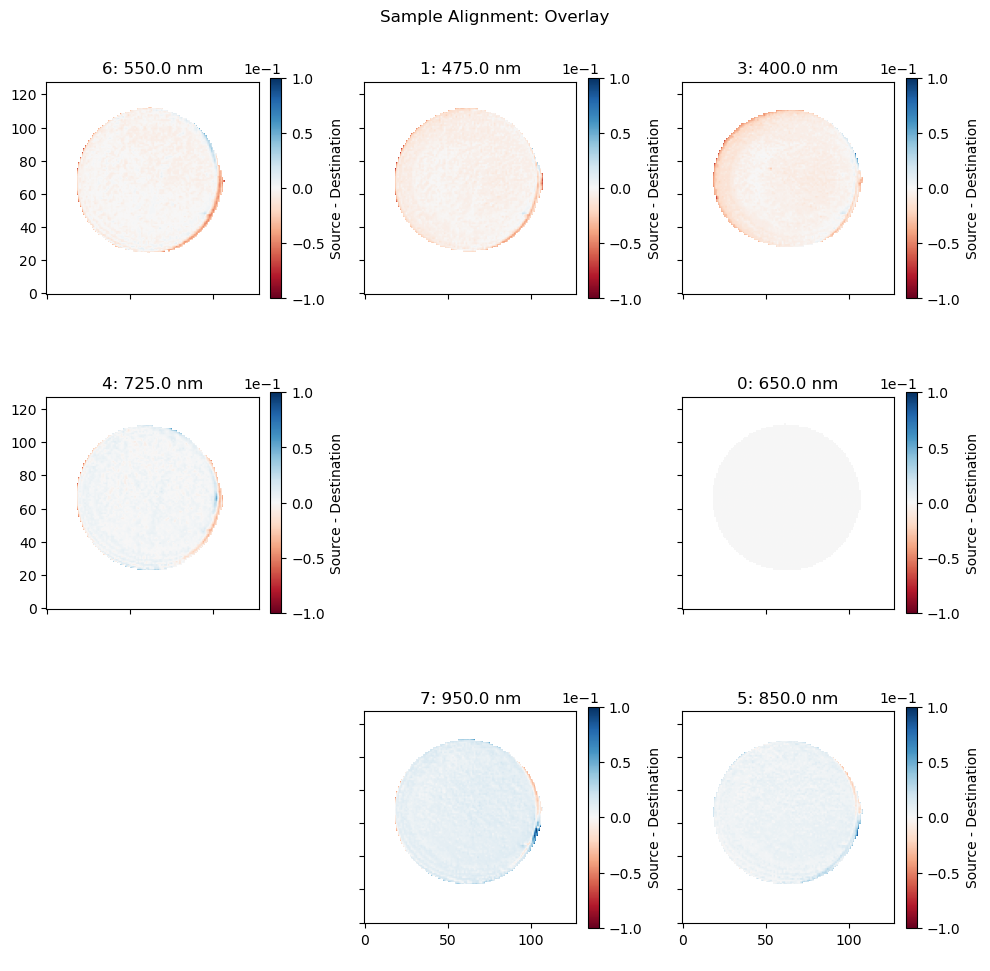

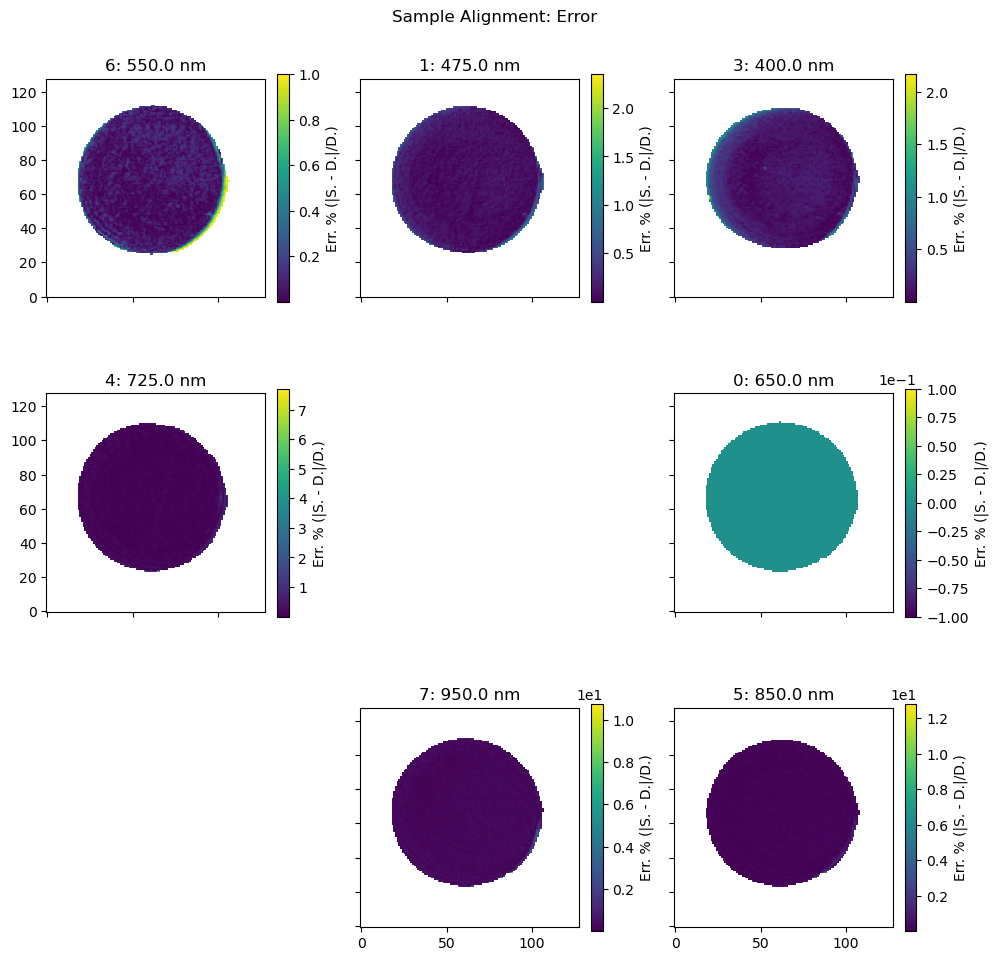

In [78]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

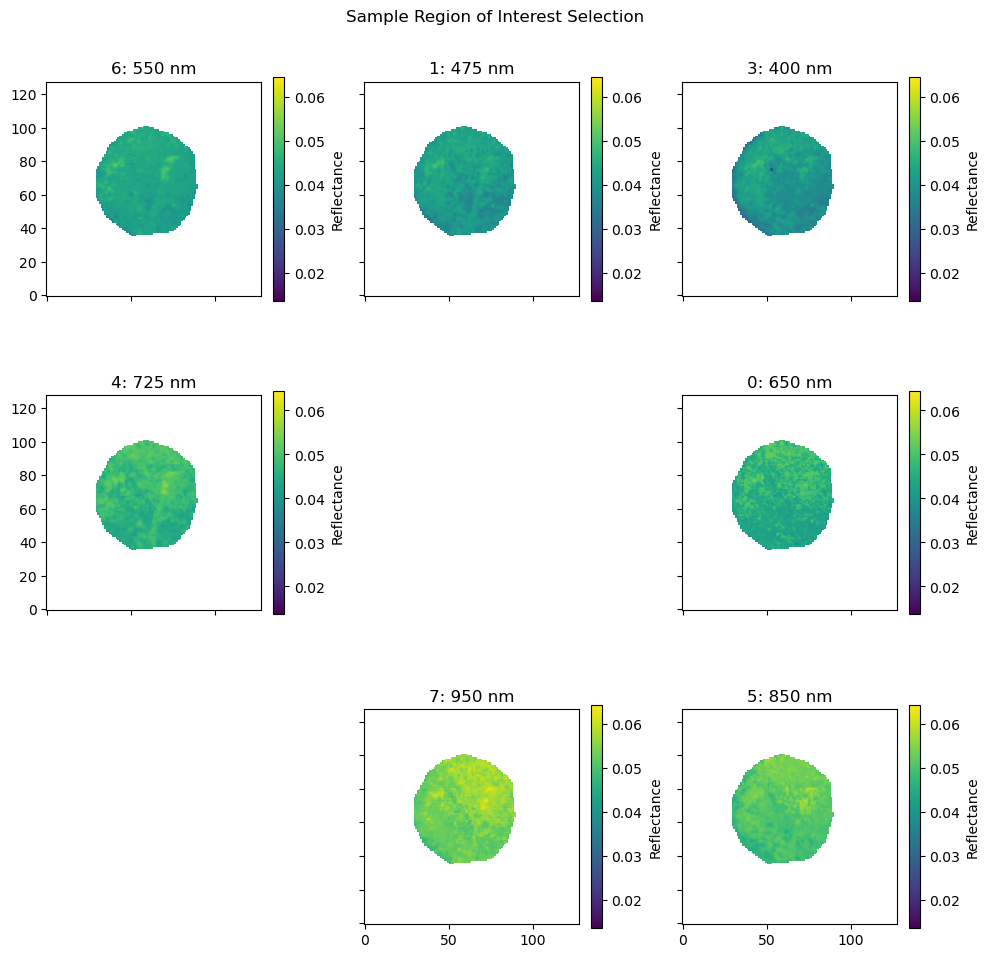

In [79]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

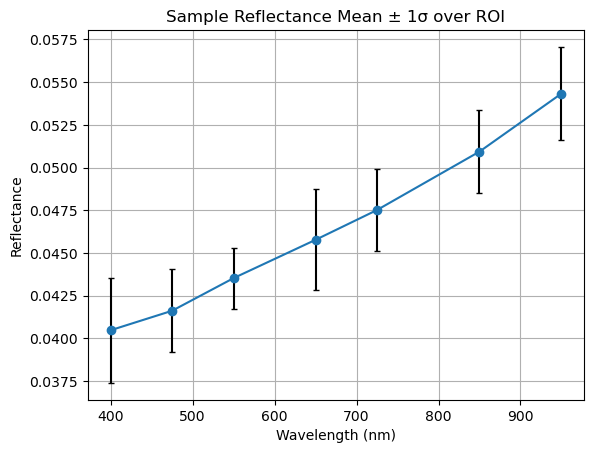

In [80]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: divide by zero encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


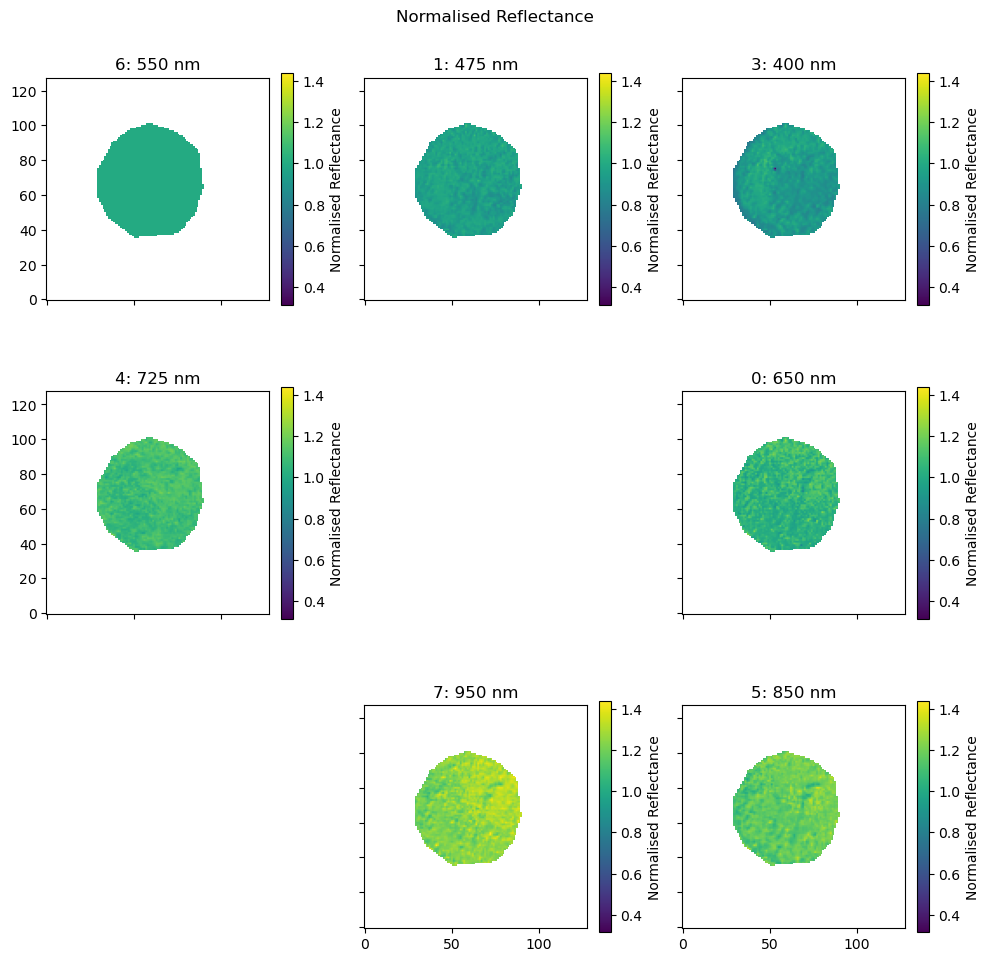

In [81]:
norm_refl = osp.normalise_reflectance(aligned_refl)

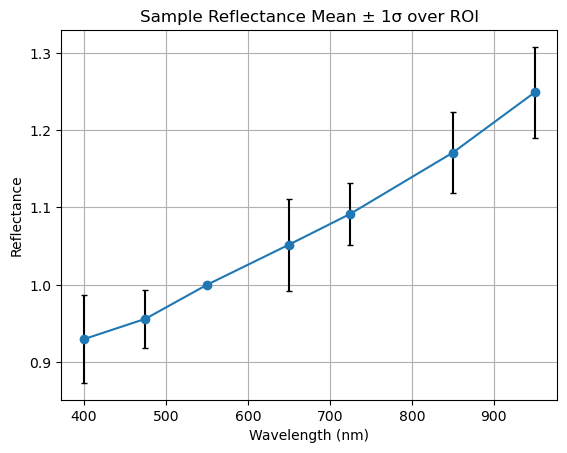

In [82]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)

## Checking against the light calibration target

- expect to be near 1.0, but not exactly 1.0

Loading reflectance_calibration_2: 0 (650 nm)
Loading reflectance_calibration_2: 1 (475 nm)
Loading reflectance_calibration_2: 3 (400 nm)
Loading reflectance_calibration_2: 4 (725 nm)
Loading reflectance_calibration_2: 5 (850 nm)
Loading reflectance_calibration_2: 6 (550 nm)
Loading reflectance_calibration_2: 7 (950 nm)


C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:377: RuntimeWarning: invalid value encountered in multiply
  self.img_ave = self.img_ave * cali_source.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:379: RuntimeWarning: invalid value encountered in divide
  lght_err = self.img_std/lst_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:380: RuntimeWarning: invalid value encountered in divide
  cali_err = cali_source.img_std/cali_source.img_ave


..\data\reflectance_calibration_2\0_650
Mean image written to ..\data\reflectance_calibration_2\0_650\650_mean_rfl.tif
Error image written to ..\data\reflectance_calibration_2\0_650\650_error_rfl.tif
..\data\reflectance_calibration_2\1_475
Mean image written to ..\data\reflectance_calibration_2\1_475\475_mean_rfl.tif
Error image written to ..\data\reflectance_calibration_2\1_475\475_error_rfl.tif
..\data\reflectance_calibration_2\3_400
Mean image written to ..\data\reflectance_calibration_2\3_400\400_mean_rfl.tif
Error image written to ..\data\reflectance_calibration_2\3_400\400_error_rfl.tif
..\data\reflectance_calibration_2\4_725
Mean image written to ..\data\reflectance_calibration_2\4_725\725_mean_rfl.tif
Error image written to ..\data\reflectance_calibration_2\4_725\725_error_rfl.tif
..\data\reflectance_calibration_2\5_850
Mean image written to ..\data\reflectance_calibration_2\5_850\850_mean_rfl.tif
Error image written to ..\data\reflectance_calibration_2\5_850\850_error_rfl.tif


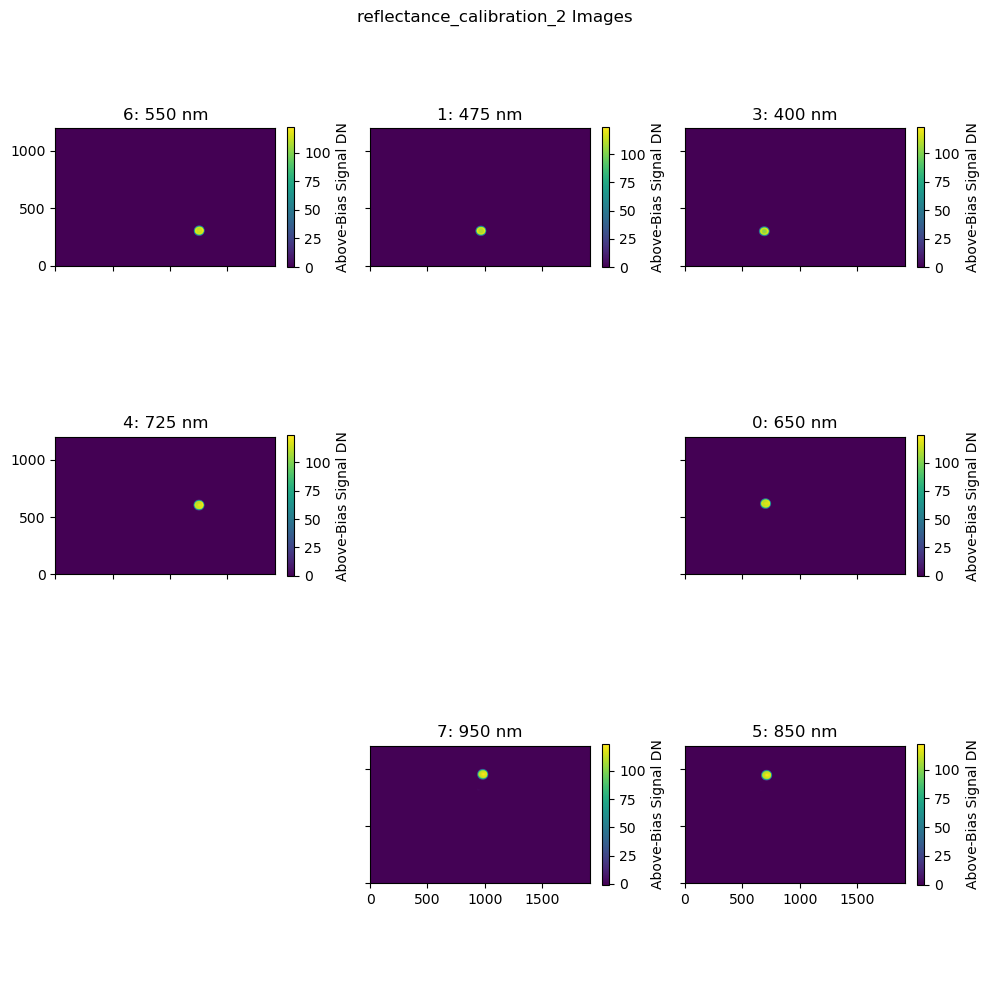

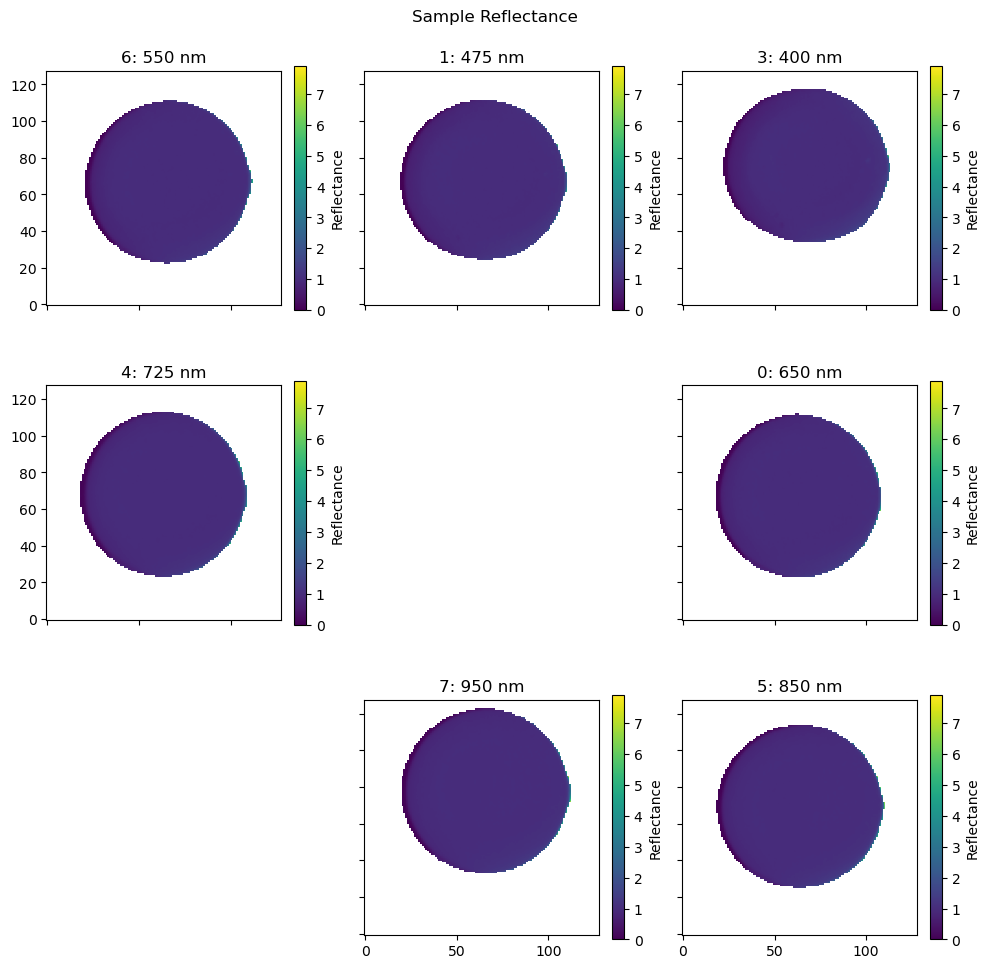

In [83]:
smpl_imgs = osp.load_sample('reflectance_calibration_2')
reflectance = osp.apply_reflectance_calibration(smpl_imgs, cali_coeffs)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:547: RuntimeWarning: invalid value encountered in subtract
  src = ax.imshow(query_reg-train_img, cmap='RdBu', origin='lower', vmin=-col_max, vmax=col_max)
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in subtract
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:551: RuntimeWarning: invalid value encountered in divide
  err = ax.imshow(np.abs(query_reg-train_img)/train_img, origin='lower')


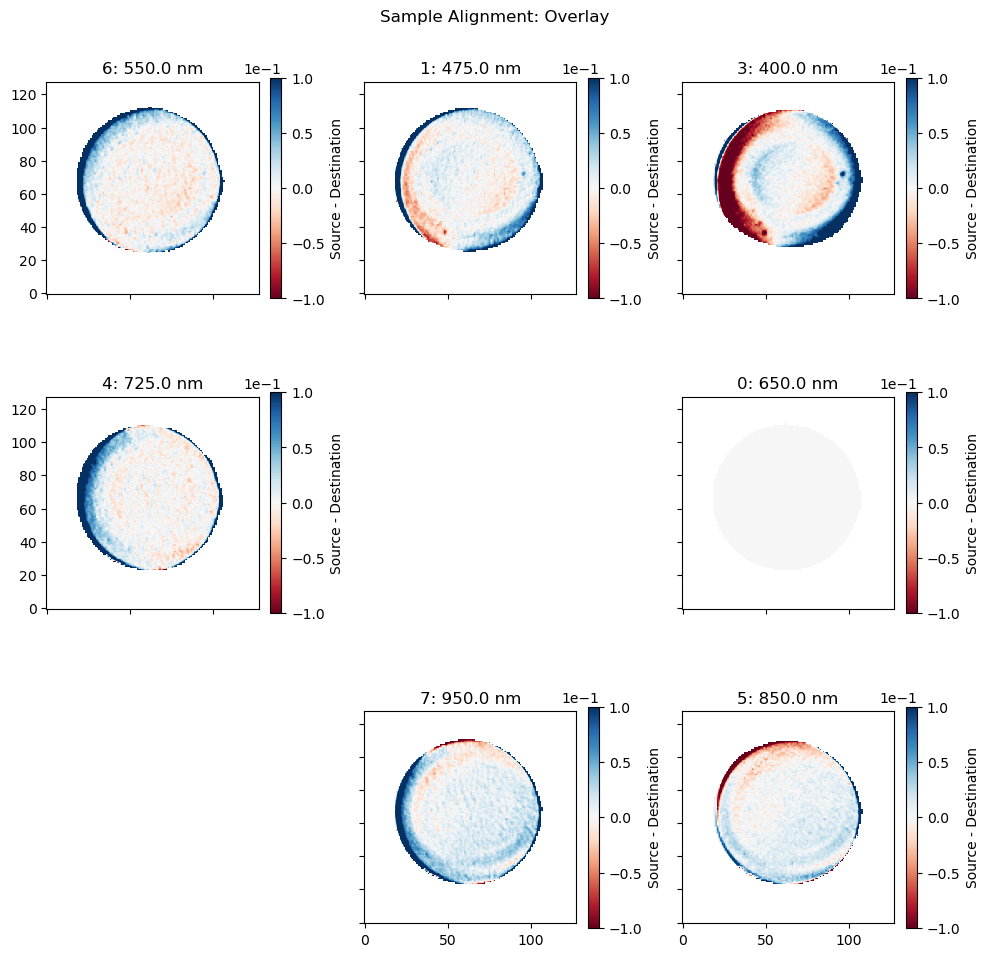

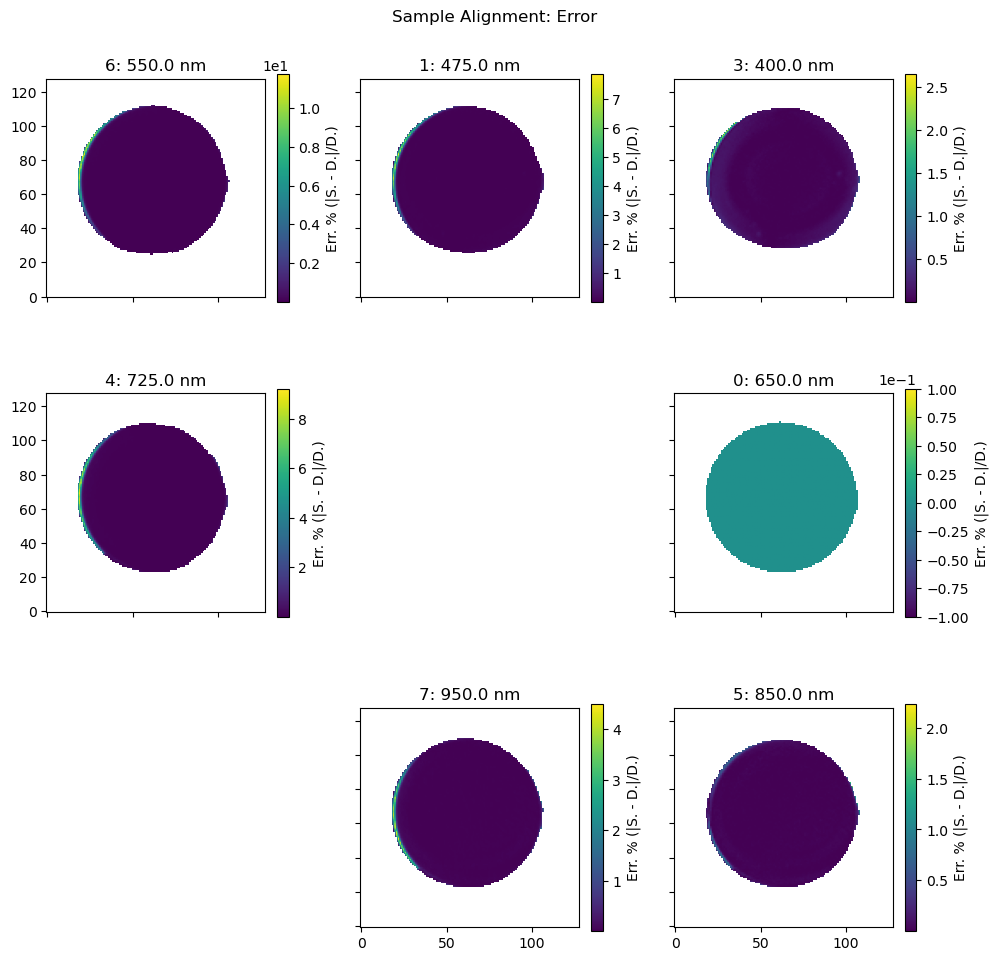

In [84]:
aligned_refl = osp.apply_coalignment(reflectance, coals)

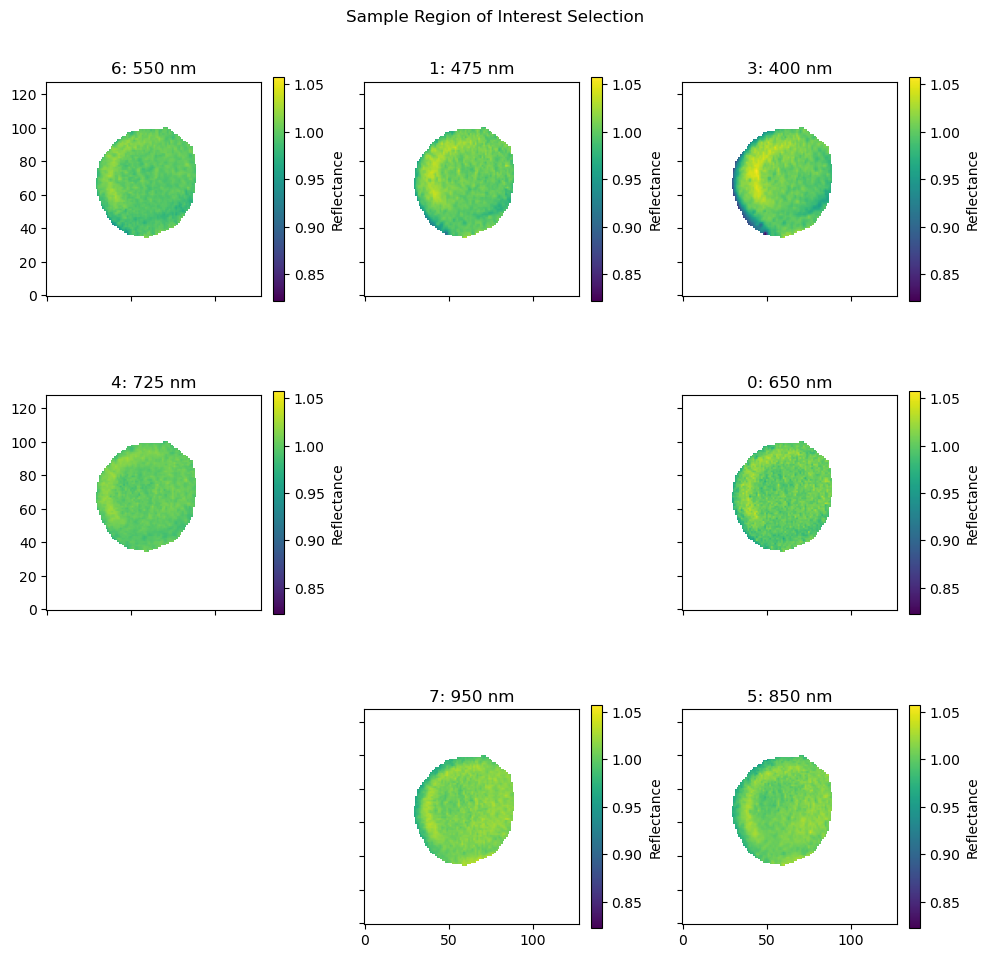

In [85]:
aligned_refl_rois = osp.set_roi(aligned_refl, base_channel='6_550')

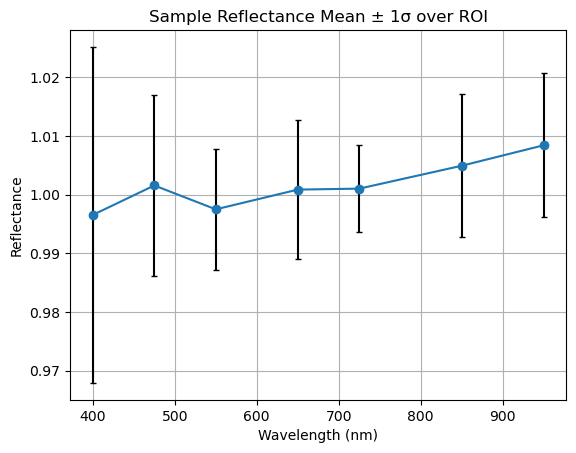

In [86]:
results = osp.plot_roi_reflectance(refl_imgs=aligned_refl_rois)

C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:386: RuntimeWarning: invalid value encountered in divide
  self.img_ave = self.img_ave / base.img_ave
C:\Users\kameken\rstabbins\orochi_simulator_control\src\orochi_sim_proc.py:767: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


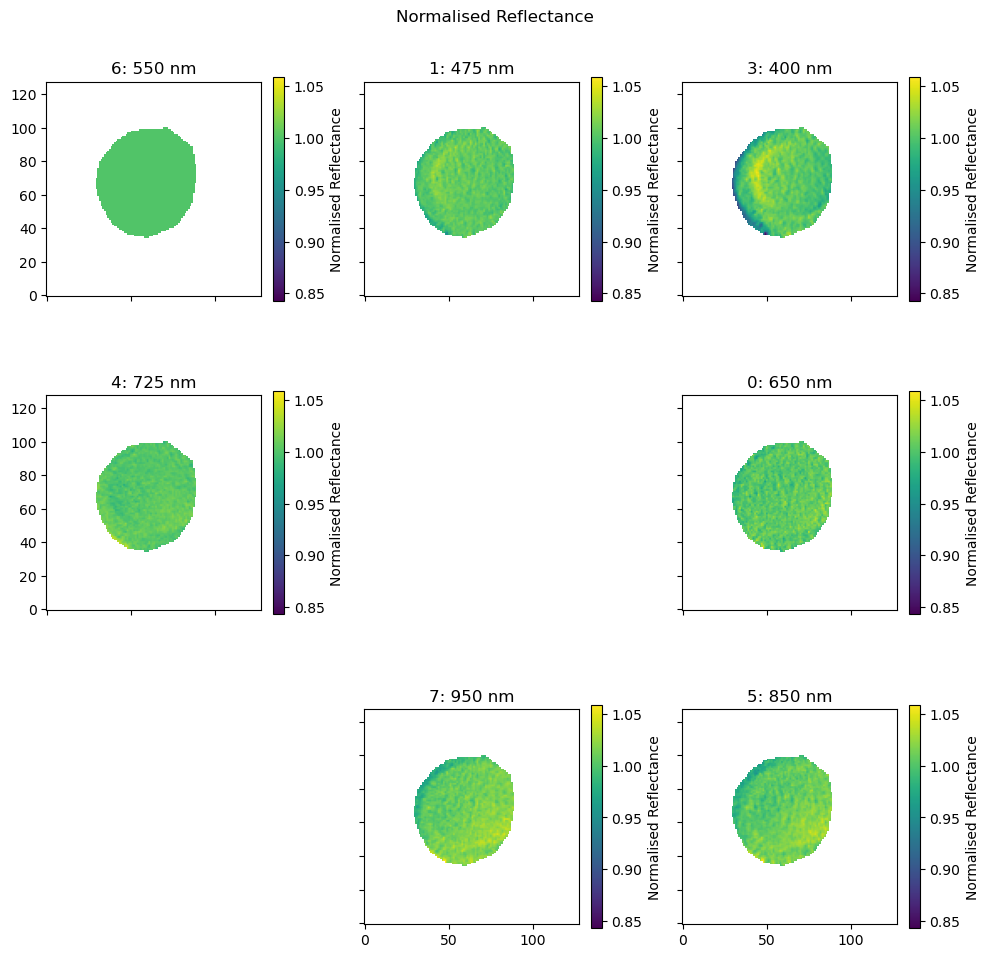

In [87]:
norm_refl = osp.normalise_reflectance(aligned_refl)

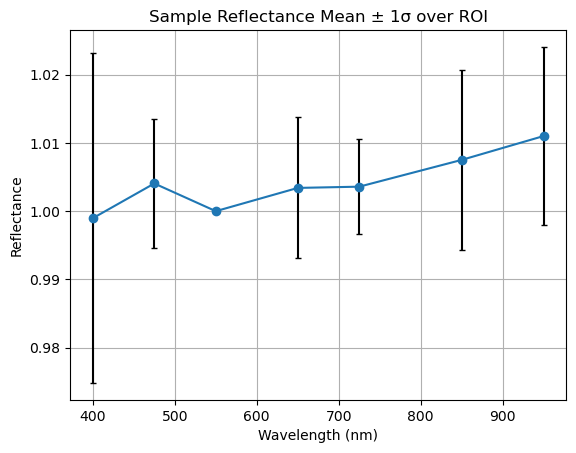

In [88]:
results = osp.plot_roi_reflectance(refl_imgs=norm_refl)